<a href="https://colab.research.google.com/github/minhdieuvu08/Mental_Attention_States_Classification_Using_EEG_Data/blob/main/Mental_Attention_States_Classification_Using_EEG_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **EEG data for Mental Attention State Detection**

## **I. Data Preprocessing and Visualization**

### **Importing all required libraries and mounting google drive**

If having issue with community package, please uncomment this line out and run it

In [ ]:
# !pip uninstall networkx python-louvain community
!pip install python-louvain

In [ ]:
import numpy as np
import pandas as pd
import csv
import pickle
import os
import seaborn as sns

import scipy.io
from scipy.io import loadmat
from scipy.signal import butter, filtfilt, welch
from scipy.stats import zscore, skew, kurtosis, entropy

import networkx as nx
import matplotlib.pyplot as plt
import io
import community
from community import community_louvain
import matplotlib.cm as cm
from collections import defaultdict

from sklearn.model_selection import train_test_split, KFold, cross_val_score, StratifiedKFold
from sklearn import preprocessing
from sklearn.svm import SVC
from sklearn.decomposition import PCA, FastICA
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_curve, auc, make_scorer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import KBinsDiscretizer, StandardScaler
from sklearn.multioutput import MultiOutputClassifier

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, SimpleRNN
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


### **Understanding the Data**

The data is sampled at a frequency of 128Hz:
- The first 10 minutes (t=0 to t=10 minutes) represent the "focused" state.
- The next 10 minutes (t=10 to t=20 minutes) represent the "unfocused" state.
- The remaining time (t=20 minutes onwards) represents the "drowsy" state.

Therefore, the data can be segmented as follows:
- **Focused**: rows 0 to 128 * 10 * 60
- **Unfocused**: rows 128 * 10 * 60 to 128 * 20 * 60
- **Drowsy**: rows 128 * 20 * 60 to the last row

In this study, EEG data was collected from 5 subjects over 7 separate days, with the exception of subject 5 who recorded for 6 days. To ensure the reliability and validity of the analysis, only the last 5 trials of each subject were considered. This decision was made due to the presence of an initial acclimatization period.

**Acclimatization Period and Data Reliability**

The first 2 days of data collection served as an acclimatization period, allowing participants to become familiar with the experimental procedure and equipment. EEG data can be sensitive to various factors, including stress, anxiety, or unfamiliarity with the recording environment. By having this initial acclimatization period, potential biases or discomfort that could affect the participants' natural brain activity during the data recording sessions were minimized.

**Focus on Representative Data**

Considering only the last 5 trials allowed us to focus on data collected after the participants had adjusted to the experimental setting. This ensured that the EEG data used for analysis primarily reflects the participants' brain activity related to the intended mental states (focused, unfocused, drowsy) rather than being influenced by external factors. This approach is consistent with standard practices in EEG research to improve data validity and reliability.

Therefore, by excluding the data from the first 2 days and focusing on the last 5 trials, we aimed to obtain a more accurate and representative dataset for investigating the neural correlates of mental attention states.

- **Subjects**: 5
- **Trials of each subject**: 5 (Note: subject 5 only has 4 trials)



### Plotting EEG signals

In [ ]:
# Define data directory and check data availability
drive_root = '/content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data'
data_root = os.path.join(drive_root, 'EEG Data')
for dirname, _, filenames in os.walk(data_root):
    print('Data directory: ',dirname)
    for filename in filenames:
        print(filename)

Data directory:  /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/EEG Data
eeg_record10.mat
eeg_record1.mat
eeg_record12.mat
eeg_record11.mat
eeg_record13.mat
eeg_record15.mat
eeg_record17.mat
eeg_record16.mat
eeg_record18.mat
eeg_record14.mat
eeg_record24.mat
eeg_record2.mat
eeg_record20.mat
eeg_record19.mat
eeg_record21.mat
eeg_record22.mat
eeg_record23.mat
eeg_record25.mat
eeg_record26.mat
eeg_record27.mat
eeg_record29.mat
eeg_record28.mat
eeg_record3.mat
eeg_record33.mat
eeg_record30.mat
eeg_record31.mat
eeg_record32.mat
eeg_record4.mat
eeg_record34.mat
eeg_record7.mat
eeg_record9.mat
eeg_record8.mat
eeg_record6.mat
eeg_record5.mat


In [ ]:
# Total number of data files
files = os.listdir(data_root)
print("Total number of data files:", len(files))

Total number of data files: 34


In [ ]:
"""Step 1: Extract and load the relevant EEG data channels (4–17) from the provided Matlab files."""
#  Function to read in the EEG data and extract the valid lead data, low and high pass filter and z-transform the data.
#  Returns a dataframe.
def get_EEG_data(data_root, filename):
    """
    Loads EEG data from a .mat file, extracts relevant channels, applies a bandpass filter,
    and returns a pandas DataFrame.

    Args:
        data_root (str): Path to the directory containing the EEG data files.
        filename (str): Name of the .mat file to load.

    Returns:
        pd.DataFrame: DataFrame containing the filtered EEG data for the selected channels.
    """
    # Define sampling frequency
    hz = 128
    # Load and extract the EEG data from the loaded file into a pandas DataFrame
    mat = scipy.io.loadmat(f"{data_root}/{filename}")
    data = pd.DataFrame.from_dict(mat["o"]["data"][0,0])

    # Select relevant channels (4-17) and rename them
    labels = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']
    dat = data.iloc[:, 3:17] # Directly select columns 3 to 16 (inclusive)
    dat.columns = labels

    # Apply bandpass filter (2Hz - 40Hz) using the bp_filter function
    lo, hi = 2, 40
    datf = bp_filter(dat.to_numpy(), lo, hi, hz)

    # Convert filtered data back to a DataFrame
    dat = pd.DataFrame({c: datf[:, i] for i,c in enumerate(labels)})

    return dat

"""Step 2: Apply preprocess, normalize, scale, or any techniques to the data if you think it necessary for the task."""
def bp_filter(data, f_lo, f_hi, fs):
    """
    Applies a 6th-order Butterworth bandpass filter to the input data.

    Filtering to extract frequencies between f_lo and f_hi, commonly used for EEG analysis.
    Uses second-order sections (sos) format for better numerical stability.

    Args:
        data: numpy.array, time along axis 0
        f_lo: Lower cutoff frequency (Hz)
        f_hi: Upper cutoff frequency (Hz)
        fs: Sampling frequency (Hz)
    Returns:
        data_filt: band-pass filtered data, same shape as data
    """
    data_filt = np.zeros_like(data)
    f_ny = fs / 2.  # Nyquist frequency
    b_lo = f_lo / f_ny  # normalized frequency [0..1]
    b_hi = f_hi / f_ny  # normalized frequency [0..1]
    # band-pass filter parameters
    p_lp = {"N":6, "Wn":b_hi, "btype":"lowpass", "analog":False, "output":"ba"}
    p_hp = {"N":6, "Wn":b_lo, "btype":"highpass", "analog":False, "output":"ba"}
    bp_b1, bp_a1 = butter(**p_lp)
    bp_b2, bp_a2 = butter(**p_hp)
    data_filt = filtfilt(bp_b1, bp_a1, data, axis=0)
    data_filt = filtfilt(bp_b2, bp_a2, data_filt, axis=0)
    return data_filt

### **Explanation of the Code**

#### **Bandpass Filter Function**

This function, `bp_filter`, applies a digital bandpass filter to the input data using a 6th-order Butterworth filter. It takes the following parameters:
- `data`: The input data as a numpy array.
- `f_lo` and `f_hi`: The lower and upper frequency bounds for the bandpass filter.
- `fs`: The sampling frequency.

The function returns the filtered data, which retains only the frequencies within the specified range.

#### **Function to Read and Process EEG Data**

This function, `get_EEG_data`, reads EEG data from a `.mat` file, processes it, and returns a filtered and transformed DataFrame. Here's what it does step-by-step:
1. **Loading the Data**:
  - Loads the `.mat` file using `scipy.io.loadmat`.
  - Extracts the data into a DataFrame.

2. **Filtering Valid EEG Leads**:
  - Filters the data to include only the valid EEG leads (columns 3 to 17).
  - Renames the columns to a list of labels representing different EEG channels.

3. **Bandpass Filtering**:
  - **Motivation**: Raw EEG data often contains noise and artifacts from various sources, such as muscle activity, eye movements, and line noise. This noise can obscure the underlying brain activity signals that we are interested in analyzing.
  - **Action**: To address this, a bandpass filter is applied using the bp_filter function. This filter selectively allows frequencies within a specific range to pass through while attenuating frequencies outside this range.
  - **Frequency Range**: In this case, the filter is designed to keep frequencies between 2Hz and 40Hz. This range typically encompasses the frequencies associated with brain activity of interest in many EEG studies, including delta, theta, alpha, beta, and lower gamma bands.
  - **Benefits**: Bandpass filtering helps to:
      + Remove noise and artifacts: Improves the signal-to-noise ratio by attenuating unwanted frequencies.
      + Isolate relevant brain activity: Focuses the analysis on the frequency bands of interest.
      + Prepare data for further processing: Makes the data more suitable for feature extraction and machine learning.


4. **Converting Back to DataFrame**:
   - Converts the filtered data back to a DataFrame with the original labels.

5. **Return Statement**:
   - Returns the processed DataFrame containing the filtered and standardized EEG data.

In [ ]:
# For each file, print # minutes of data
for filename in files:
    dat = get_EEG_data(data_root, filename)
    # Compute microstates for this data
    eegdat = dat.to_numpy()
    # Calculate and print the duration of the recording in minutes.
    # This helps validate data completeness and segment data into different mental states.
    duration_minutes = np.round(len(eegdat) / 128 / 60, 3)  # len(eegdat): total samples, 128: sampling freq (Hz), 60: seconds/min
    print(filename, ' --->', duration_minutes, "minutes")

eeg_record1.mat  ---> 40.217 minutes
eeg_record10.mat  ---> 49.654 minutes
eeg_record16.mat  ---> 30.517 minutes
eeg_record17.mat  ---> 57.809 minutes
eeg_record12.mat  ---> 46.449 minutes
eeg_record15.mat  ---> 46.766 minutes
eeg_record11.mat  ---> 50.993 minutes
eeg_record13.mat  ---> 48.607 minutes
eeg_record14.mat  ---> 44.943 minutes
eeg_record2.mat  ---> 47.659 minutes
eeg_record20.mat  ---> 51.668 minutes
eeg_record18.mat  ---> 47.115 minutes
eeg_record21.mat  ---> 43.786 minutes
eeg_record22.mat  ---> 42.287 minutes
eeg_record19.mat  ---> 43.39 minutes
eeg_record23.mat  ---> 50.532 minutes
eeg_record28.mat  ---> 27.935 minutes
eeg_record25.mat  ---> 54.058 minutes
eeg_record26.mat  ---> 47.296 minutes
eeg_record29.mat  ---> 55.288 minutes
eeg_record24.mat  ---> 46.996 minutes
eeg_record27.mat  ---> 45.254 minutes
eeg_record31.mat  ---> 55.84 minutes
eeg_record30.mat  ---> 45.444 minutes
eeg_record3.mat  ---> 46.514 minutes
eeg_record33.mat  ---> 62.94 minutes
eeg_record32.mat  

### Let's try getting EEG data and create plots for subject 1 trial 1

In [ ]:
EEG_file_number = 3 # Because the first 2 days were for getting accustomed to the process, we take the third day of the first subject as the trial number 1
filename = 'eeg_record' + str(EEG_file_number) + '.mat'
dat = get_EEG_data(data_root, filename)
print(type(dat))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
# eeg_record3.mat
dat

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4
0,0.082287,-1.779883,-0.904811,-0.105007,0.162734,-0.216053,-0.204367,-1.188365,-1.756227,0.019028,-0.815825,-0.030448,0.051028,0.340948
1,0.061135,-7.541974,-5.762726,-2.269905,0.169065,-1.846661,-0.875720,-4.894565,-9.602011,0.017402,3.328369,-0.036867,1.489718,-4.708565
2,0.038920,-4.526035,-4.389608,-1.318582,0.174081,-1.715748,3.948902,0.053998,-6.782789,0.015517,5.692324,-0.041993,1.207855,-3.432527
3,0.010396,-0.077865,-0.832547,1.127395,0.177457,-0.779178,8.529421,2.761760,-3.750922,0.013378,4.810988,-0.048003,0.233618,-0.030107
4,-0.016888,-0.433308,-1.054676,2.566709,0.178986,-0.871482,9.630071,-0.181173,-6.697747,0.010993,3.342445,-0.055054,0.248620,0.443405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
357219,-0.044996,4.006272,7.250885,-1.483449,0.620788,1.816484,3.195737,-1.061830,6.752503,-2.535133,2.954532,0.000007,0.075283,2.330598
357220,-0.147710,10.947228,15.033096,-0.247935,0.556947,4.055113,13.224974,7.661234,12.779623,-2.921949,1.460207,0.000007,0.901182,4.414411
357221,-0.233540,10.300866,14.856337,-0.457180,0.475096,5.488196,15.971759,11.441824,10.524175,-0.198493,3.559903,0.000008,1.925430,3.886345
357222,-0.311729,2.308689,5.902994,-1.039164,0.273169,3.380338,6.832603,4.549293,1.988074,1.753563,5.823545,0.000008,1.654167,0.928788


In [ ]:
def plotleads(dat, leads, start, seconds, hz, state, d):
    """
    Plots and saves EEG signals for specified leads within a given time window.

    Args:
        dat (pd.DataFrame): DataFrame containing the EEG data.
        leads (list): List of leads (channel names) to plot.
        start (int): Starting index of the time window in samples.
        seconds (int): Duration of the time window in seconds.
        hz (int): Sampling frequency of the EEG data.
        state (str): Mental state corresponding to the time window (e.g., "focused", "unfocused", "drowsy").
        d (str): Directory path to save the plots.
    """
    for i, lead in enumerate(leads):
        # Define the filename for saving the plot
        filename = f"{d}Lead_{lead}_{state}.png"

        # Create a new figure
        plt.figure(figsize=(16, 10))
        ax = plt.gca() # Get the current Axes object

        # Calculate the end index for the plot based on start, duration, and sampling frequency
        end = start + seconds * hz
        print(f"{start}:{end}")

        # Plot the data for the specified lead within the time window
        plt.plot(dat.loc[start:end, lead])

        # Set the title of the plot, including the lead name and mental state
        plt.title(f'Lead {lead} {state}')

        # Save the plot to a file with the specified filename
        plt.savefig(filename)

        # Display the plot
        plt.show()

        # Turn off the axis to focus on the signal visualization
        _ = ax.axis('off')

### 'Focused state'

38400:39040


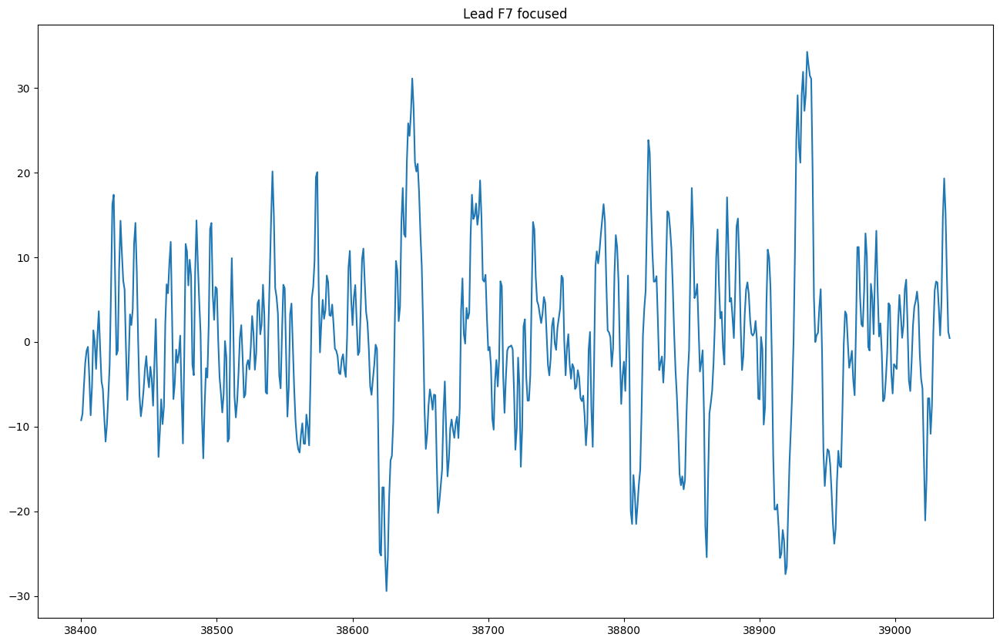

38400:39040


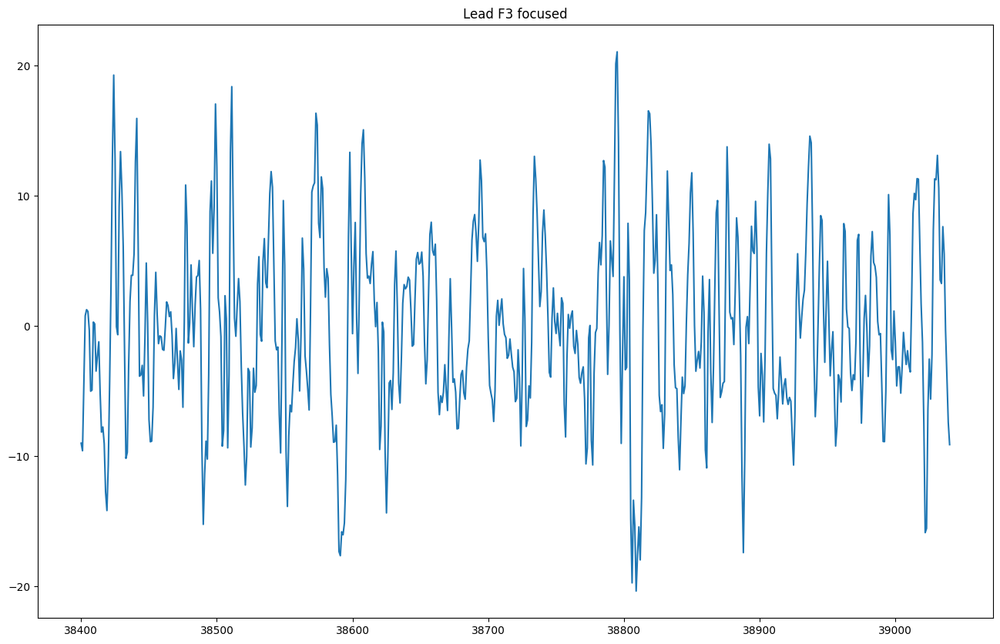

38400:39040


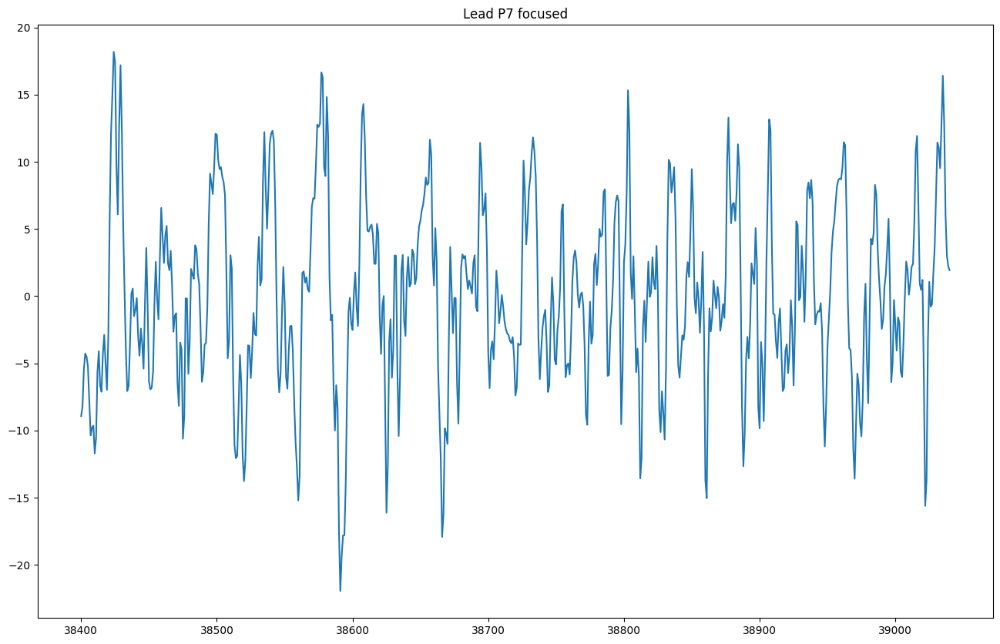

38400:39040


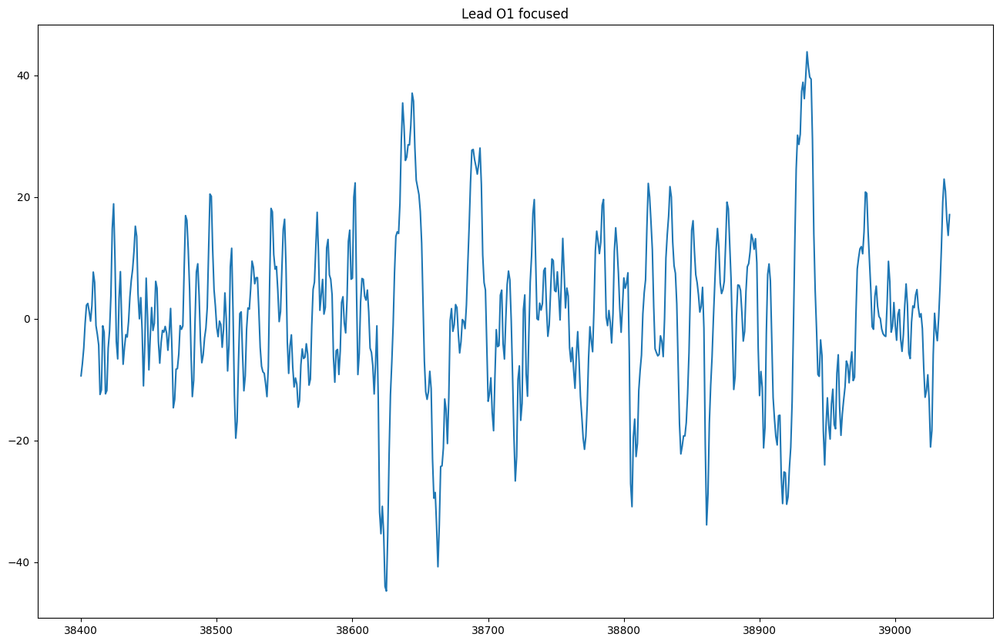

38400:39040


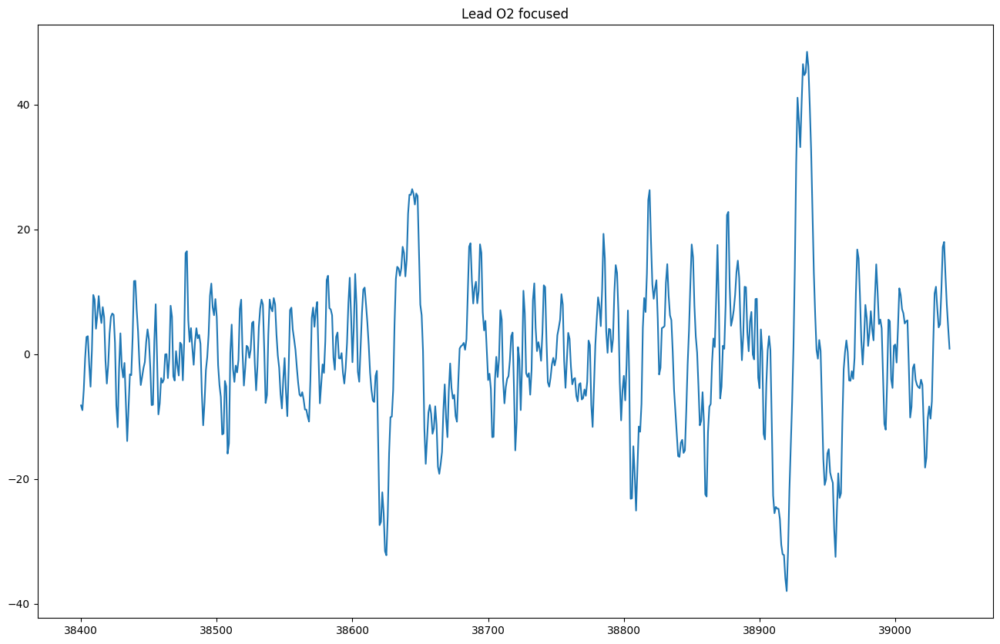

38400:39040


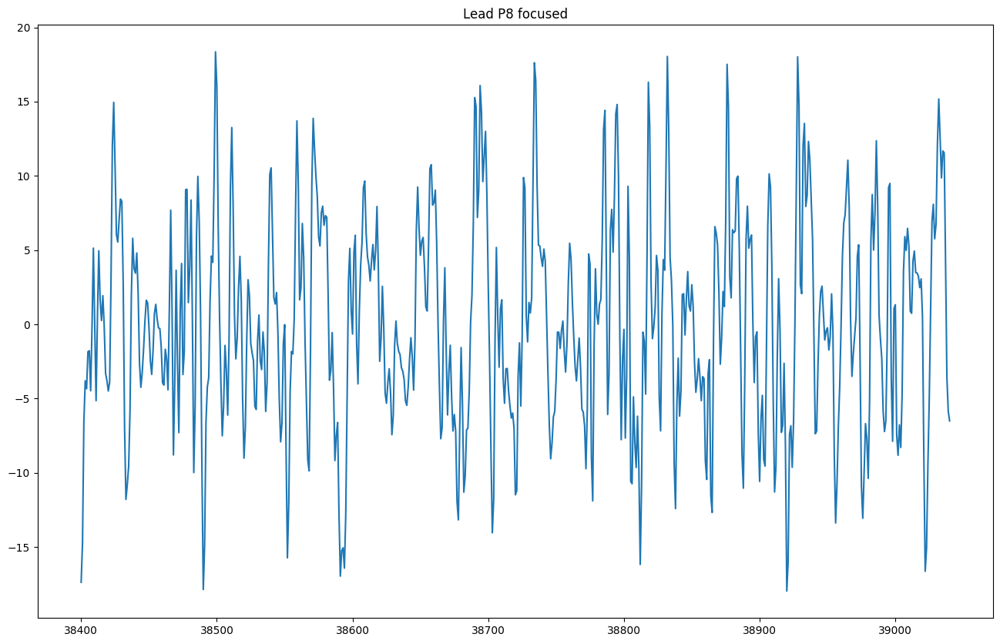

38400:39040


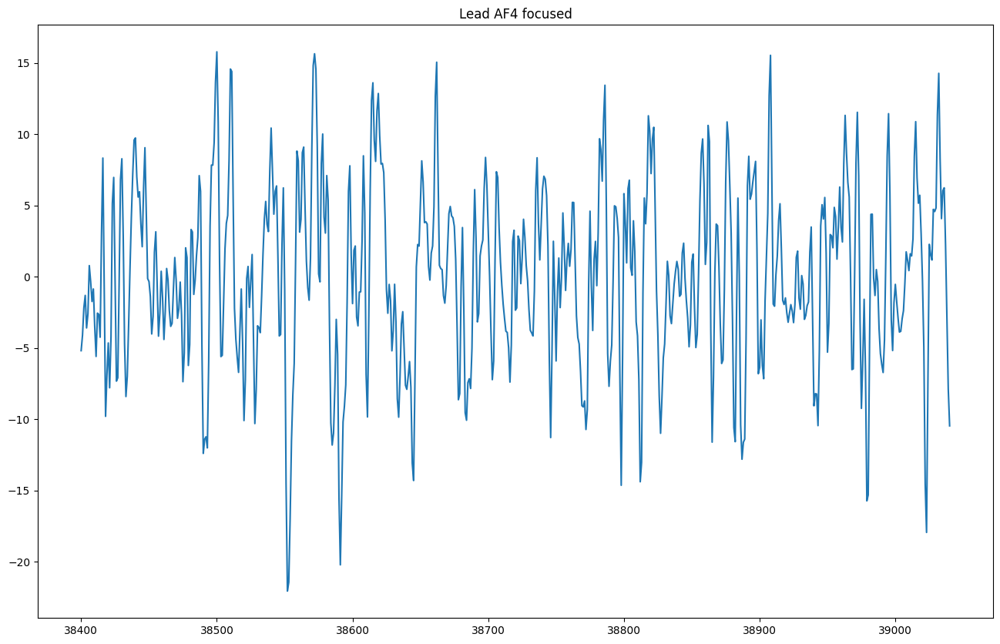

In [ ]:
labels = ['F7', 'F3', 'P7', 'O1', 'O2', 'P8', 'AF4']
start = 5*60*128
seconds = 5
hz = 128
state="focused"
# Create the directory for the plots if it does not exist, else use the existing directory
signal_plot_focused_dir = os.path.join(drive_root, "thre08/EEGSignalPlot/focused/")
os.makedirs(signal_plot_focused_dir, exist_ok=True)
plotleads(dat, labels, start, seconds, hz, state, signal_plot_focused_dir)

### 'Unfocused'

115200:115840


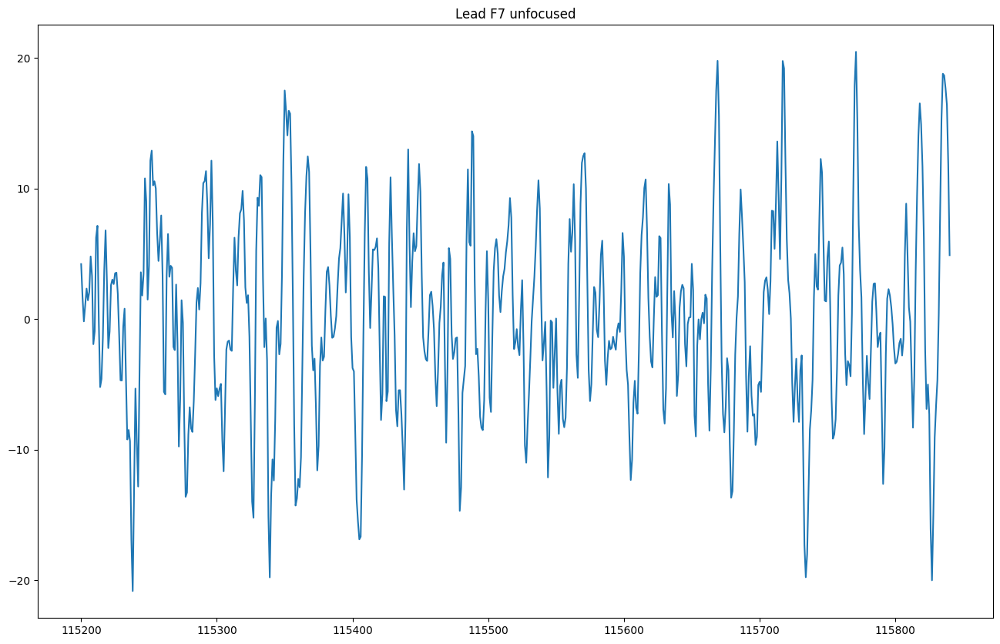

115200:115840


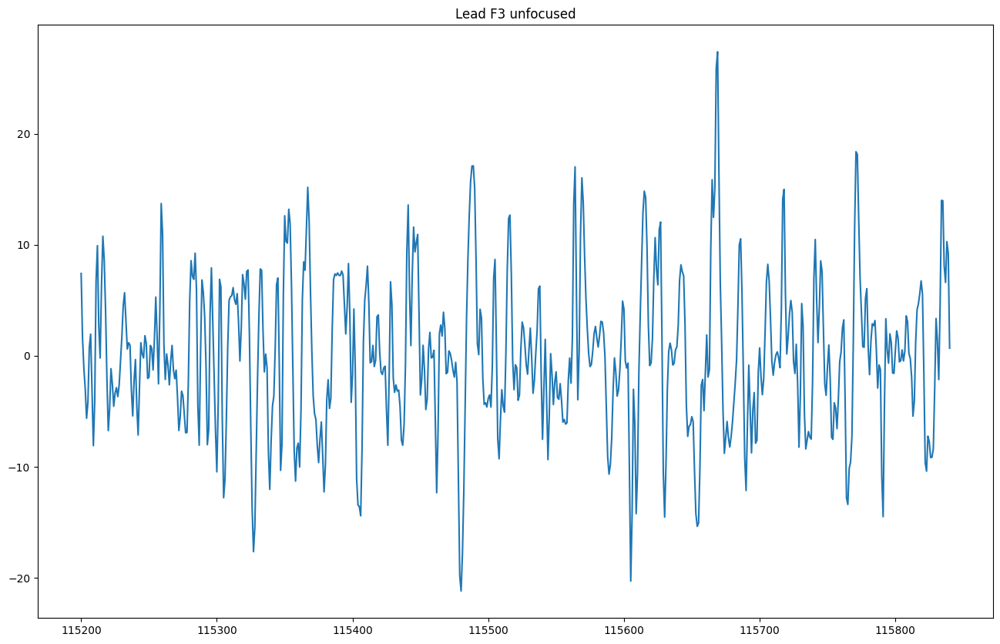

115200:115840


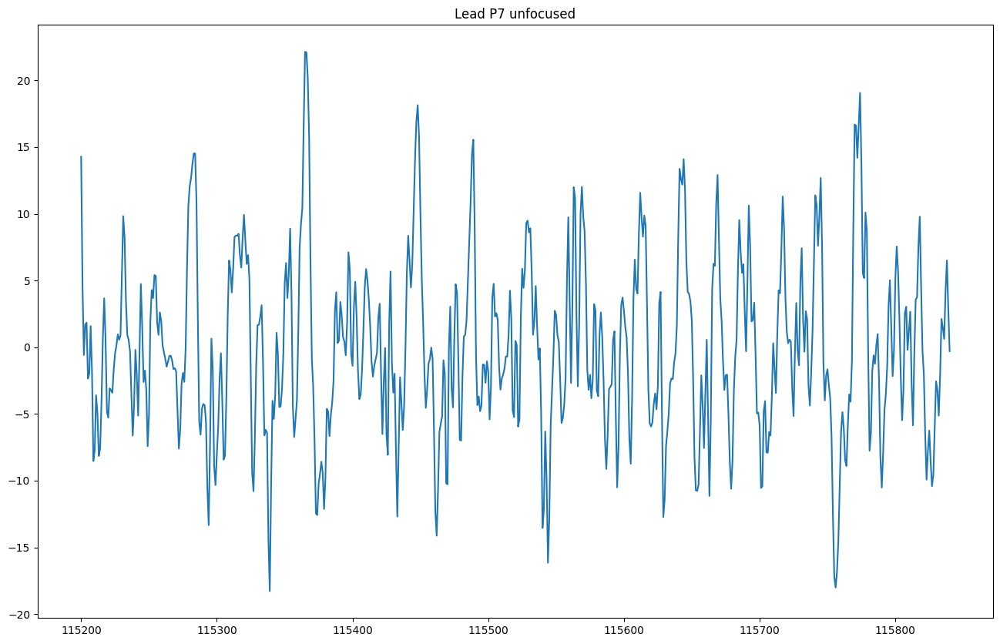

115200:115840


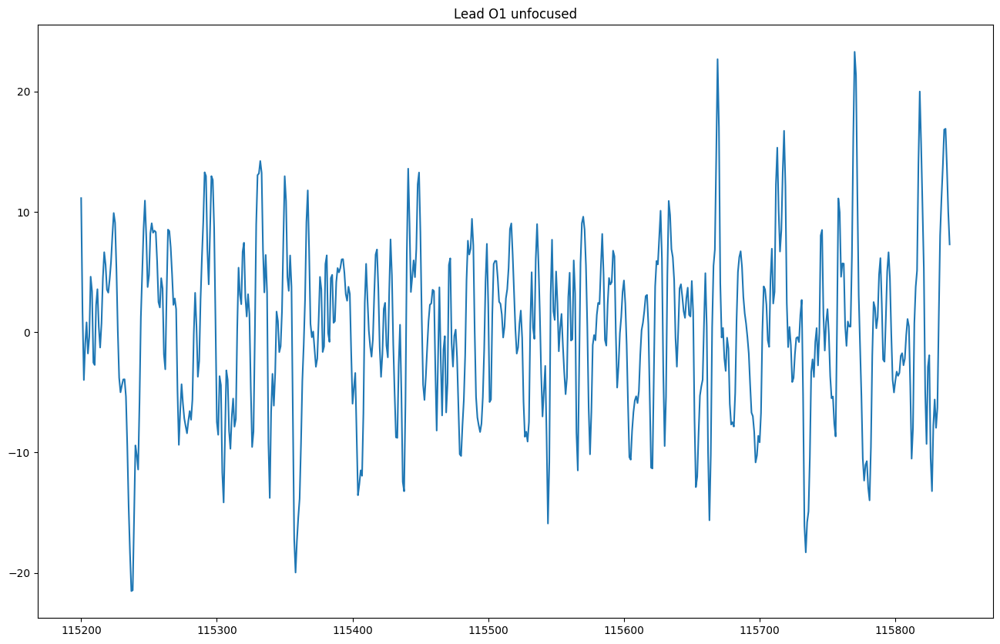

115200:115840


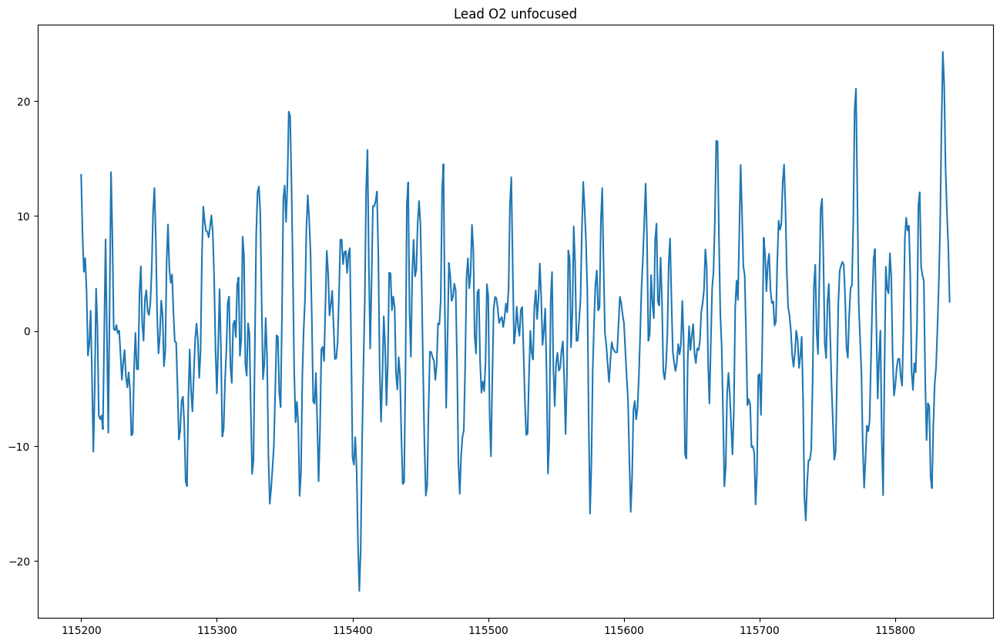

115200:115840


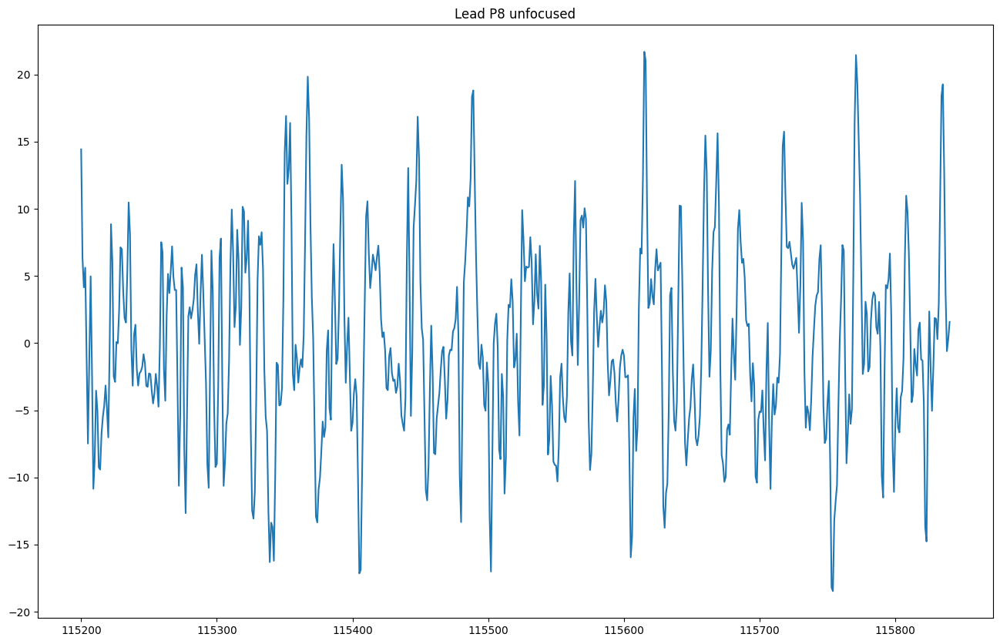

115200:115840


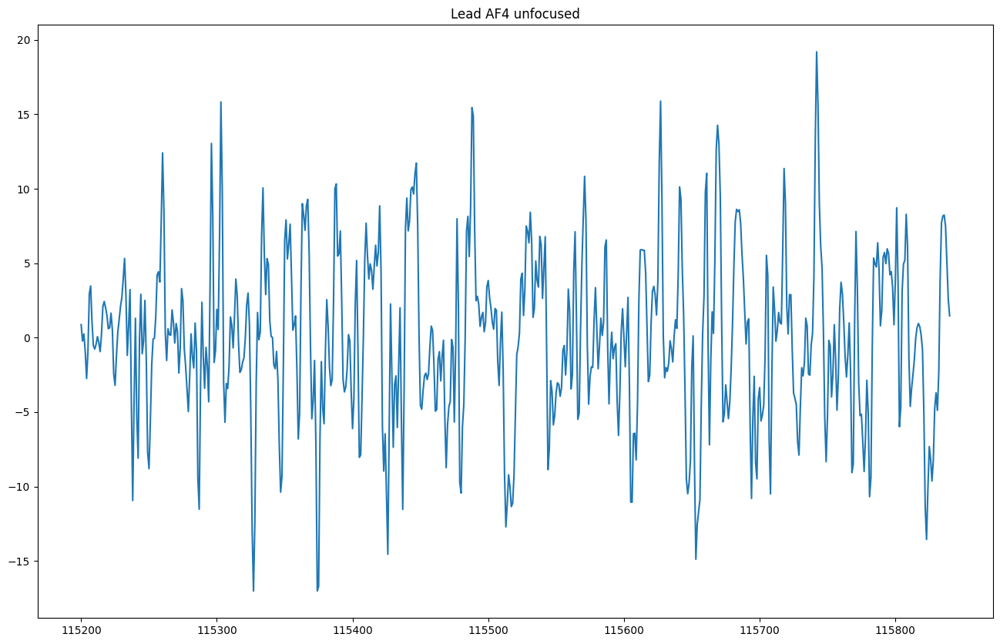

In [ ]:
labels = ['F7', 'F3', 'P7', 'O1', 'O2', 'P8', 'AF4']
start =15* 60*128
seconds = 5
hz = 128
state="unfocused"

signal_plot_unfocused_dir= os.path.join(drive_root, "thre08/EEGSignalPlot/unfocused/")
os.makedirs(signal_plot_unfocused_dir, exist_ok=True)
plotleads(dat, labels, start, seconds, hz, state, signal_plot_unfocused_dir)

### 'Drowsy'

192000:192640


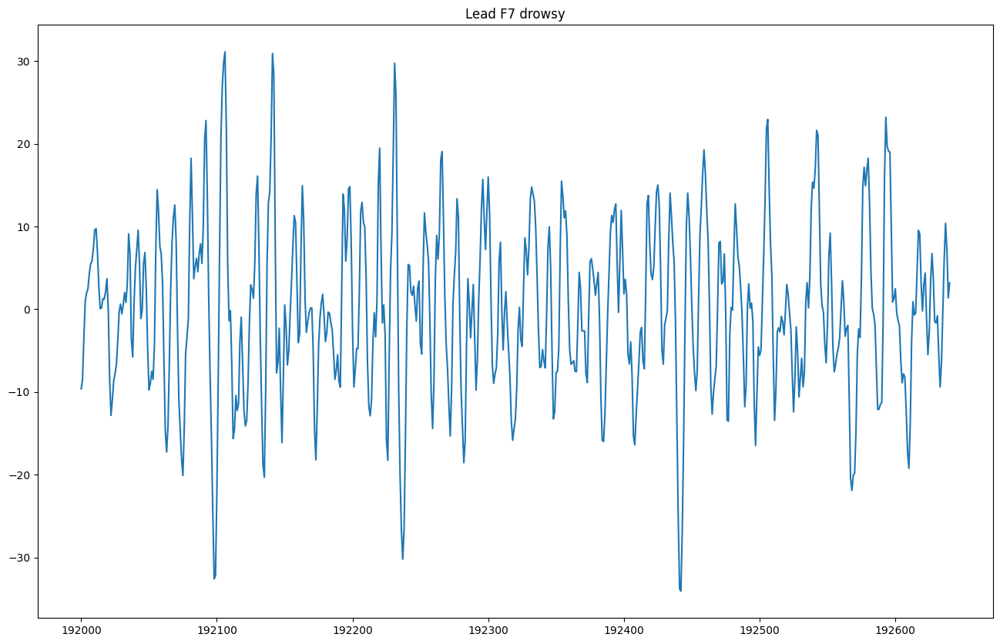

192000:192640


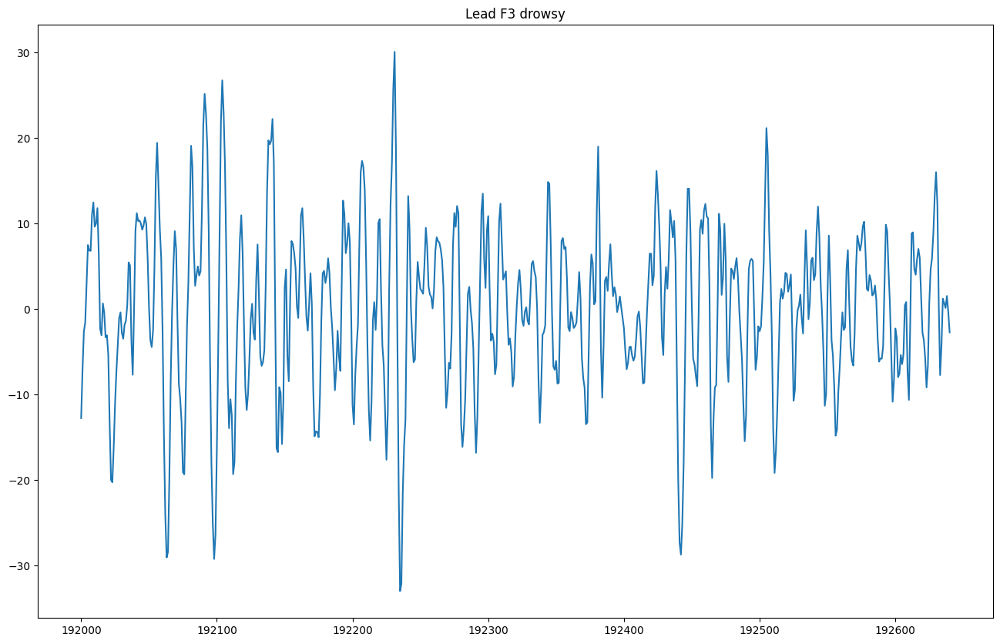

192000:192640


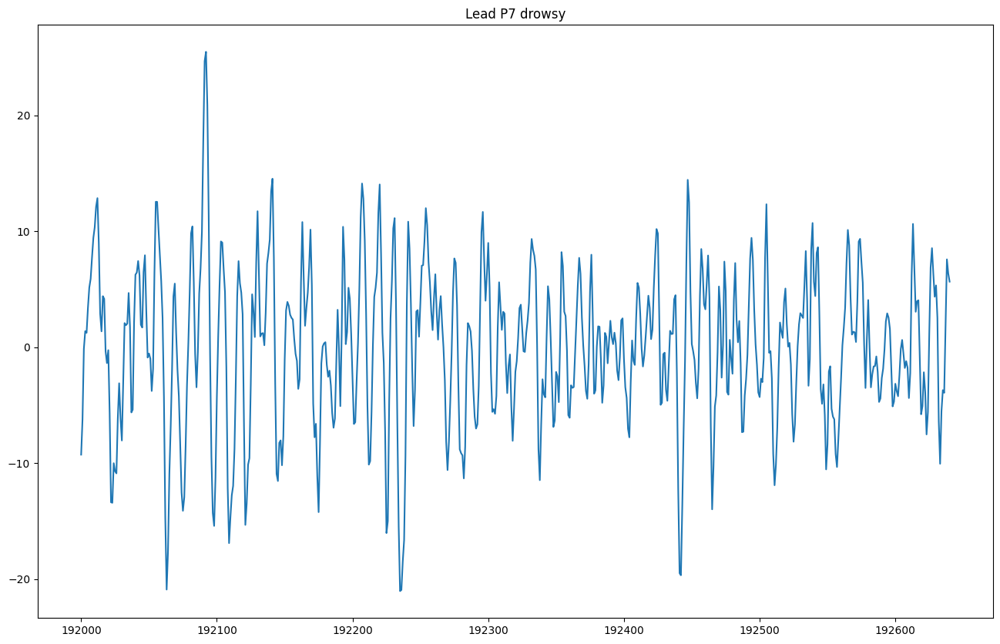

192000:192640


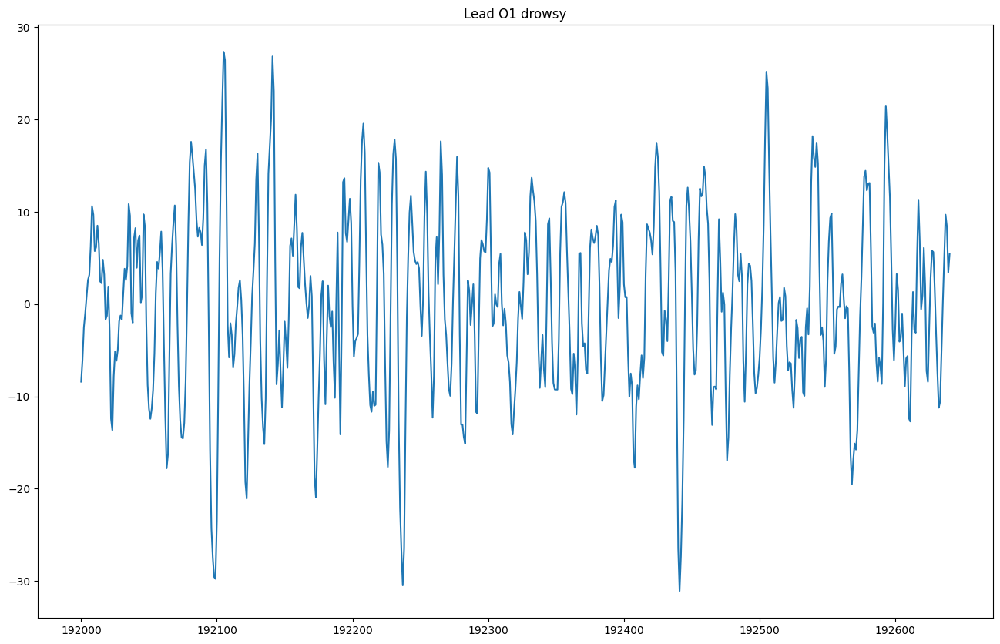

192000:192640


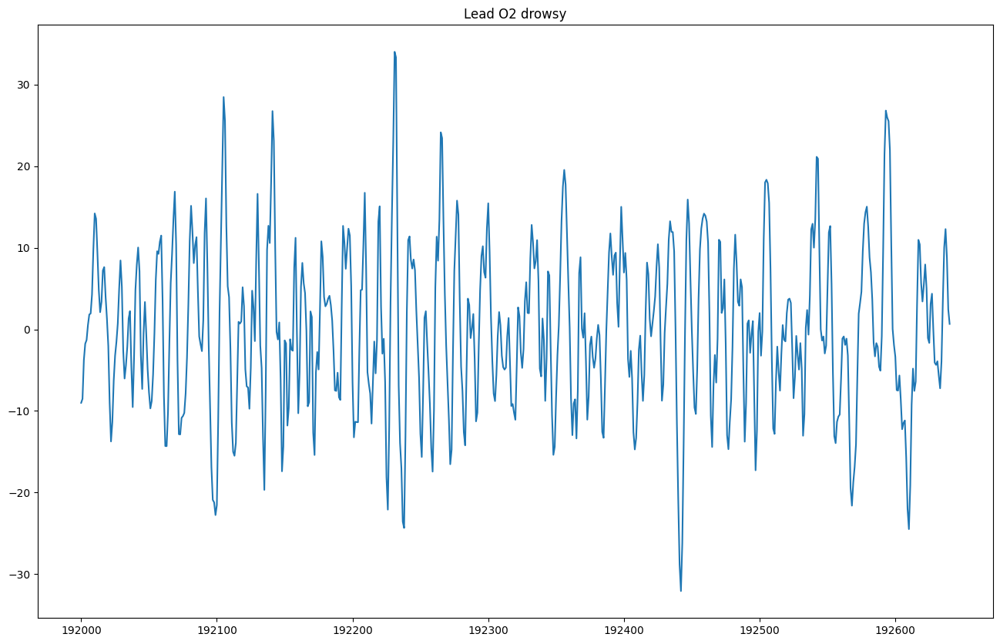

192000:192640


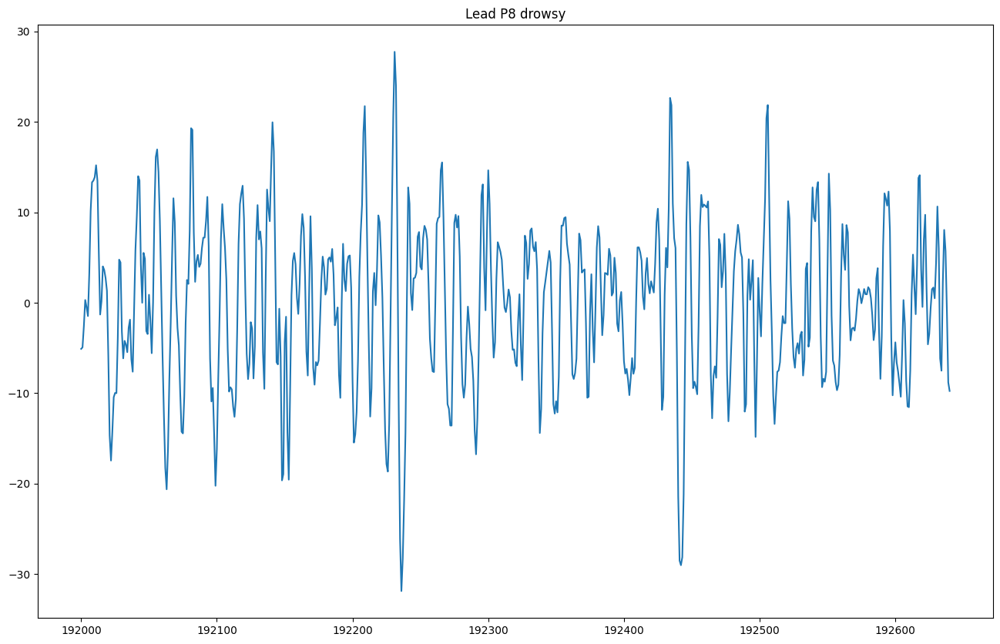

192000:192640


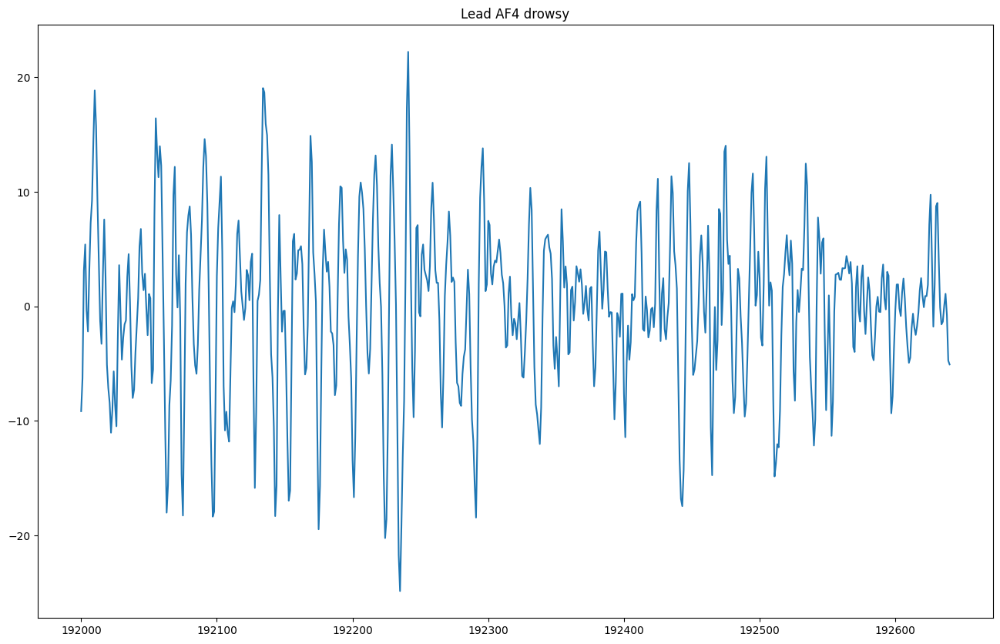

In [ ]:
labels = ['F7', 'F3', 'P7', 'O1', 'O2', 'P8', 'AF4']
start = 25*60*128
seconds = 5
hz = 128
state="drowsy"

signal_plot_drowsed_dir = os.path.join(drive_root, "thre08/EEGSignalPlot/drowsy/")
os.makedirs(signal_plot_drowsed_dir, exist_ok=True)
plotleads(dat, labels, start, seconds, hz, state, signal_plot_drowsed_dir)

In [ ]:
# Define constants for sampling frequency, total subjects, trials, and time markers
samp_freq = 128  # Sampling frequency in Hz
total_subjects = 5  # Total number of subjects
total_trials = 5  # Total number of trials per subject (except subject 5)

# Define time markers (in samples) for different mental states
mkpt1 = int(samp_freq * 10 * 60)  # First 10 minutes for "focused" state
mkpt2 = int(samp_freq * 20 * 60)  # Second 10 minutes for "unfocused" state
mkpt3 = int(mkpt2 + 60940)  # Minimum duration across all trials (samples)

In [ ]:
# Create a dictionary to map subject IDs to their corresponding trial numbers
subject_map = {}
for s in range(1, total_subjects + 1):
    a = int(7 * (s - 1)) + 3  # Calculate starting trial number for subject s
    if s != 5:
        b = a + 5  # Subject 1-4 have 5 trials
    else:
        b = a + 4  # Subject 5 has 4 trials
    subject_map[s] = [i for i in range(a, b)]  # Store trial numbers for subject s

print(subject_map)  # Print the subject_map for verification

{1: [3, 4, 5, 6, 7], 2: [10, 11, 12, 13, 14], 3: [17, 18, 19, 20, 21], 4: [24, 25, 26, 27, 28], 5: [31, 32, 33, 34]}


### Channel names:

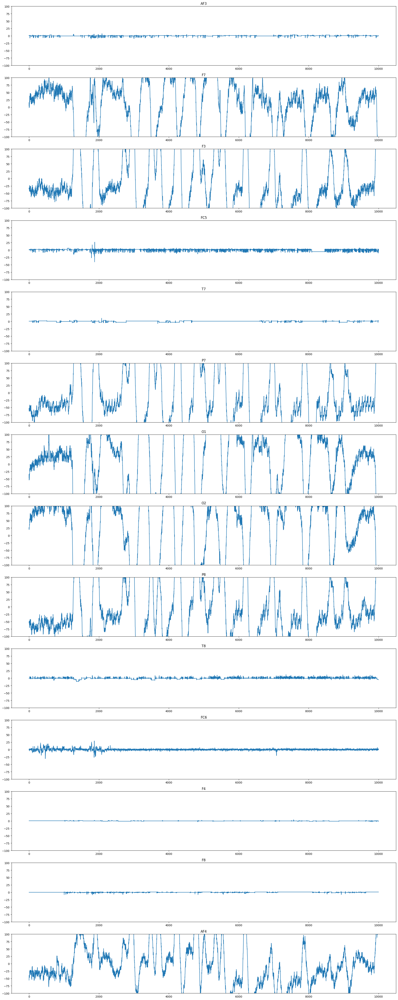

In [ ]:
# Load EEG data from 1 sample file
mat = scipy.io.loadmat(f"{data_root}/eeg_record3.mat")  # Load data from a .mat file
data = mat['o']['data'][0, 0]  # Extract the EEG data
FS = mat['o']['sampFreq'][0][0][0][0]  # Extract the sampling frequency

# Define channel labels
channels = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']

# Create subplots for visualizing all channels
fig, ax = plt.subplots(14, 1, figsize=(20, 50))  # Create 14 subplots, one for each channel
fig.set_figwidth(20)  # Set the figure width
fig.set_figheight(50)  # Set the figure height

# Plot each channel's data
for i in range(14):
    data_ave = data[5000:15000, i + 3] - np.mean(data[5000:15000, i + 3])  # Extract and DC-offset removal
    ax[i].plot(data_ave)  # Plot the data
    ax[i].set_title(channels[i])  # Set the title for each subplot
    ax[i].set_ylim(-100, 100)  # Set the y-axis limits

plt.tight_layout()  # Adjust subplot spacing to prevent overlap
plt.show()  # Display the plot

- The dataset description on Kaggle does not provide sufficient information about channel relevance.
- To identify useful channels, we will plot all channels and visually inspect the signals.
- There are 14 channels in total, but the headset might have been modified by the experimenter.
- After removing the DC offset, the EEG amplitude is expected to be within the range of -100 to 100.
- Based on visual inspection of the plots, the following channels appear to be the most informative:
['F7', 'F3', 'P7', 'O1', 'O2', 'P8', 'AF4']

In [ ]:
channels = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']
useful_channels = ['F7','F3','P7','O1','O2','P8','AF4']
use_channel_inds = []
for c in useful_channels:
    if c in channels:
        use_channel_inds.append(channels.index(c))
use_channel_inds

[1, 2, 5, 6, 7, 8, 13]

### Saving the pickel object for each subject

In [ ]:
def process_subject_data(subject_id, subject_map, data_root, useful_channels, samp_freq, mkpt1, mkpt2, mkpt3, use_channel_inds):
    """
    Processes EEG data for a single subject, extracts trials, and saves to a pickle file.
    """
    subject_data = {'channels': useful_channels, 'samp_freq': samp_freq}

    for trial_index, trial_num in enumerate(subject_map[subject_id]):
        trial_data = loadmat(f"{data_root}/eeg_record{trial_num}.mat")
        eeg_data = trial_data['o']['data'][0][0][:, 3:17]
        eeg_data = eeg_data[:, use_channel_inds]

        trial = {
            'focused': eeg_data[:mkpt1],
            'unfocused': eeg_data[mkpt1:mkpt2],
            'drowsy': eeg_data[mkpt2:mkpt3]
        }
        subject_data[f'trial_{trial_index + 1}'] = trial

    with open(f'subject_{subject_id}.pkl', 'wb') as file:
        pickle.dump(subject_data, file, pickle.HIGHEST_PROTOCOL)

# Iterate through each subject and process data
for subject_id in range(1, total_subjects + 1):
    process_subject_data(subject_id, subject_map, data_root, useful_channels, samp_freq, mkpt1, mkpt2, mkpt3, use_channel_inds)

### Loading the pickle objects and building adjancy matrix for each subject for each trial and saving to csv files

In [ ]:
# Create the directory for the plots if it does not exist, else use the existing directory
os.makedirs(f"{drive_root}/thre08/heatmap", exist_ok=True)
os.makedirs(f"{drive_root}/thre08/heatmap/focused", exist_ok=True)
os.makedirs(f"{drive_root}/thre08/heatmap/unfocused", exist_ok=True)
os.makedirs(f"{drive_root}/thre08/heatmap/drowsy", exist_ok=True)

os.makedirs(f"{drive_root}/thre08/adjmat", exist_ok=True)
os.makedirs(f"{drive_root}/thre08/adjmat/focused", exist_ok=True)
os.makedirs(f"{drive_root}/thre08/adjmat/unfocused", exist_ok=True)
os.makedirs(f"{drive_root}/thre08/adjmat/drowsy", exist_ok=True)

Correlation Matrix for subject 1 trial 1 state 'Focused':
           F7        F3        P7        O1        O2        P8  AF4
F7   1.000000  0.000000  0.000000  0.835029  0.860814  0.000000  0.0
F3   0.000000  1.000000  0.967869  0.000000  0.000000  0.936929  0.0
P7   0.000000  0.967869  1.000000  0.000000  0.000000  0.907853  0.0
O1   0.835029  0.000000  0.000000  1.000000  0.910402  0.000000  0.0
O2   0.860814  0.000000  0.000000  0.910402  1.000000  0.000000  0.0
P8   0.000000  0.936929  0.907853  0.000000  0.000000  1.000000  0.0
AF4  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  1.0
Correlation Matrix for subject 1 trial 1 state 'Unfocused':
           F7        F3        P7        O1        O2        P8  AF4
F7   1.000000  0.000000  0.000000  0.835904  0.831407  0.000000  0.0
F3   0.000000  1.000000  0.953960  0.000000  0.000000  0.913315  0.0
P7   0.000000  0.953960  1.000000  0.000000  0.000000  0.874206  0.0
O1   0.835904  0.000000  0.000000  1.000000  0.849611 

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 1 trial 2 state 'Focused':
      F7        F3        P7   O1   O2        P8  AF4
F7   1.0  0.000000  0.000000  0.0  0.0  0.000000  0.0
F3   0.0  1.000000  0.000000  0.0  0.0  0.811845  0.0
P7   0.0  0.000000  1.000000  0.0  0.0  0.833841  0.0
O1   0.0  0.000000  0.000000  1.0  0.0  0.000000  0.0
O2   0.0  0.000000  0.000000  0.0  1.0  0.000000  0.0
P8   0.0  0.811845  0.833841  0.0  0.0  1.000000  0.0
AF4  0.0  0.000000  0.000000  0.0  0.0  0.000000  1.0
Correlation Matrix for subject 1 trial 2 state 'Unfocused':
           F7        F3   P7        O1        O2        P8  AF4
F7   1.000000  0.000000  0.0  0.802069  0.820954  0.000000  0.0
F3   0.000000  1.000000  0.0  0.000000  0.000000  0.898246  0.0
P7   0.000000  0.000000  1.0  0.000000  0.000000  0.000000  0.0
O1   0.802069  0.000000  0.0  1.000000  0.000000  0.000000  0.0
O2   0.820954  0.000000  0.0  0.000000  1.000000  0.000000  0.0
P8   0.000000  0.898246  0.0  0.000000  0.000000  1.000000  0.0
AF

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 1 trial 3 state 'Focused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 1 trial 3 state 'Unfocused':
      F7   F3        P7   O1   O2        P8       AF4
F7   1.0  0.0  0.000000  0.0  0.0  0.000000  0.000000
F3   0.0  1.0  0.000000  0.0  0.0  0.000000  0.000000
P7   0.0  0.0  1.000000  0.0  0.0  0.831681  0.825890
O1   0.0  0.0  0.000000  1.0  0.0  0.000000  0.000000
O2   0.0  0.0  0.000000  0.0  1.0  0.000000  0.000000
P8   0.0  0.0  0.831681  0.0  0.0  1.000000  0.820391
AF4  0.0  0.0  0.825890  0.0  0.0  0.820391  1.000000
Correlation Matrix for subject 1 trial 3 state 'Drowsy':
      F7   F3        P7   O1   O2        P8  AF4
F7   1.0  0.0  0.000000  0.0  0.

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 1 trial 4 state 'Focused':
      F7   F3   P7        O1   O2        P8       AF4
F7   1.0  0.0  0.0  0.000000  0.0  0.000000  0.000000
F3   0.0  1.0  0.0  0.000000  0.0  0.000000  0.000000
P7   0.0  0.0  1.0  0.000000  0.0  0.000000  0.000000
O1   0.0  0.0  0.0  1.000000  0.0  0.000000  0.811628
O2   0.0  0.0  0.0  0.000000  1.0  0.000000  0.000000
P8   0.0  0.0  0.0  0.000000  0.0  1.000000  0.815332
AF4  0.0  0.0  0.0  0.811628  0.0  0.815332  1.000000
Correlation Matrix for subject 1 trial 4 state 'Unfocused':
      F7   F3   P7        O1   O2       P8       AF4
F7   1.0  0.0  0.0  0.000000  0.0  0.00000  0.000000
F3   0.0  1.0  0.0  0.000000  0.0  0.00000  0.000000
P7   0.0  0.0  1.0  0.000000  0.0  0.00000  0.000000
O1   0.0  0.0  0.0  1.000000  0.0  0.00000  0.818712
O2   0.0  0.0  0.0  0.000000  1.0  0.00000  0.000000
P8   0.0  0.0  0.0  0.000000  0.0  1.00000  0.875980
AF4  0.0  0.0  0.0  0.818712  0.0  0.87598  1.000000
Correlation Matrix for sub

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 1 trial 5 state 'Focused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 1 trial 5 state 'Unfocused':
      F7   F3   P7        O1        O2        P8       AF4
F7   1.0  0.0  0.0  0.000000  0.000000  0.000000  0.000000
F3   0.0  1.0  0.0  0.000000  0.000000  0.000000  0.000000
P7   0.0  0.0  1.0  0.000000  0.000000  0.000000  0.000000
O1   0.0  0.0  0.0  1.000000  0.808593  0.000000  0.000000
O2   0.0  0.0  0.0  0.808593  1.000000  0.000000  0.000000
P8   0.0  0.0  0.0  0.000000  0.000000  1.000000  0.812102
AF4  0.0  0.0  0.0  0.000000  0.000000  0.812102  1.000000
Correlation Matrix for subject 1 trial 5 state 'Drowsy':
           F7        F3        P7        

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 2 trial 1 state 'Focused':
           F7        F3   P7   O1   O2   P8  AF4
F7   1.000000  0.860513  0.0  0.0  0.0  0.0  0.0
F3   0.860513  1.000000  0.0  0.0  0.0  0.0  0.0
P7   0.000000  0.000000  1.0  0.0  0.0  0.0  0.0
O1   0.000000  0.000000  0.0  1.0  0.0  0.0  0.0
O2   0.000000  0.000000  0.0  0.0  1.0  0.0  0.0
P8   0.000000  0.000000  0.0  0.0  0.0  1.0  0.0
AF4  0.000000  0.000000  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 2 trial 1 state 'Unfocused':
           F7        F3   P7       O1       O2   P8  AF4
F7   1.000000  0.879646  0.0  0.00000  0.00000  0.0  0.0
F3   0.879646  1.000000  0.0  0.00000  0.00000  0.0  0.0
P7   0.000000  0.000000  1.0  0.00000  0.00000  0.0  0.0
O1   0.000000  0.000000  0.0  1.00000  0.87525  0.0  0.0
O2   0.000000  0.000000  0.0  0.87525  1.00000  0.0  0.0
P8   0.000000  0.000000  0.0  0.00000  0.00000  1.0  0.0
AF4  0.000000  0.000000  0.0  0.00000  0.00000  0.0  1.0
Correlation Matrix for subject 2 t

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 2 trial 2 state 'Focused':
      F7        F3        P7       O1   O2   P8  AF4
F7   1.0  0.000000  0.000000  0.00000  0.0  0.0  0.0
F3   0.0  1.000000  0.818997  0.00000  0.0  0.0  0.0
P7   0.0  0.818997  1.000000  0.83141  0.0  0.0  0.0
O1   0.0  0.000000  0.831410  1.00000  0.0  0.0  0.0
O2   0.0  0.000000  0.000000  0.00000  1.0  0.0  0.0
P8   0.0  0.000000  0.000000  0.00000  0.0  1.0  0.0
AF4  0.0  0.000000  0.000000  0.00000  0.0  0.0  1.0
Correlation Matrix for subject 2 trial 2 state 'Unfocused':
      F7        F3        P7        O1        O2   P8  AF4
F7   1.0  0.000000  0.000000  0.000000  0.000000  0.0  0.0
F3   0.0  1.000000  0.833561  0.000000  0.000000  0.0  0.0
P7   0.0  0.833561  1.000000  0.835199  0.900854  0.0  0.0
O1   0.0  0.000000  0.835199  1.000000  0.000000  0.0  0.0
O2   0.0  0.000000  0.900854  0.000000  1.000000  0.0  0.0
P8   0.0  0.000000  0.000000  0.000000  0.000000  1.0  0.0
AF4  0.0  0.000000  0.000000  0.000000  0.000

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 2 trial 3 state 'Focused':
           F7   F3        P7   O1        O2        P8       AF4
F7   1.000000  0.0  0.000000  0.0  0.000000  0.886831  0.818521
F3   0.000000  1.0  0.000000  0.0  0.000000  0.000000  0.000000
P7   0.000000  0.0  1.000000  0.0  0.806218  0.000000  0.000000
O1   0.000000  0.0  0.000000  1.0  0.000000  0.000000  0.000000
O2   0.000000  0.0  0.806218  0.0  1.000000  0.841358  0.000000
P8   0.886831  0.0  0.000000  0.0  0.841358  1.000000  0.836505
AF4  0.818521  0.0  0.000000  0.0  0.000000  0.836505  1.000000
Correlation Matrix for subject 2 trial 3 state 'Unfocused':
           F7        F3   P7   O1   O2        P8  AF4
F7   1.000000  0.000000  0.0  0.0  0.0  0.862668  0.0
F3   0.000000  1.000000  0.0  0.0  0.0  0.836203  0.0
P7   0.000000  0.000000  1.0  0.0  0.0  0.000000  0.0
O1   0.000000  0.000000  0.0  1.0  0.0  0.000000  0.0
O2   0.000000  0.000000  0.0  0.0  1.0  0.000000  0.0
P8   0.862668  0.836203  0.0  0.0  0.0  1.0000

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 2 trial 4 state 'Focused':
           F7        F3   P7   O1        O2        P8       AF4
F7   1.000000  0.903405  0.0  0.0  0.000000  0.875907  0.000000
F3   0.903405  1.000000  0.0  0.0  0.000000  0.858110  0.000000
P7   0.000000  0.000000  1.0  0.0  0.000000  0.000000  0.000000
O1   0.000000  0.000000  0.0  1.0  0.000000  0.000000  0.000000
O2   0.000000  0.000000  0.0  0.0  1.000000  0.000000  0.804196
P8   0.875907  0.858110  0.0  0.0  0.000000  1.000000  0.000000
AF4  0.000000  0.000000  0.0  0.0  0.804196  0.000000  1.000000
Correlation Matrix for subject 2 trial 4 state 'Unfocused':
           F7        F3   P7   O1   O2        P8  AF4
F7   1.000000  0.916506  0.0  0.0  0.0  0.872942  0.0
F3   0.916506  1.000000  0.0  0.0  0.0  0.870075  0.0
P7   0.000000  0.000000  1.0  0.0  0.0  0.000000  0.0
O1   0.000000  0.000000  0.0  1.0  0.0  0.000000  0.0
O2   0.000000  0.000000  0.0  0.0  1.0  0.000000  0.0
P8   0.872942  0.870075  0.0  0.0  0.0  1.0000

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 2 trial 5 state 'Focused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 2 trial 5 state 'Unfocused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 2 trial 5 state 'Drowsy':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 3 trial 1 state 'Focused':
           F7   F3        P7   O1        O2   P8       AF4
F7   1.000000  0.0  0.000000  0.0  0.000000  0.0  0.803534
F3   0.000000  1.0  0.000000  0.0  0.000000  0.0  0.000000
P7   0.000000  0.0  1.000000  0.0  0.907232  0.0  0.000000
O1   0.000000  0.0  0.000000  1.0  0.000000  0.0  0.000000
O2   0.000000  0.0  0.907232  0.0  1.000000  0.0  0.000000
P8   0.000000  0.0  0.000000  0.0  0.000000  1.0  0.000000
AF4  0.803534  0.0  0.000000  0.0  0.000000  0.0  1.000000
Correlation Matrix for subject 3 trial 1 state 'Unfocused':
      F7   F3        P7        O1   O2   P8  AF4
F7   1.0  0.0  0.000000  0.000000  0.0  0.0  0.0
F3   0.0  1.0  0.000000  0.000000  0.0  0.0  0.0
P7   0.0  0.0  1.000000  0.801946  0.0  0.0  0.0
O1   0.0  0.0  0.801946  1.000000  0.0  0.0  0.0
O2   0.0  0.0  0.000000  0.000000  1.0  0.0  0.0
P8   0.0  0.0  0.000000  0.000000  0.0  1.0  0.0
AF4  0.0  0.0  0.000000  0.000000  0.0  0.0  1.0
Correlation Matrix

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 3 trial 2 state 'Focused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 3 trial 2 state 'Unfocused':
      F7        F3        P7        O1        O2   P8       AF4
F7   1.0  0.000000  0.000000  0.000000  0.000000  0.0  0.000000
F3   0.0  1.000000  0.937626  0.875803  0.916516  0.0  0.941200
P7   0.0  0.937626  1.000000  0.910374  0.973679  0.0  0.902597
O1   0.0  0.875803  0.910374  1.000000  0.912868  0.0  0.837409
O2   0.0  0.916516  0.973679  0.912868  1.000000  0.0  0.879976
P8   0.0  0.000000  0.000000  0.000000  0.000000  1.0  0.000000
AF4  0.0  0.941200  0.902597  0.837409  0.879976  0.0  1.000000
Correlation Matrix for subject 3 trial 2 state 'Drowsy':
 

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 3 trial 3 state 'Focused':
      F7   F3   P7        O1        O2   P8  AF4
F7   1.0  0.0  0.0  0.000000  0.000000  0.0  0.0
F3   0.0  1.0  0.0  0.000000  0.000000  0.0  0.0
P7   0.0  0.0  1.0  0.000000  0.000000  0.0  0.0
O1   0.0  0.0  0.0  1.000000  0.857907  0.0  0.0
O2   0.0  0.0  0.0  0.857907  1.000000  0.0  0.0
P8   0.0  0.0  0.0  0.000000  0.000000  1.0  0.0
AF4  0.0  0.0  0.0  0.000000  0.000000  0.0  1.0
Correlation Matrix for subject 3 trial 3 state 'Unfocused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 3 trial 3 state 'Drowsy':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7  

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 3 trial 4 state 'Focused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 3 trial 4 state 'Unfocused':
      F7        F3   P7   O1   O2        P8  AF4
F7   1.0  0.000000  0.0  0.0  0.0  0.000000  0.0
F3   0.0  1.000000  0.0  0.0  0.0  0.832682  0.0
P7   0.0  0.000000  1.0  0.0  0.0  0.000000  0.0
O1   0.0  0.000000  0.0  1.0  0.0  0.000000  0.0
O2   0.0  0.000000  0.0  0.0  1.0  0.000000  0.0
P8   0.0  0.832682  0.0  0.0  0.0  1.000000  0.0
AF4  0.0  0.000000  0.0  0.0  0.0  0.000000  1.0
Correlation Matrix for subject 3 trial 4 state 'Drowsy':
           F7   F3   P7   O1        O2        P8  AF4
F7   1.000000  0.0  0.0  0.0  0.000000  0.846761  0.0
F3   0.000000

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 3 trial 5 state 'Focused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 3 trial 5 state 'Unfocused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 3 trial 5 state 'Drowsy':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 4 trial 1 state 'Focused':
           F7   F3        P7   O1        O2        P8       AF4
F7   1.000000  0.0  0.000000  0.0  0.841057  0.897406  0.000000
F3   0.000000  1.0  0.000000  0.0  0.000000  0.000000  0.000000
P7   0.000000  0.0  1.000000  0.0  0.000000  0.000000  0.956586
O1   0.000000  0.0  0.000000  1.0  0.000000  0.000000  0.000000
O2   0.841057  0.0  0.000000  0.0  1.000000  0.914191  0.000000
P8   0.897406  0.0  0.000000  0.0  0.914191  1.000000  0.000000
AF4  0.000000  0.0  0.956586  0.0  0.000000  0.000000  1.000000
Correlation Matrix for subject 4 trial 1 state 'Unfocused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 4 trial 1 state 'Drowsy':
 

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 4 trial 2 state 'Focused':
      F7   F3   P7        O1        O2   P8  AF4
F7   1.0  0.0  0.0  0.000000  0.000000  0.0  0.0
F3   0.0  1.0  0.0  0.000000  0.000000  0.0  0.0
P7   0.0  0.0  1.0  0.000000  0.000000  0.0  0.0
O1   0.0  0.0  0.0  1.000000  0.836382  0.0  0.0
O2   0.0  0.0  0.0  0.836382  1.000000  0.0  0.0
P8   0.0  0.0  0.0  0.000000  0.000000  1.0  0.0
AF4  0.0  0.0  0.0  0.000000  0.000000  0.0  1.0
Correlation Matrix for subject 4 trial 2 state 'Unfocused':
      F7   F3       P7   O1       O2   P8  AF4
F7   1.0  0.0  0.00000  0.0  0.00000  0.0  0.0
F3   0.0  1.0  0.00000  0.0  0.00000  0.0  0.0
P7   0.0  0.0  1.00000  0.0  0.87678  0.0  0.0
O1   0.0  0.0  0.00000  1.0  0.00000  0.0  0.0
O2   0.0  0.0  0.87678  0.0  1.00000  0.0  0.0
P8   0.0  0.0  0.00000  0.0  0.00000  1.0  0.0
AF4  0.0  0.0  0.00000  0.0  0.00000  0.0  1.0
Correlation Matrix for subject 4 trial 2 state 'Drowsy':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 4 trial 3 state 'Focused':
           F7   F3   P7   O1        O2        P8  AF4
F7   1.000000  0.0  0.0  0.0  0.000000  0.849656  0.0
F3   0.000000  1.0  0.0  0.0  0.000000  0.000000  0.0
P7   0.000000  0.0  1.0  0.0  0.000000  0.000000  0.0
O1   0.000000  0.0  0.0  1.0  0.000000  0.000000  0.0
O2   0.000000  0.0  0.0  0.0  1.000000  0.868849  0.0
P8   0.849656  0.0  0.0  0.0  0.868849  1.000000  0.0
AF4  0.000000  0.0  0.0  0.0  0.000000  0.000000  1.0
Correlation Matrix for subject 4 trial 3 state 'Unfocused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 4 trial 3 state 'Drowsy':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3 

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 4 trial 4 state 'Focused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 4 trial 4 state 'Unfocused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 4 trial 4 state 'Drowsy':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 4 trial 5 state 'Focused':
      F7   F3        P7        O1   O2   P8  AF4
F7   1.0  0.0  0.000000  0.000000  0.0  0.0  0.0
F3   0.0  1.0  0.000000  0.000000  0.0  0.0  0.0
P7   0.0  0.0  1.000000  0.916072  0.0  0.0  0.0
O1   0.0  0.0  0.916072  1.000000  0.0  0.0  0.0
O2   0.0  0.0  0.000000  0.000000  1.0  0.0  0.0
P8   0.0  0.0  0.000000  0.000000  0.0  1.0  0.0
AF4  0.0  0.0  0.000000  0.000000  0.0  0.0  1.0
Correlation Matrix for subject 4 trial 5 state 'Unfocused':
      F7   F3        P7        O1        O2   P8  AF4
F7   1.0  0.0  0.000000  0.000000  0.000000  0.0  0.0
F3   0.0  1.0  0.000000  0.000000  0.000000  0.0  0.0
P7   0.0  0.0  1.000000  0.982213  0.878114  0.0  0.0
O1   0.0  0.0  0.982213  1.000000  0.817686  0.0  0.0
O2   0.0  0.0  0.878114  0.817686  1.000000  0.0  0.0
P8   0.0  0.0  0.000000  0.000000  0.000000  1.0  0.0
AF4  0.0  0.0  0.000000  0.000000  0.000000  0.0  1.0
Correlation Matrix for subject 4 trial 5 state 'Drowsy':
 

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 5 trial 1 state 'Focused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 5 trial 1 state 'Unfocused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 5 trial 1 state 'Drowsy':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 5 trial 2 state 'Focused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 5 trial 2 state 'Unfocused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 5 trial 2 state 'Drowsy':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 5 trial 3 state 'Focused':
      F7   F3   P7        O1        O2        P8  AF4
F7   1.0  0.0  0.0  0.000000  0.000000  0.000000  0.0
F3   0.0  1.0  0.0  0.000000  0.000000  0.000000  0.0
P7   0.0  0.0  1.0  0.000000  0.000000  0.000000  0.0
O1   0.0  0.0  0.0  1.000000  0.839741  0.834041  0.0
O2   0.0  0.0  0.0  0.839741  1.000000  0.912184  0.0
P8   0.0  0.0  0.0  0.834041  0.912184  1.000000  0.0
AF4  0.0  0.0  0.0  0.000000  0.000000  0.000000  1.0
Correlation Matrix for subject 5 trial 3 state 'Unfocused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 5 trial 3 state 'Drowsy':
           F7   F3        P7        O1        O2   P8  AF4
F7   1.000000  0.0  0.

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

Correlation Matrix for subject 5 trial 4 state 'Focused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 5 trial 4 state 'Unfocused':
      F7   F3   P7   O1   O2   P8  AF4
F7   1.0  0.0  0.0  0.0  0.0  0.0  0.0
F3   0.0  1.0  0.0  0.0  0.0  0.0  0.0
P7   0.0  0.0  1.0  0.0  0.0  0.0  0.0
O1   0.0  0.0  0.0  1.0  0.0  0.0  0.0
O2   0.0  0.0  0.0  0.0  1.0  0.0  0.0
P8   0.0  0.0  0.0  0.0  0.0  1.0  0.0
AF4  0.0  0.0  0.0  0.0  0.0  0.0  1.0
Correlation Matrix for subject 5 trial 4 state 'Drowsy':
      F7   F3       P7   O1       O2   P8  AF4
F7   1.0  0.0  0.00000  0.0  0.00000  0.0  0.0
F3   0.0  1.0  0.00000  0.0  0.00000  0.0  0.0
P7   0.0  0.0  1.00000  0.0  0.80046  0.0  0.0
O1   0.0  0.0

<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  matrix[m][n] = 0
<ipython-input-28-214ab5201fb8>:46: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through

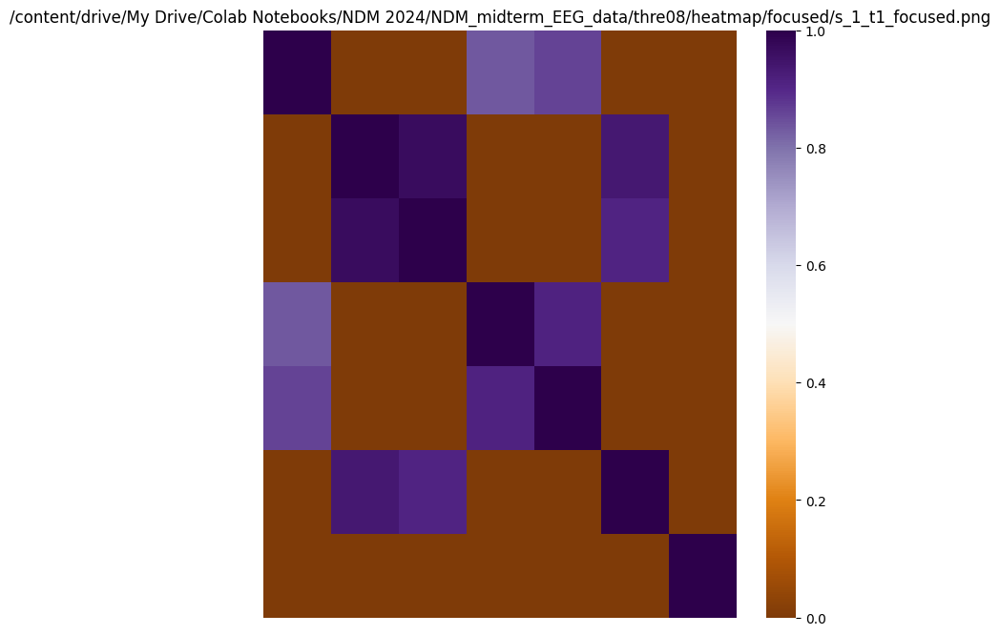

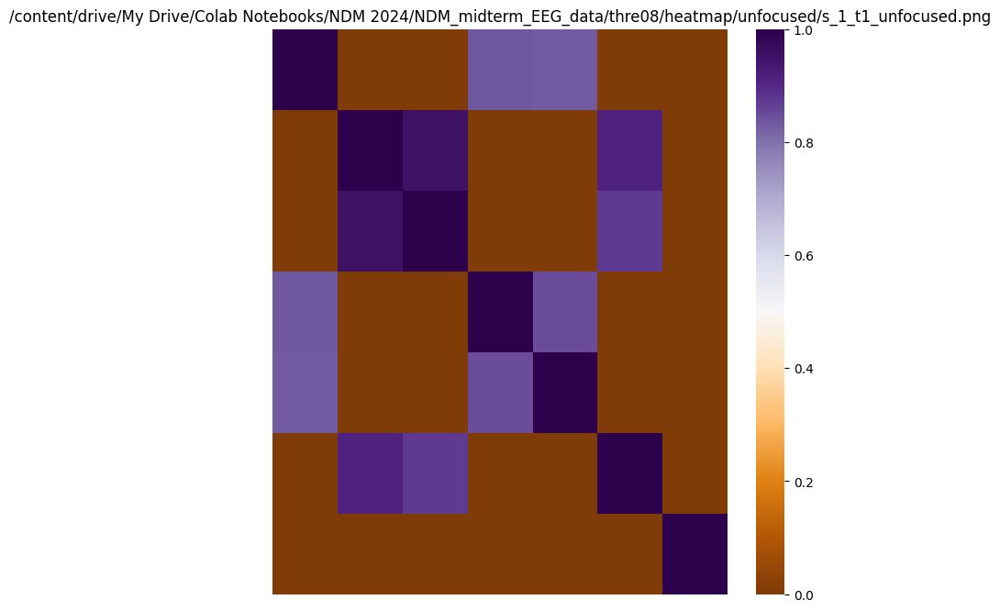

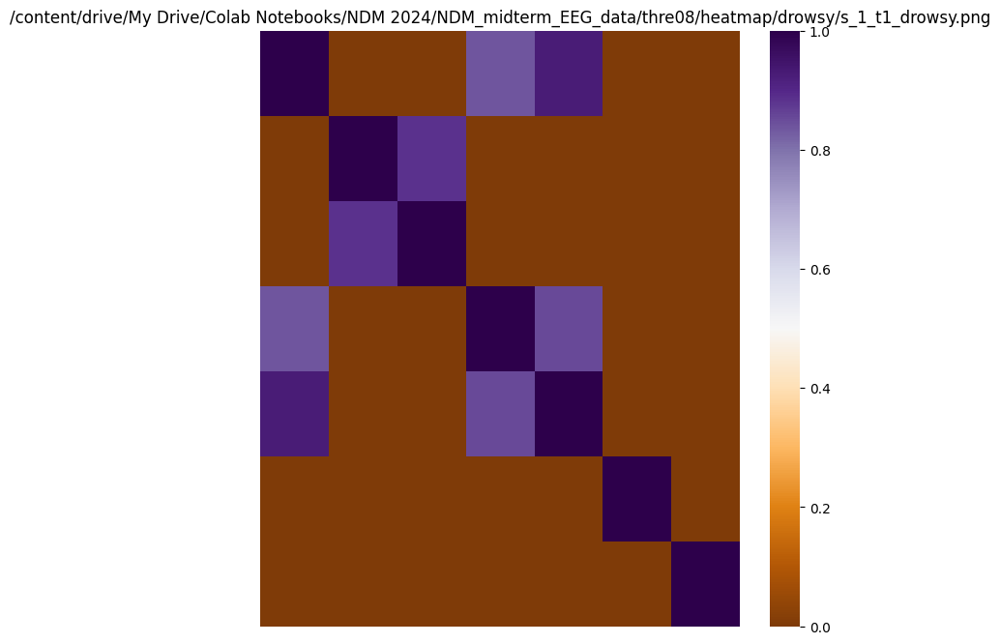

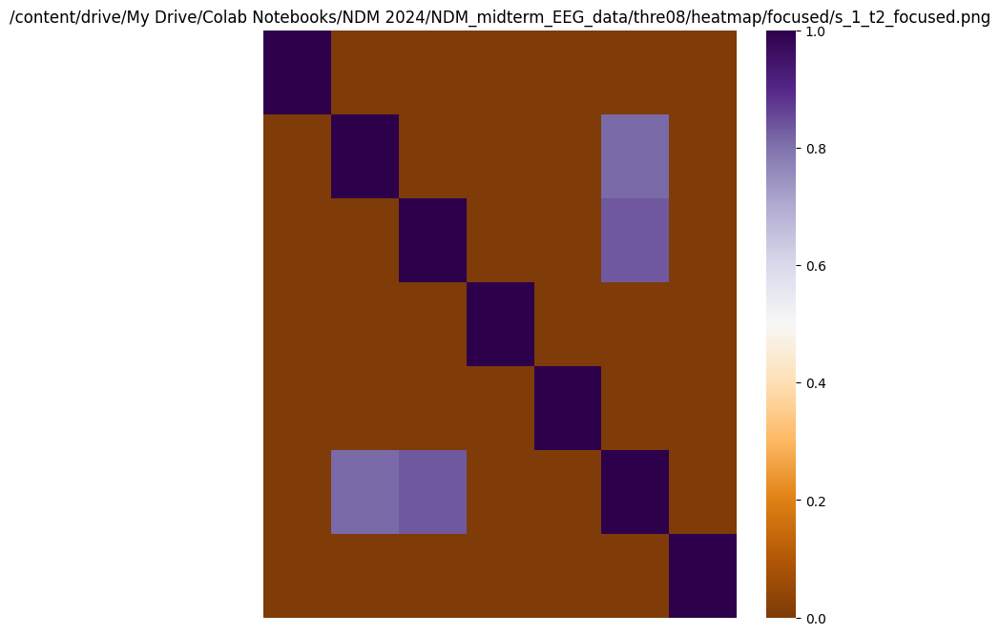

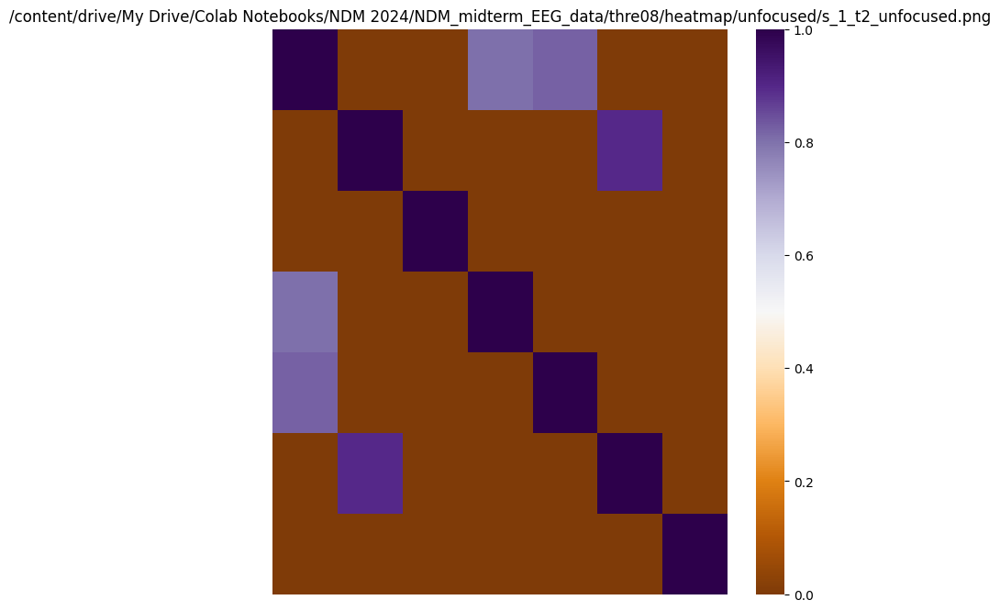

...

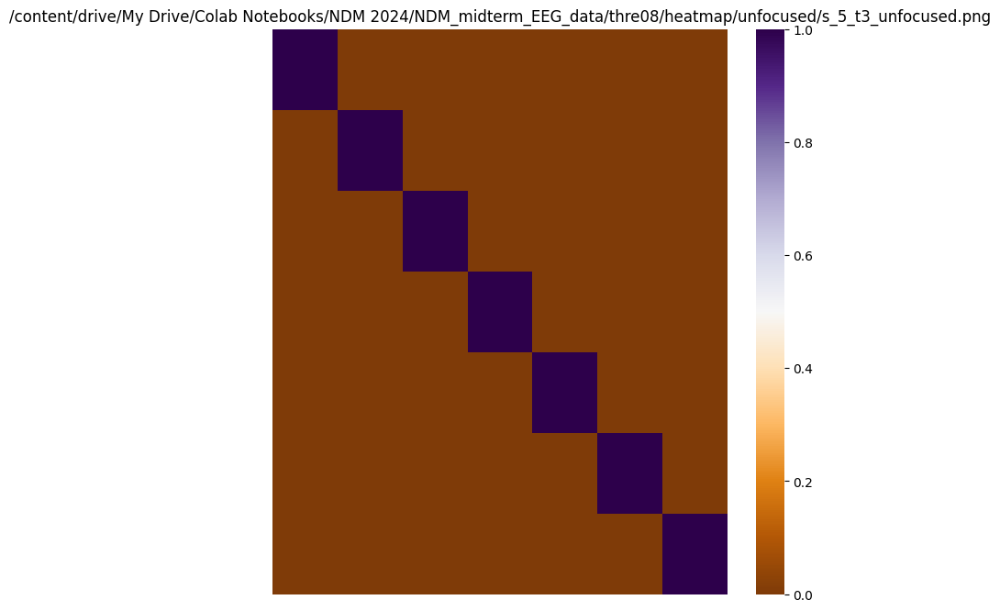

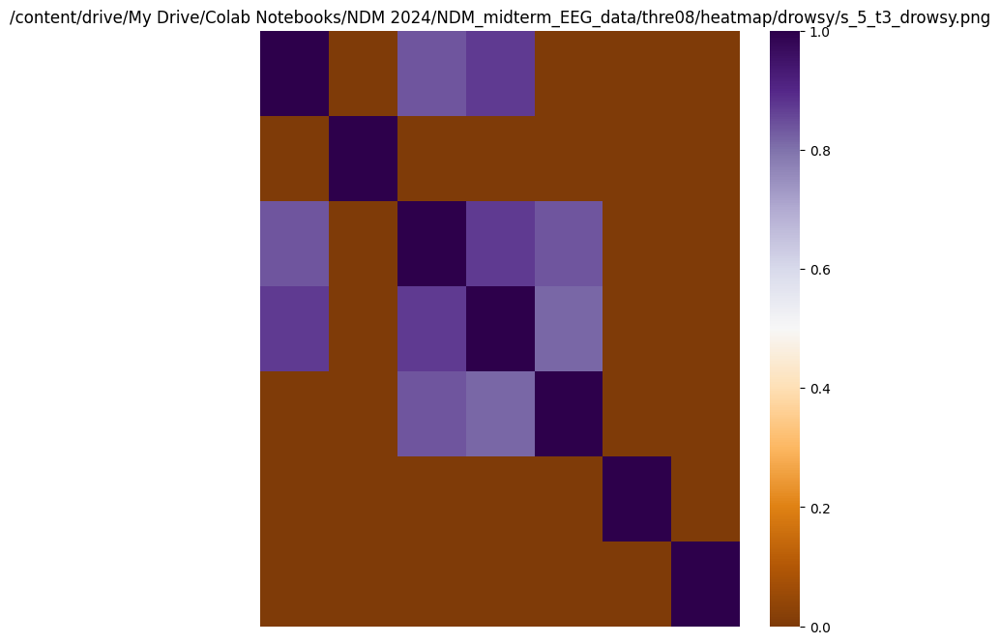

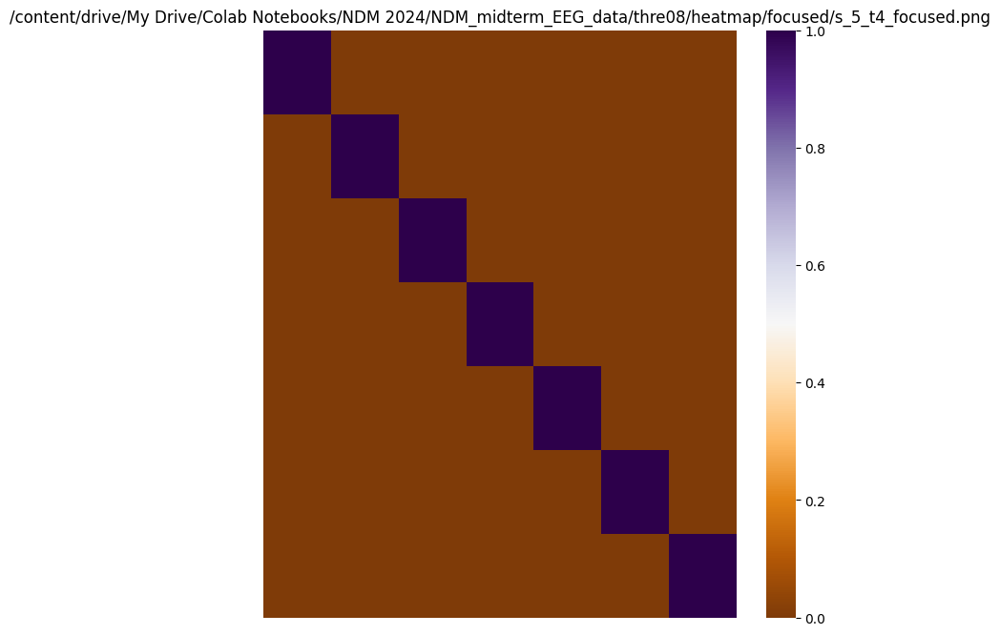

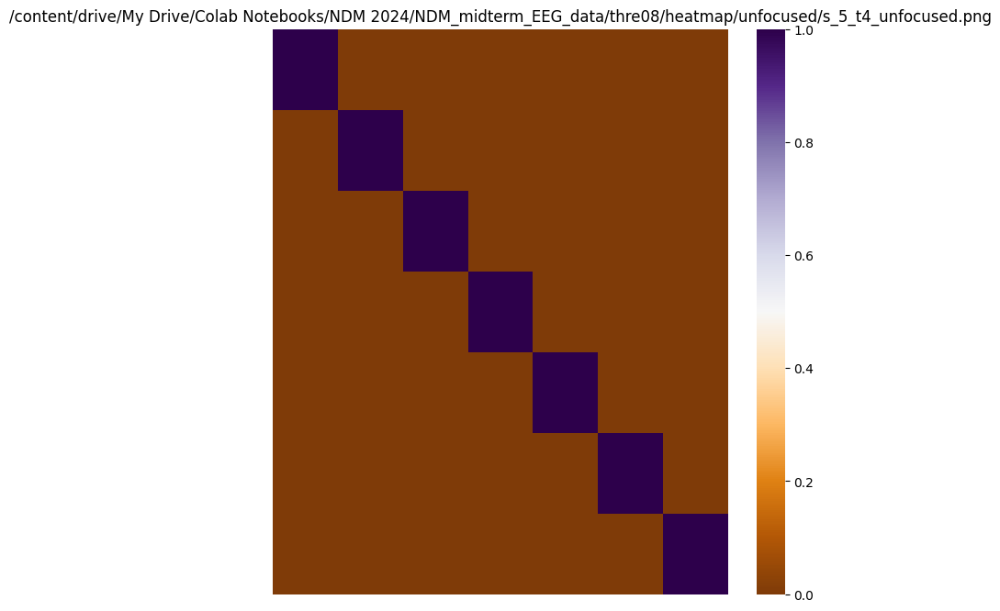

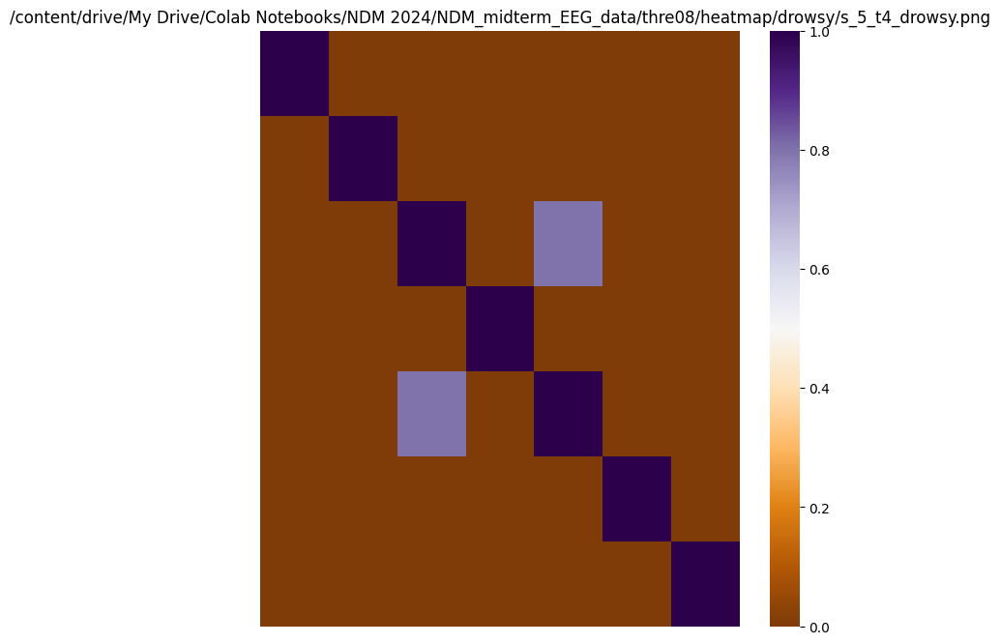

In [ ]:
# Define paths for heatmap and adjacency matrix storage
heatmap_path = f"{drive_root}/thre08/heatmap"
adjmat_path = f"{drive_root}/thre08/adjmat"

# Iterate over all subjects
for subject_id in range(1, total_subjects + 1):
    subject_file = f'subject_{subject_id}.pkl'

    # Load subject data from pickle file
    with open(subject_file, 'rb') as file:
        data = pickle.load(file)

    # Adjust the number of trials for subject 5
    trials = total_trials - 1 if subject_id == 5 else total_trials

    # Iterate over all trials for the current subject
    for trial_id in range(1, trials + 1):
        trial_key = f'trial_{trial_id}'

        # Extract dataframes for different states
        df_focused = data[trial_key]['focused']
        df_unfocused = data[trial_key]['unfocused']
        df_drowsy = data[trial_key]['drowsy']

        # Convert dataframes to numpy arrays
        arr_focused = np.array(df_focused)
        arr_unfocused = np.array(df_unfocused)
        arr_drowsy = np.array(df_drowsy)

        # Create datasets for each state
        dataset_focused = pd.DataFrame({'F7': arr_focused[:, 0], 'F3': arr_focused[:, 1], 'P7': arr_focused[:, 2], 'O1': arr_focused[:, 3], 'O2': arr_focused[:, 4], 'P8': arr_focused[:, 5], 'AF4': arr_focused[:, 6]})
        dataset_unfocused = pd.DataFrame({'F7': arr_unfocused[:, 0], 'F3': arr_unfocused[:, 1], 'P7': arr_unfocused[:, 2], 'O1': arr_unfocused[:, 3], 'O2': arr_unfocused[:, 4], 'P8': arr_unfocused[:, 5], 'AF4': arr_unfocused[:, 6]})
        dataset_drowsy = pd.DataFrame({'F7': arr_drowsy[:, 0], 'F3': arr_drowsy[:, 1], 'P7': arr_drowsy[:, 2], 'O1': arr_drowsy[:, 3], 'O2': arr_drowsy[:, 4], 'P8': arr_drowsy[:, 5], 'AF4': arr_drowsy[:, 6]})

        # Compute correlation matrices
        corr_matrix_focused = dataset_focused.corr()
        corr_matrix_unfocused = dataset_unfocused.corr()
        corr_matrix_drowsy = dataset_drowsy.corr()

        # Print and zero out low correlations for each state
        def print_and_zero_low_correlations(matrix, state):
            print(f"Correlation Matrix for subject {subject_id} trial {trial_id} state '{state}':")
            for m in useful_channels:
                for n in useful_channels:
                    if matrix[m][n] < 0.8:
                        matrix[m][n] = 0
            print(matrix)

        print_and_zero_low_correlations(corr_matrix_focused, 'Focused')
        print_and_zero_low_correlations(corr_matrix_unfocused, 'Unfocused')
        print_and_zero_low_correlations(corr_matrix_drowsy, 'Drowsy')

        print("\n" + "-" * 90 + "\n")

        # Save heatmaps
        def save_heatmap(matrix, state, subject_id, trial_id):
            heatmap_file = f"{heatmap_path}/{state}/s_{subject_id}_t{trial_id}_{state}.png"
            plt.figure(figsize=(8, 8))
            ax = plt.gca()
            ax.set_title(heatmap_file)
            sns.heatmap(matrix, cmap='PuOr')
            plt.savefig(heatmap_file)
            ax.axis('off')

        save_heatmap(corr_matrix_focused, 'focused', subject_id, trial_id)
        save_heatmap(corr_matrix_unfocused, 'unfocused', subject_id, trial_id)
        save_heatmap(corr_matrix_drowsy, 'drowsy', subject_id, trial_id)

        # Save adjacency matrices as CSV files
        def save_adj_matrix(matrix, state, subject_id, trial_id):
            adj_matrix_file = f"{adjmat_path}/{state}/s_{subject_id}_t{trial_id}_{state}.csv"
            matrix.to_csv(adj_matrix_file, index=True)

        save_adj_matrix(corr_matrix_focused, 'focused', subject_id, trial_id)
        save_adj_matrix(corr_matrix_unfocused, 'unfocused', subject_id, trial_id)
        save_adj_matrix(corr_matrix_drowsy, 'drowsy', subject_id, trial_id)

### Comprehensive Summary of EEG Data Analysis

#### Data Overview
- **Subjects**: 5
- **States**: Focused, Unfocused, Drowsy
- **Trials per Subject**: 4-5
- **Recording Context**: Each trial recorded on different days, with the first 10 minutes as focused, the second 10 minutes as unfocused, and the last 10 minutes as drowsy.

#### EEG Channels and Their Significance
- **Frontal Channels (F7, F3, AF4)**: Located over the frontal lobe, these channels are involved in higher cognitive functions, decision-making, and attention.
- **Parietal Channels (P7, P8)**: Located over the parietal lobe, these channels are involved in sensory processing, spatial orientation, and attention mechanisms.
- **Occipital Channels (O1, O2)**: Located over the occipital lobe, these channels are primarily responsible for visual processing.

### Key Findings

#### Focused State
1. **Frontal Channels (F7, F3, AF4)**:
   - **Observation**: High activity and significant correlations indicate strong cognitive engagement and decision-making.
   - **Implication**: Subjects are utilizing their frontal lobes for concentration and task management.

2. **Parietal Channels (P7, P8)**:
   - **Observation**: Frequent significant correlations suggest active sensory processing and spatial awareness.
   - **Implication**: Subjects are integrating sensory inputs and maintaining attention to their surroundings.

3. **Occipital Channels (O1, O2)**:
   - **Observation**: Significant correlations indicate crucial visual processing.
   - **Implication**: Subjects rely heavily on visual information to stay focused.

#### Unfocused State
1. **Frontal Channels (F7, F3, AF4)**:
   - **Observation**: Variability in correlations suggests fluctuating cognitive engagement.
   - **Implication**: Reduced activity indicates a drop in cognitive control and decision-making processes.

2. **Parietal Channels (P7, P8)**:
   - **Observation**: Significant correlations suggest ongoing sensory processing and spatial awareness.
   - **Implication**: The brain remains somewhat alert and aware of the environment.

3. **Occipital Channels (O1, O2)**:
   - **Observation**: Continued significant correlations suggest active visual processing.
   - **Implication**: Visual inputs are still processed, though less focused.

#### Drowsy State
1. **Frontal Channels (F7, F3, AF4)**:
   - **Observation**: Reduced correlations indicate a decline in cognitive engagement.
   - **Implication**: Lower activity reflects diminished cognitive control and executive functions.

2. **Parietal Channels (P7, P8)**:
   - **Observation**: Significant correlations suggest some level of sensory processing and spatial awareness.
   - **Implication**: The brain processes sensory information, but overall alertness is reduced.

3. **Occipital Channels (O1, O2)**:
   - **Observation**: Continued significant correlations indicate ongoing visual processing.
   - **Implication**: Visual information is processed even as subjects become drowsy.

### Special Key Insights
1. **Transition Dynamics**:
   - The transition from focused to unfocused to drowsy states highlights the brain's dynamic response to prolonged cognitive tasks and the gradual decline in attention and alertness.

2. **Individual Differences**:
   - Significant variability in brain activity patterns across subjects reflects individual differences in cognitive abilities, mental state, and external factors.

3. **Role of Occipital and Parietal Regions**:
   - Consistent activity in the occipital (O1, O2) and parietal (P8) regions across all states underscores their importance in visual processing, attention, and spatial awareness.

### Conclusion
The EEG data analysis reveals distinct patterns of brain activity across focused, unfocused, and drowsy states. The frontal, parietal, and occipital regions play crucial roles in cognitive processing, sensory integration, and visual processing, respectively. The variability in correlations and activity levels across these regions reflects the dynamic nature of brain function and the influence of cognitive states on neural activity. Understanding these patterns provides valuable insights into how the brain manages attention, processes sensory information, and responds to cognitive demands, highlighting the complexity and adaptability of human brain function.

### **Defining functions for extracting features from graph metrics**

#### a. Node independent graph measures (Network level measures):

##### 1. Characteristic Path Length

Integration is an important characteristic of a network, representing its ability to become interconnected and exchange information. This ability is quantified using the characteristic path length. The characteristic path length **L** is calculated as:

$ L = \frac{1}{N} \sum_{i=1}^{N} l_i $

where **l_i** is the average shortest path length between node **i** and every other node, calculated as:

$ l_i = \frac{1}{N-1} \sum_{i \neq j} l_{ij} $

Here, **l_{ij}** is the path length from node **i** to node **j**, and **N** is the number of nodes in the network.

In [ ]:
def characteristic_path_length(G):
  """
  Calculates the characteristic path length of a graph.

  The characteristic path length is the average shortest path length between all pairs of nodes in the graph.

  Args:
    G: A NetworkX graph object.

  Returns:
    The characteristic path length of the graph.
  """
  return nx.average_shortest_path_length(G)

##### 2. Assortativity Coefficient

The assortativity coefficient, also called the degree of correlation, measures the tendency of a node with many connections to connect to other nodes with many connections, and vice versa. The value of the assortativity coefficient **r** lies between -1 and +1:
- **-1** means the network is disassortative.
- **+1** means the network is fully assortative.

The assortativity coefficient **r** is calculated as:

$ r = \frac{l^{-1} \sum_{(i,j) \in L} k_i k_j - \left[ l^{-1} \sum_{(i,j) \in L} \frac{1}{2} (k_i + k_j) \right]^2}{l^{-1} \sum_{(i,j) \in L} \frac{1}{2} (k_i^2 + k_j^2) - \left[ l^{-1} \sum_{(i,j) \in L} \frac{1}{2} (k_i + k_j) \right]^2} $

where **k_i** is the degree of node **i**, **L** is the characteristic path length, and **l** is the number of edges with degree greater than **k**.

In [ ]:
def assortativity_coefficient(G):
  """
  Calculates the degree assortativity coefficient of a graph.

  The degree assortativity coefficient measures the correlation between the degrees of connected nodes.

  Args:
    G: A NetworkX graph object.

  Returns:
    The degree assortativity coefficient of the graph, formatted to one decimal place.
  """
  r = nx.degree_assortativity_coefficient(G)
  return f"{r:3.1f}"

##### 3. Modularity

Modularity measures the segregation of a network, representing its ability to be divided into modules. A module is a collection of nodes with denser internal connections and sparser external connections. The modularity **Q** of a network with nodes **N** is calculated as:

$ Q = \frac{1}{2N(N-1)} \sum_{xy} \left( A_{xy} - \frac{K_x K_y}{N(N-1)} \right) \delta(\omega_x \omega_y) $

Here, **ω_x** and **ω_y** are the different modules containing node **x** and node **y**, respectively. **A_{xy}** is the connectivity matrix, which has a value of 1 if there is a link between node **x** and node **y**, otherwise 0. **K_x** is the degree of node **x** and **K_y** is the degree of node **y**.

In [ ]:
def modularity_(G):
  """
  Calculates the modularity of a graph using the Louvain algorithm.

  Modularity measures the strength of division of a network into modules (clusters).

  Args:
    G: A NetworkX graph object.

  Returns:
    The modularity of the graph.
  """
  partition = community_louvain.best_partition(G)  # Find the best community partition
  return community_louvain.modularity(partition, G)  # Calculate modularity


##### 4. Link Density

Link density, also known as connectivity density, represents the network's ability to resist connection failure. It is defined as the ratio of the number of edges present to the maximum possible number of edges in the network.

The link density **L** is calculated as:

$L = \frac{2E}{N(N-1)}$

where **N** is the number of nodes in the network, and **E** is the number of edges/links available in the network.

In [ ]:
def link_density(G):
  """
  Calculates the link density of a graph.

  Link density is the ratio of the number of edges to the maximum possible number of edges.

  Args:
    G: A NetworkX graph object.

  Returns:
    The link density of the graph.
  """
  return nx.density(G)

##### 5. Network Transitivity

Network transitivity is a variant of the classical clustering coefficient, reflecting the connectivity of a specialized region to its neighbors. This measure represents the ability of the brain to segregate into independent, local neighborhoods. Network transitivity **T** can be calculated as:

$ T = \frac{\sum_{i \in N} 2 t_i}{\sum_{i \in N} K_i (K_i - 1)} $

where **t_i** is the number of triangles around node **i**, and **K_i** is the degree of node **i**.

In [ ]:
def network_transitivity(G):
  """
  Calculates the network transitivity (clustering coefficient) of a graph.

  Network transitivity measures the probability that two neighbors of a node are also connected.

  Args:
    G: A NetworkX graph object.

  Returns:
    The network transitivity of the graph.
  """
  return nx.transitivity(G)

#### b. Node dependent graph measures:

##### 1. Node Degree (Average)

Node degree is an important elementary measure of brain connectivity networks. The degree of a node represents the number of links connecting that node to all the other nodes. It is used to determine the importance of a node in the network; a node with a higher degree is considered more important. The node degree for node **i** can be calculated as:

$ K_{i} = \sum_{{i} \neq {j}} A_{ij} $

Here, **A** is the adjacency matrix. **A_{ij}** will have a value of 1 if there is a link between node **i** and node **j**, otherwise 0.

In [ ]:
def node_degree(G):
  """
  Calculates the average node degree of a graph.

  Args:
    G: A NetworkX graph object.

  Returns:
    The average node degree of the graph.
  """
  nodes = nx.nodes(G)  # Get a list of all nodes in the graph
  total_degree = 0  # Initialize the total degree sum
  for node in nodes:  # Iterate through each node
    total_degree += G.degree(node)  # Add the node's degree to the total degree sum
  num_nodes = len(nodes)  # Get the total number of nodes
  average_degree = total_degree / num_nodes  # Calculate the average node degree
  return average_degree  # Return the average node degree

##### 2. Betweenness Centrality

Betweenness centrality is a graph-based measure that represents the impact of a particular region in the information flow over the brain network. It counts how many times a particular node acts as a bridge along the shortest path between two other nodes. The betweenness centrality for the **i-th** node can be calculated as:

$ C_b(i) = \frac{2}{(N-1)(N-2)} \sum_{j \neq h \neq i} \frac{n_hj(i)}{n_hj} $

Here, **n_hj(i)** is the number of shortest paths between node **h** and node **j** that pass through node **i**, and **n_hj** represents the total number of shortest paths between node **h** and node **j**.

In [ ]:
def betweenness_centrality_(G):
  """
  Calculates the average betweenness centrality of a graph.

  Betweenness centrality measures the number of times a node lies on the shortest path between other nodes.
  This function calculates the average betweenness centrality across all nodes in the graph.

  Args:
    G: A NetworkX graph object.

  Returns:
    The average betweenness centrality of the graph.
  """
  betweenness_centralities = nx.betweenness_centrality(G, k=None, normalized=True, weight=None, endpoints=False, seed=None)  # Calculate betweenness centrality for all nodes
  total_betweenness = sum(betweenness_centralities.values())  # Sum the betweenness centrality values
  num_nodes = len(G)  # Get the total number of nodes
  average_betweenness = total_betweenness / num_nodes  # Calculate the average betweenness centrality
  return average_betweenness

##### 3. Closeness Centrality

Closeness centrality is an important measure of centrality that measures how close a node is to all other nodes. A node that is closer to all other nodes will have higher closeness centrality. This measure represents the indirect impact of a brain region over other brain regions. It is calculated as:

$ C_c(i) = \frac{N-1}{\sum_{i \neq j} l_{ij}} $

Here, **l_{ij}** is the shortest path length between node **i** and node **j**, and **N** is the total number of nodes.

In [ ]:
def closeness_centrality_(G):
  """
  Calculates the average closeness centrality of a graph.

  Closeness centrality measures the average distance from a node to all other nodes in the graph.
  This function calculates the average closeness centrality across all nodes in the graph.

  Args:
    G: A NetworkX graph object.

  Returns:
    The average closeness centrality of the graph.
  """
  closeness_centralities = nx.closeness_centrality(G, u=None, distance=None, wf_improved=True)  # Calculate closeness centrality for all nodes
  total_closeness = sum(closeness_centralities.values())  # Sum the closeness centrality values
  num_nodes = len(G)  # Get the total number of nodes
  average_closeness = total_closeness / num_nodes  # Calculate the average closeness centrality
  return average_closeness

##### 4. Participation Coefficient

Participation coefficient is an important measure that represents the edge distribution of a node. A node with the same number of links to all the modules in the network will have a participation coefficient of 1. A node with all its links within its own module will have a participation coefficient of 0. The participation coefficient for node **i** from module **μ** in a network with a total of **C** modules can be calculated as:

$ PC_i = 1 - \sum_{μ=1}^{C} \left( \frac{K_{i,μ}}{K_i} \right)^2 $

Here, **K_{i,μ}** represents the degree of the **i-th** node within module **μ**.

In [ ]:
def participation_coefficient_util(G, module_partition):
    '''
    Computes the participation coefficient of nodes of G with partition
    defined by module_partition.
    (Guimera et al. 2005).

    Parameters
    ----------
    G : :class:`networkx.Graph`
    module_partition : dict
        a dictionary mapping each community name to a list of nodes in G

    Returns
    -------
    dict
        a dictionary mapping the nodes of G to their participation coefficient
        under the participation specified by module_partition.
    '''
    # Initialise dictionary for the participation coefficients
    pc_dict = {}

    # Using sorted() + items() + defaultdict()
    # Grouping dictionary keys by value
    res = defaultdict(list)
    for key, val in sorted(module_partition.items()):
      res[val].append(key)

    # Loop over modules to calculate participation coefficient for each node
    for m in res.keys():
        # Create module subgraph
        M = set(res[m])
        for v in M:
          # Calculate the degree of v in G
          degree = float(nx.degree(G=G, nbunch=v))

          # Calculate the number of intramodule degree of v
          count=0
          for u in M:
            if (u,v) in G.edges():
              count=count+1
          wm_degree = float(count)

          # The participation coeficient is 1 - the square of
          # the ratio of the within module degree and the total degree
          pc_dict[v] = 1 - ((float(wm_degree) / float(degree))**2)

    return pc_dict

def participation_coefficient(G):
  """
  Calculates the average participation coefficient for a graph.

  This function first identifies the best community structure using the Louvain algorithm
  and then calculates the average participation coefficient across all nodes in the graph.

  Args:
    G: A NetworkX graph object.

  Returns:
    The average participation coefficient of the graph.
  """
  # Find the best community partition using the Louvain algorithm
  partition = community_louvain.best_partition(G)

  # Calculate the participation coefficient for each node
  participation_coefficients = participation_coefficient_util(G, partition)

  # Calculate the average participation coefficient across all nodes
  total_participation_coefficient = sum(participation_coefficients.values())
  num_nodes = len(G)
  average_participation_coefficient = total_participation_coefficient / num_nodes

  return average_participation_coefficient

##### 5. Within Module Degree (Z-Score)

The Z-score represents the strength of connectivity of a node in a module, i.e., how well a node **i** is connected to the other nodes in the same module. The Z-score of a node can be calculated as:

$ Z_i = \frac{K_i - K_μ}{\Gamma K_μ} $

Here, **K_i** is the degree of node **i** in module **μ**, **K_μ** is the average degree of all the nodes in module **μ**, and **Γ K_μ** represents the standard deviation of **K**.

In [ ]:
def z_score_util(G, module_partition):
    '''
    Calculate the z-score of the nodes of G under partition module_partition.

    Parameters
    ----------
    G : :class:`networkx.Graph`
    module_partition : dict
        a dictionary mapping each community name to a lists of nodes in G

    Returns
    -------
    dict
        a dictionary mapping the nodes of G to their z-score under
        module_partition.
    '''
    # Initialise dictionary for the z-scores
    z_scores = {}

# Using sorted() + items() + defaultdict()
# Grouping dictionary keys by value
    res = defaultdict(list)
    for key, val in sorted(module_partition.items()):
      res[val].append(key)

    # Loop over modules to calculate z-score for each node
    for m in res.keys():
        # Create module subgraph
        M = G.subgraph(set(res[m]))

        # Calculate relevant module statistics
        M_degrees = list(dict(M.degree()).values())
        M_degree = np.mean(M_degrees)
        M_std = np.std(M_degrees)
        for v in M.nodes:
            # Calculate the number of intramodule edges
            wm_edges = float(nx.degree(G=M, nbunch=v))

            # Calculate z score as the intramodule degree of v
            # minus the mean intramodule degree, all divided by
            # the standard deviation of intramodule degree
            if M_std != 0:
                zs = (wm_edges - M_degree)/M_std
            else:
                # If M_std is 0, then all M_degrees must be equal.
                # It follows that the intramodule degree of v must equal
                # the mean intramodule degree.
                # It is therefore valid to assign a 0 value to the z-score
                zs = 0
            z_scores[v] = zs

    return z_scores

def z_score(G):
  """
  Calculates the average within-module degree z-score for a graph.

  This function first identifies the best community structure using the Louvain algorithm
  and then calculates the average within-module degree z-score across all nodes in the graph.

  Args:
    G: A NetworkX graph object.

  Returns:
    The average within-module degree z-score of the graph.
  """
  # Find the best community partition using the Louvain algorithm
  partition = community_louvain.best_partition(G)

  # Calculate the within-module degree z-score for each node
  z_scores = z_score_util(G, partition)

  # Calculate the average z-score across all nodes
  total_z_score = sum(z_scores.values())
  num_nodes = len(G)
  average_z_score = total_z_score / num_nodes

  return average_z_score

#### Make dir for graph and start extracting features

In [ ]:
# Create the directory for the plots if it does not exist, else use the existing directory
os.makedirs(f"{drive_root}/thre08/graph", exist_ok=True)
os.makedirs(f"{drive_root}/thre08/graph/focused", exist_ok=True)
os.makedirs(f"{drive_root}/thre08/graph/unfocused", exist_ok=True)
os.makedirs(f"{drive_root}/thre08/graph/drowsy", exist_ok=True)

For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/focused/s_1_t1_focused.csv
characteristic_path_length: 0
assortativity_coefficient: 1.0
modularity_: 0.5706585404395008
link_density: 0.6190476190476191
network_transitivity: 1.0
node_degree: 3.7142857142857144
betweenness_centrality_: 0.0
closeness_centrality_: 0.2857142857142857
participation_coefficient: 0.48214285714285715
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_1_t1_unfocused.csv
characteristic_path_length: 0
assortativity_coefficient: 1.0
modularity_: 0.5714267688708579
link_density: 0.6190476190476191
network_transitivity: 1.0
node_degree: 3.7142857142857144
betweenness_centrality_: 0.0
closeness_centrality_: 0.2857142857142857
participation_coefficient: 0.48214285714285715
z_score: 0.0
------------------------------

/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_1_t3_unfocused.csv
characteristic_path_length: 0
assortativity_coefficient: 1.0
modularity_: 0.6214249425779159
link_density: 0.47619047619047616
network_transitivity: 1.0
node_degree: 2.857142857142857
betweenness_centrality_: 0.0
closeness_centrality_: 0.14285714285714285
participation_coefficient: 0.6160714285714286
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_1_t3_drowsy.csv
character

/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_1_t5_unfocused.csv
characteristic_path_length: 0
assortativity_coefficient: 1.0
modularity_: 0.7470798264918184
link_density: 0.42857142857142855
network_transitivity: 0
node_degree: 2.5714285714285716
betweenness_centrality_: 0.0
closeness_centrality_: 0.09523809523809523
participation_coefficient: 0.638888888888889
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_1_t5_drowsy.csv
characteris

<ipython-input-43-105a599b8d19>:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5, 5))
/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/focused/s_2_t3_focused.csv
characteristic_path_length: 0
assortativity_coefficient: 0.7
modularity_: 0.541713636765949
link_density: 0.5714285714285714
network_transitivity: 0.5
node_degree: 3.4285714285714284
betweenness_centrality_: 0.06666666666666667
closeness_centrality_: 0.290854119425548
participation_coefficient: 0.6172222222222222
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_2_t3_unfocuse

/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_2_t5_unfocused.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_2_t5_drowsy.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/focused/s_3_t1_focused.csv
characteristic_path_length: 0
assortativity_coefficient: 1.0
modularity_: 0.7454869513599351
link_density: 0.42857142857142855
network_transitivity: 0
node_degree: 2.5714285714285716
betweenness_centrality_: 0.0
closeness_centrality_: 0.09523809523809523
participation_coefficient: 0.638888888888889
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_3_t1_unfocused.csv
character

/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_3_t2_unfocused.csv
characteristic_path_length: 0
assortativity_coefficient: 1.0
modularity_: 0.27398802778998393
link_density: 0.8095238095238095
network_transitivity: 1.0
node_degree: 4.857142857142857
betweenness_centrality_: 0.0
closeness_centrality_: 0.47619047619047616
participation_coefficient: 0.9087301587301588
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_3_t2_drowsy.csv
character

/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_3_t3_drowsy.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/focused/s_3_t4_focused.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_3_t4_unfocused.csv
characteristic_path_length: 0
assortativity_coefficient: 1.0
modularity_: 0.7877115636618928
link_density: 0.38095238095238093
network_transitivity: 0
node_degree: 2.2857142857142856
betweenness_centrality_: 0.0
closeness_centrality_: 0.047619047619047616
participation_coefficient: 0.6944444444444444
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_3_t4_drowsy.csv
character

/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_3_t5_unfocused.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_3_t5_drowsy.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/focused/s_4_t1_focused.csv
characteristic_path_length: 0
assortativity_coefficient: 1.0
modularity_: 0.6206874073042359
link_density: 0.5238095238095238
network_transitivity: 1.0
node_degree: 3.142857142857143
betweenness_centrality_: 0.0
closeness_centrality_: 0.19047619047619047
participation_coefficient: 0.560515873015873
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_4_t1_unfocused.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_4_t1_drowsy.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/focused/s_4_t2_focused.csv
characteristic_path_length: 0
assortativity_coefficient: 1.0
modularity_: 0.7875704208464054
link_density: 0.38095238095238093
network_transitivity: 0
node_degree: 2.2857142857142856
betweenness_centrality_: 0.0
closeness_centrality_: 0.047619047619047616
participation_coefficient: 0.6944444444444444
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_4_t2_unfocused.csv
charact

/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/focused/s_4_t3_focused.csv
characteristic_path_length: 0
assortativity_coefficient: 0.7
modularity_: 0.6804968735775028
link_density: 0.42857142857142855
network_transitivity: 0
node_degree: 2.5714285714285716
betweenness_centrality_: 0.009523809523809523
closeness_centrality_: 0.11111111111111109
participation_coefficient: 0.7420634920634921
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_4_t3_unfoc

/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_4_t3_drowsy.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/focused/s_4_t4_focused.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_4_t4_unfocused.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_4_t4_drowsy.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/focused/s_4_t5_focused.csv
characteristic_path_length: 0
assortativity_coefficient: 1.0
modularity_: 0.7845105026628443
link_density: 0.38095238095238093
network_transitivity: 0
node_degree: 2.2857142857142856
betweenness_centrality_: 0.0
closeness_centrality_: 0.047619047619047616
participation_coefficient: 0.6944444444444444
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_4_t5_unfocused.csv
charact

/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_5_t1_unfocused.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_5_t1_drowsy.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/focused/s_5_t2_focused.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_5_t2_unfocused.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_5_t2_drowsy.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/focused/s_5_t3_focused.csv
characteristic_path_length: 0
assortativity_coefficient: 1.0
modularity_: 0.6169035512041403
link_density: 0.47619047619047616
network_transitivity: 1.0
node_degree: 2.857142857142857
betweenness_centrality_: 0.0
closeness_centrality_: 0.14285714285714285
participation_coefficient: 0.6160714285714286
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_5_t3_unfocused.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_5_t3_drowsy.csv
characteristic_path_length: 0
assortativity_coefficient: 0.8
modularity_: 0.4829458592499075
link_density: 0.5714285714285714
network_transitivity: 0.75
node_degree: 3.4285714285714284
betweenness_centrality_: 0.009523809523809523
closeness_centrality_: 0.25
participation_coefficient: 0.7757142857142857
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/focused/s_5_t4_focused.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/unfocused/s_5_t4_unfocused.csv


/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


characteristic_path_length: 0
assortativity_coefficient: nan
modularity_: 0.8571428571428572
link_density: 0.3333333333333333
network_transitivity: 0
node_degree: 2.0
betweenness_centrality_: 0.0
closeness_centrality_: 0.0
participation_coefficient: 0.75
z_score: 0.0
---------------------------------------------------------------------
For adjacency matrix: /content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/thre08/adjmat/drowsy/s_5_t4_drowsy.csv
characteristic_path_length: 0
assortativity_coefficient: 1.0
modularity_: 0.788937180777301
link_density: 0.38095238095238093
network_transitivity: 0
node_degree: 2.2857142857142856
betweenness_centrality_: 0.0
closeness_centrality_: 0.047619047619047616
participation_coefficient: 0.6944444444444444
z_score: 0.0
---------------------------------------------------------------------


,characteristic_path_length,assortativity_coefficient,modularity_,link_density,network_transitivity,node_degree,betweenness_centrality_,closeness_centrality_,participation_coefficient,z_score
0,0,1.0,0.570659,0.619048,1.00,3.714286,0.000000,0.285714,0.482143,0.0
1,0,1.0,0.571427,0.619048,1.00,3.714286,0.000000,0.285714,0.482143,0.0
2,0,1.0,0.620275,0.523810,1.00,3.142857,0.000000,0.190476,0.560516,0.0
3,0,0.7,0.685722,0.428571,0.00,2.571429,0.009524,0.111111,0.742063,0.0
4,0,0.6,0.664875,0.476190,0.00,2.857143,0.009524,0.158730,0.686508,0.0
...,...,...,...,...,...,...,...,...,...,...
67,0,nan,0.857143,0.333333,0.00,2.000000,0.000000,0.000000,0.750000,0.0
68,0,0.8,0.482946,0.571429,0.75,3.428571,0.009524,0.250000,0.775714,0.0
69,0,nan,0.857143,0.333333,0.00,2.000000,0.000000,0.000000,0.750000,0.0
70,0,nan,0.857143,0.333333,0.00,2.000000,0.000000,0.000000,0.750000,0.0


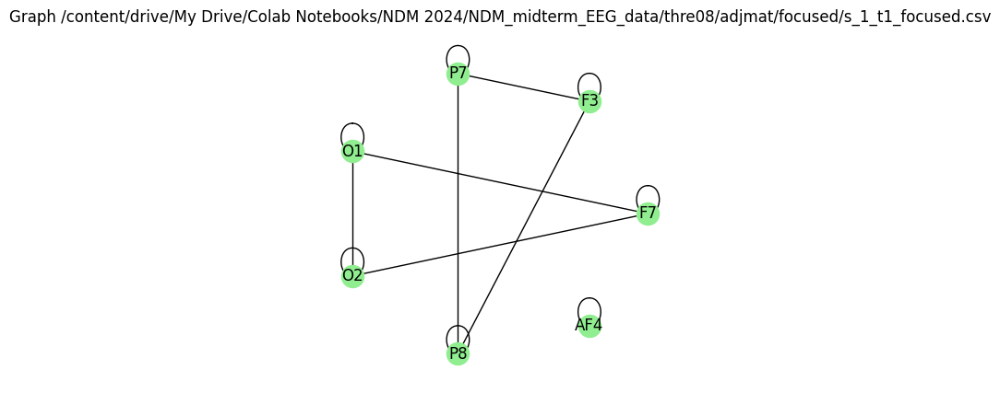

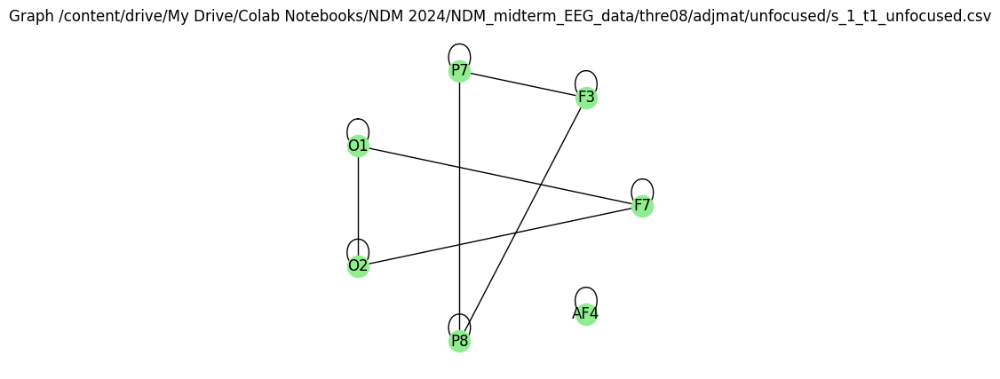

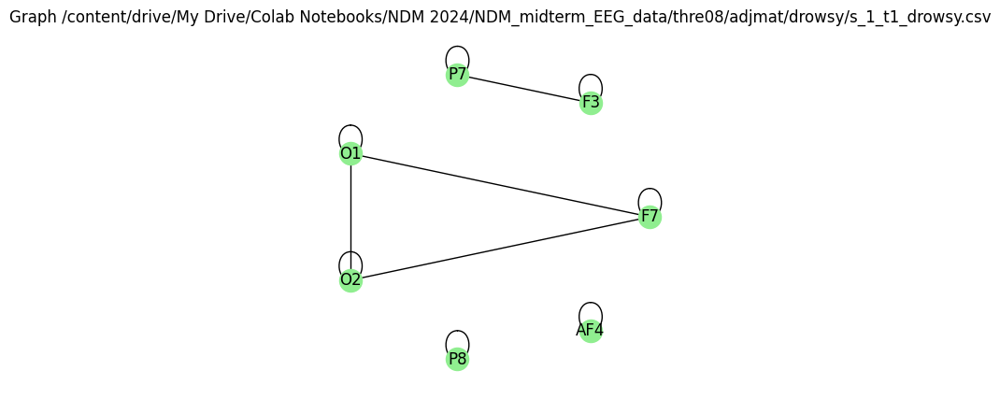

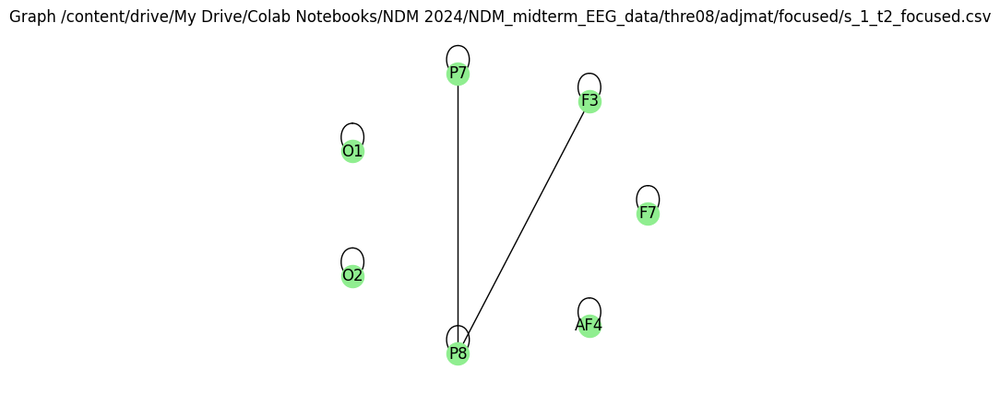

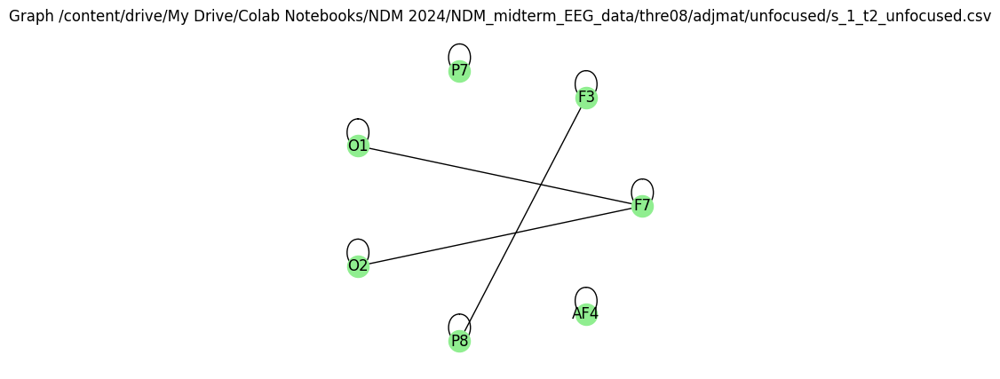

...

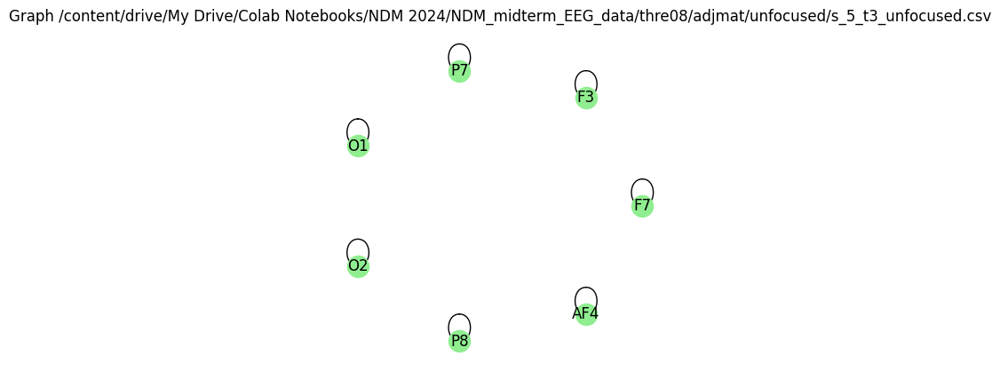

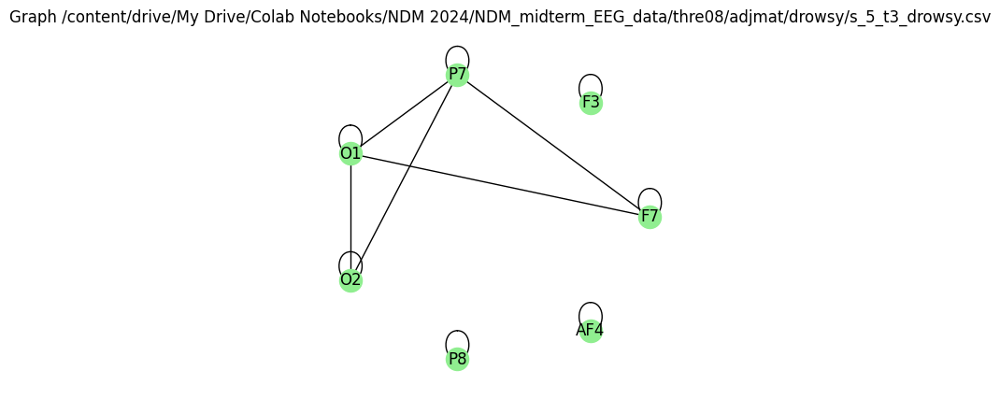

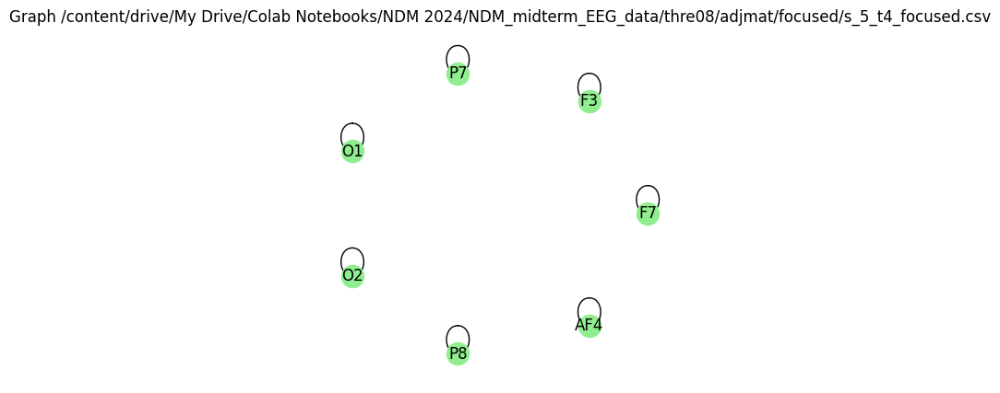

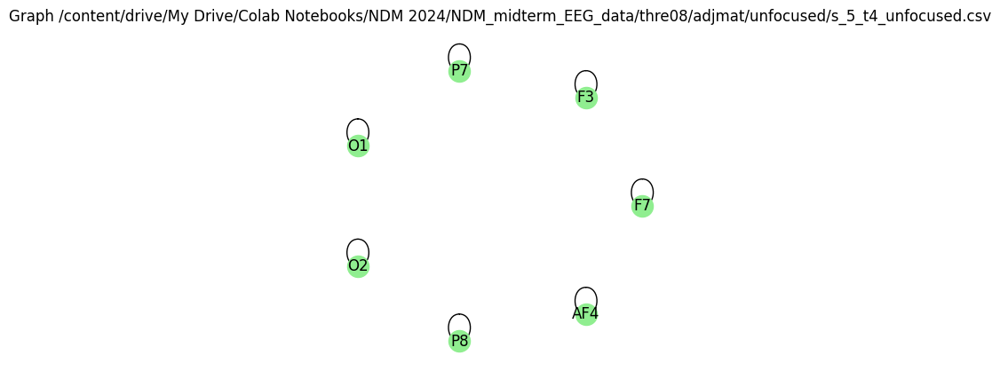

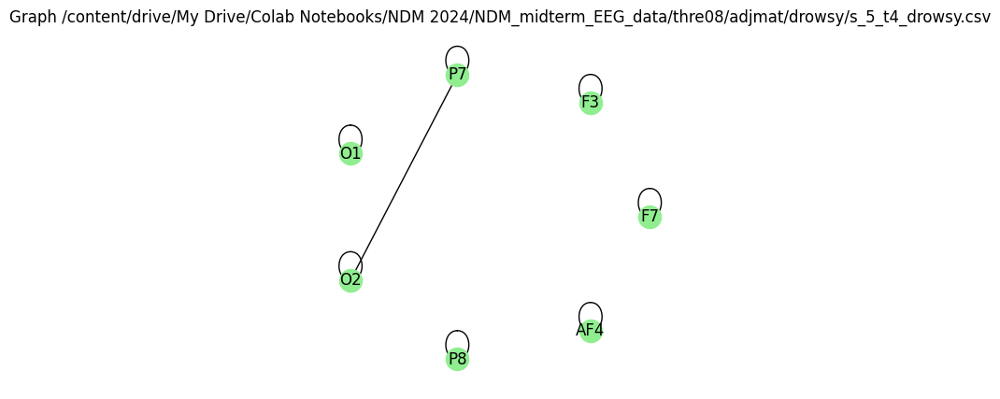

In [ ]:
# Initialize dictionary to store network metrics
network_metrics = {
    "characteristic_path_length": [],
    "assortativity_coefficient": [],
    "modularity_": [],
    "link_density": [],
    "network_transitivity": [],
    "node_degree": [],
    "betweenness_centrality_": [],
    "closeness_centrality_": [],
    "participation_coefficient": [],
    "z_score": []
}

# Define paths for adjacency matrix and graph storage
adjmat_path = f"{drive_root}/thre08/adjmat"
graph_path = f"{drive_root}/thre08/graph"

# Iterate over all subjects
for subject_id in range(1, total_subjects + 1):
    # Adjust the number of trials for subject 5
    trials = total_trials - 1 if subject_id == 5 else total_trials

    # Iterate over all trials for the current subject
    for trial_id in range(1, trials + 1):
        # Process each state: focused, unfocused, drowsy
        for state in ["focused", "unfocused", "drowsy"]:
            adj_matrix_file = f"{adjmat_path}/{state}/s_{subject_id}_t{trial_id}_{state}.csv"
            print(f"For adjacency matrix: {adj_matrix_file}")

            # Load adjacency matrix
            adj_matrix = pd.read_csv(adj_matrix_file, index_col=0)

            # Plot and save graph
            plt.figure(figsize=(5, 5))
            ax = plt.gca()
            graph_title = f"Graph {adj_matrix_file}"
            ax.set_title(graph_title)
            G = nx.from_pandas_adjacency(adj_matrix)
            nx.draw_circular(G, with_labels=True, node_color='lightgreen', ax=ax)
            graph_file = f"{graph_path}/{state}/s_{subject_id}_t{trial_id}_{state}.png"
            plt.savefig(graph_file)
            ax.axis('off')

            # Append network metrics to dictionary
            network_metrics["characteristic_path_length"].append(0)  # Since the graphs will not be fully connected
            network_metrics["assortativity_coefficient"].append(assortativity_coefficient(G))
            network_metrics["modularity_"].append(modularity_(G))
            network_metrics["link_density"].append(link_density(G))
            network_metrics["network_transitivity"].append(network_transitivity(G))
            network_metrics["node_degree"].append(node_degree(G))
            network_metrics["betweenness_centrality_"].append(betweenness_centrality_(G))
            network_metrics["closeness_centrality_"].append(closeness_centrality_(G))
            network_metrics["participation_coefficient"].append(participation_coefficient(G))
            network_metrics["z_score"].append(z_score(G))

            # Print network metrics
            print(f"characteristic_path_length: {0}")
            print(f"assortativity_coefficient: {assortativity_coefficient(G)}")
            print(f"modularity_: {modularity_(G)}")
            print(f"link_density: {link_density(G)}")
            print(f"network_transitivity: {network_transitivity(G)}")
            print(f"node_degree: {node_degree(G)}")
            print(f"betweenness_centrality_: {betweenness_centrality_(G)}")
            print(f"closeness_centrality_: {closeness_centrality_(G)}")
            print(f"participation_coefficient: {participation_coefficient(G)}")
            print(f"z_score: {z_score(G)}")
            print("---------------------------------------------------------------------")

# Convert dictionary to DataFrame and save as CSV
network_metrics_df = pd.DataFrame.from_dict(network_metrics)
network_metrics_df.to_csv("M2.csv", index=True)
network_metrics_df

## **II. Feature Engineering**

### **Take useful channels**

In [ ]:
file_names=[]
for dirname, _, filenames in os.walk(data_root):
    for filename in filenames:
        file_names.append(os.path.join(dirname, filename))
print("Number of files: ",len(file_names))
print(file_names)

Number of files:  34
['/content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/EEG Data/eeg_record10.mat', '/content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/EEG Data/eeg_record1.mat', '/content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/EEG Data/eeg_record12.mat', '/content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/EEG Data/eeg_record11.mat', '/content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/EEG Data/eeg_record13.mat', '/content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/EEG Data/eeg_record15.mat', '/content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/EEG Data/eeg_record17.mat', '/content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/EEG Data/eeg_record16.mat', '/content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/EEG Data/eeg_record18.mat', '/content/drive/My Drive/Colab Notebooks/NDM 2024/NDM_midterm_EEG_data/EEG Data/eeg_reco

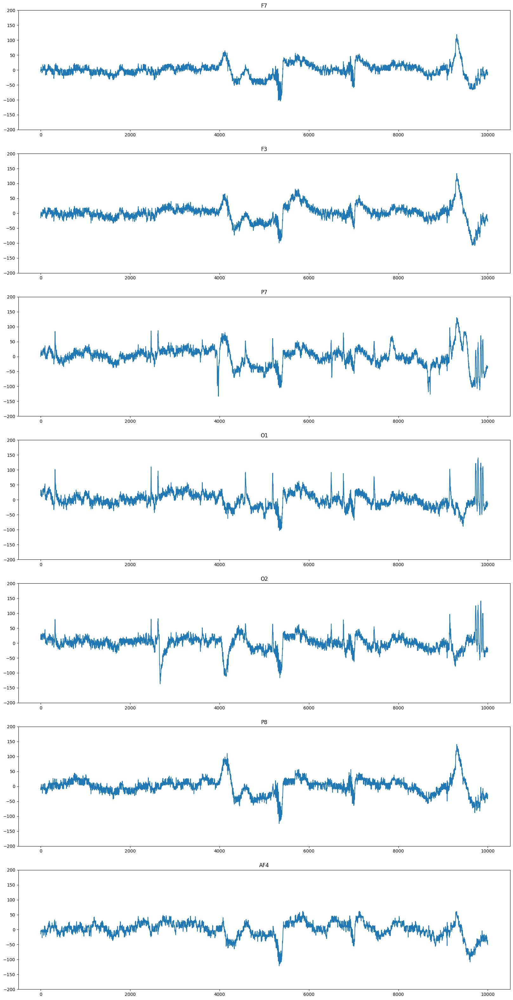

In [ ]:
useful_channels=[4,5,8,9,10,11,16]
useful_channels_names=['F7','F3','P7','O1','O2','P8','AF4']
fig,ax = plt.subplots(7)
fig.set_size_inches(20,40)
j=0
mat = scipy.io.loadmat(file_names[0])
data = mat['o']['data'][0,0]
for i in useful_channels:
    data_ave = data[5000:15000,i]-np.mean(data[5000:15000,i])
    ax[j].plot(data_ave)
    ax[j].set_ylim(-200,200)
    ax[j].set_title(channels[i-3])
    j=j+1

In [ ]:
# Constants
MARKER = 128 * 60 * 10

# Useful file indices (excluding file #28 because it does not have enough data)
USEFUL_FILE_INDEX = [3, 4, 5, 6, 7, 10, 11, 12, 13, 14, 17, 18, 19, 20, 21, 24, 25, 26, 27, 31, 32, 33, 34]

# Number of channels
CHAN_NUM = 7

# Initialize dictionaries to store data
trail_names = []
data_focus = {}
data_unfocus = {}
data_drowsy = {}
focus = {}
unfocus = {}
drowsy = {}

# Load and process data from files
for index, filename in enumerate(filenames):
    file_id = int(filename.split('d')[1].split('.')[0])
    if file_id in USEFUL_FILE_INDEX:
        mat = scipy.io.loadmat(file_names[index])
        trail_name = filename.split('.')[0]
        trail_names.append(trail_name)

        # Extract data for different states
        data_focus[trail_name] = mat['o']['data'][0, 0][0:MARKER, useful_channels].copy()
        data_unfocus[trail_name] = mat['o']['data'][0, 0][MARKER:2*MARKER, useful_channels].copy()
        data_drowsy[trail_name] = mat['o']['data'][0, 0][2*MARKER:3*MARKER, useful_channels].copy()

        # Duplicate data for focus, unfocus, and drowsy states
        focus[trail_name] = data_focus[trail_name].copy()
        unfocus[trail_name] = data_unfocus[trail_name].copy()
        drowsy[trail_name] = data_drowsy[trail_name].copy()
print("\ntrail_names:\n", trail_names)
# Get the shape of the data for filtering
row, col = data_focus['eeg_record4'].shape

# Apply bandpass filter to the data
def apply_bandpass_filter(data_dict, trail_names, col):
    for name in trail_names:
        for i in range(col):
            data_dict[name][:, i] = bp_filter(data_dict[name][:, i], f_lo=2, f_hi=40, fs=128)

apply_bandpass_filter(data_focus, trail_names, col)
apply_bandpass_filter(data_unfocus, trail_names, col)
apply_bandpass_filter(data_drowsy, trail_names, col)


trail_names:
 ['eeg_record10', 'eeg_record12', 'eeg_record11', 'eeg_record13', 'eeg_record17', 'eeg_record18', 'eeg_record14', 'eeg_record24', 'eeg_record20', 'eeg_record19', 'eeg_record21', 'eeg_record25', 'eeg_record26', 'eeg_record27', 'eeg_record3', 'eeg_record33', 'eeg_record31', 'eeg_record32', 'eeg_record4', 'eeg_record34', 'eeg_record7', 'eeg_record6', 'eeg_record5']


In [ ]:
data_focus.keys()

dict_keys(['eeg_record10', 'eeg_record17', 'eeg_record12', 'eeg_record11', 'eeg_record13', 'eeg_record14', 'eeg_record20', 'eeg_record18', 'eeg_record21', 'eeg_record19', 'eeg_record25', 'eeg_record26', 'eeg_record24', 'eeg_record27', 'eeg_record31', 'eeg_record3', 'eeg_record33', 'eeg_record32', 'eeg_record34', 'eeg_record5', 'eeg_record6', 'eeg_record4', 'eeg_record7'])

### **Power Spectral Density**

In [ ]:
def extract_psd_features(eeg_data, fs=128):
    """
    Extracts Power Spectral Density (PSD) features for each EEG channel and sample.

    Parameters:
    - eeg_data: NumPy array of shape (n_samples, n_channels, time_points)
    - fs: Sampling frequency (Hz)

    Returns:
    - psd_features: NumPy array of shape (n_samples, n_channels * 5) containing PSD features
                    (Delta, Theta, Alpha, Beta, Gamma) for each channel.
    """
    n_samples, n_channels, time_points = eeg_data.shape
    psd_features = []

    for sample in eeg_data:
        sample_psd = []
        for channel_data in sample:
            # Adjust nperseg dynamically based on the length of the channel data
            nperseg = min(256, len(channel_data))  # Use smaller segments for shorter signals

            # Compute the PSD using Welch's method
            f, Pxx = welch(channel_data, fs=fs, nperseg=nperseg)

            # Extract power in typical EEG frequency bands
            delta_power = np.sum(Pxx[(f >= 0.5) & (f < 4)])
            theta_power = np.sum(Pxx[(f >= 4) & (f < 8)])
            alpha_power = np.sum(Pxx[(f >= 8) & (f < 13)])
            beta_power = np.sum(Pxx[(f >= 13) & (f < 30)])
            gamma_power = np.sum(Pxx[(f >= 30) & (f < 40)])

            # Concatenate the power features for each channel
            sample_psd.extend([delta_power, theta_power, alpha_power, beta_power, gamma_power])

        # Append features for the current sample
        psd_features.append(sample_psd)

    return np.array(psd_features)


### **Statistical Features**

In [ ]:
def extract_statistical_features(eeg_data):
    """
    Extracts statistical features from EEG signals.

    Parameters:
    - eeg_data: NumPy array of shape (samples, channels)

    Returns:
    - features: NumPy array of shape (samples, channels * 8) containing statistical features
                (mean, variance, standard deviation, skewness, kurtosis, max, min, entropy) for each channel.
    """
    features = []

    for sample in eeg_data:
        sample_features = []
        for channel_data in sample:
            # Compute statistical features
            mean_val = np.mean(channel_data)
            var_val = np.var(channel_data)
            std_val = np.std(channel_data)
            skewness = skew(channel_data)
            kurt = kurtosis(channel_data)
            max_val = np.max(channel_data)
            min_val = np.min(channel_data)
            signal_entropy = entropy(np.histogram(channel_data, bins=10, density=True)[0])

            # Add features for this channel
            sample_features.extend([mean_val, var_val, std_val, skewness, kurt, max_val, min_val, signal_entropy])

        # Add features for this sample
        features.append(sample_features)

    return np.array(features)


### **Combine features and test**

In [ ]:
def extract_combined_features(eeg_data, fs=128):
    """
    Combines frequency domain and statistical features.

    Parameters:
    - eeg_data: NumPy array of shape (samples, channels)
    - fs: Sampling frequency (Hz)

    Returns:
    - combined_features: NumPy array of combined features for each sample
    """
    # Extract Power Spectral Density (PSD) features
    psd_features = extract_psd_features(eeg_data, fs)

    # Extract statistical features
    stat_features = extract_statistical_features(eeg_data)

    # Concatenate PSD and statistical features
    combined_features = np.concatenate([psd_features, stat_features], axis=1)

    return combined_features


In [ ]:
print(dat.shape)
print(dat.size)

(357224, 14)
5001136


In [ ]:
# 'dat' is the DataFrame loaded with shape (357224, 14)

# Convert DataFrame to NumPy array
dat_array = dat.to_numpy()

# Define time points and number of channels
time_points = 128
n_channels = 14

# Calculate the number of samples
n_samples = dat_array.shape[0] // time_points  # Calculate number of samples

# Reshape the data into (n_samples, time_points, n_channels)
reshaped_data = dat_array[:n_samples * time_points].reshape(n_samples, time_points, n_channels)

# Apply the PSD function to the reshaped data
psd_features = extract_psd_features(reshaped_data)  # Apply the 'psd' function
print("PSD Features Shape:", psd_features.shape)


PSD Features Shape: (2790, 640)


In [ ]:
# Apply statistical feature extraction
statistical_features = extract_statistical_features(reshaped_data)
print("Statistical Features Shape:", statistical_features.shape)

Statistical Features Shape: (2790, 1024)


In [ ]:
# Apply combined feature extraction
# Combine PSD features and statistical features
combined_features = extract_combined_features(reshaped_data)
print("Combined Features Shape:", combined_features.shape)

Combined Features Shape: (2790, 1664)


In [ ]:
#--------0
label_focus = [0]*585
#--------1
label_unfocus = [1]*585
#--------2
label_drowsy = [2]*585

#subject is the variable for all participants

subj1_files={'eeg_record3','eeg_record4','eeg_record5','eeg_record6','eeg_record7'}
subj2_files={'eeg_record10','eeg_record11','eeg_record12','eeg_record13','eeg_record14'}
subj3_files={'eeg_record17','eeg_record18','eeg_record19','eeg_record20','eeg_record21'}
subj4_files={'eeg_record24','eeg_record25','eeg_record26','eeg_record27'}
subj5_files={'eeg_record31','eeg_record32','eeg_record33','eeg_record34'}


In [ ]:
# Constants
FS = 128  # Sampling frequency
NFFT = 1024  # Number of FFT points
NPERSEG = 128  # Length of each segment
NOVERLAP = 0  # Number of points to overlap between segments
WINDOW_LENGTH = 128  # Length of the window

# Generate Blackman window
t_win = np.arange(0, WINDOW_LENGTH)
window_blackman = 0.42 - 0.5 * np.cos((2 * np.pi * t_win) / (WINDOW_LENGTH - 1)) + 0.08 * np.cos((4 * np.pi * t_win) / (WINDOW_LENGTH - 1))

# Initialize dictionaries to store power data for each state
power_focus = {name: np.zeros([col, 513, 601]) for name in trail_names}
power_unfocus = {name: np.zeros([col, 513, 601]) for name in trail_names}
power_drowsy = {name: np.zeros([col, 513, 601]) for name in trail_names}

# STFT was then calculated at a time step of 1 s producing a set of time-varying DFT
# amplitudes X STFT (t,ω) at 1s intervals within each input EEG channel.
for name in trail_names:
    for i in range(col):
        # Compute STFT for focused state
        f, t, y1 = scipy.signal.stft(data_focus[name][:, i], fs=FS, window=window_blackman, nperseg=NPERSEG,
                                     noverlap=NOVERLAP, nfft=NFFT, detrend=False, return_onesided=True,
                                     boundary='zeros', padded=True)
        # Compute STFT for unfocused state
        f, t, y2 = scipy.signal.stft(data_unfocus[name][:, i], fs=FS, window=window_blackman, nperseg=NPERSEG,
                                     noverlap=NOVERLAP, nfft=NFFT, detrend=False, return_onesided=True,
                                     boundary='zeros', padded=True)
        # Compute STFT for drowsy state
        f, t, y3 = scipy.signal.stft(data_drowsy[name][:, i], fs=FS, window=window_blackman, nperseg=NPERSEG,
                                     noverlap=NOVERLAP, nfft=NFFT, detrend=False, return_onesided=True,
                                     boundary='zeros', padded=True)

        # Calculate power spectral density
        power_focus[name][i, :, :] = (np.abs(y1)) ** 2
        power_unfocus[name][i, :, :] = (np.abs(y2)) ** 2
        power_drowsy[name][i, :, :] = (np.abs(y3)) ** 2

In [ ]:
# Combine bins into 0.5 Hz and keep 0-18 Hz.

# Initialize dictionaries to store binned power data for each state
power_focus_bin = {name: np.zeros([7, 36, 601]) for name in trail_names}
power_unfocus_bin = {name: np.zeros([7, 36, 601]) for name in trail_names}
power_drowsy_bin = {name: np.zeros([7, 36, 601]) for name in trail_names}

# Bin the power data into 0.5 Hz intervals
for name in trail_names:
    for chn in range(col):
        j = 0
        for i in range(1, 144, 4):
            # Average power over 4 frequency bins to get 0.5 Hz resolution
            power_focus_bin[name][chn, j, :] = np.average(power_focus[name][chn, i:i+4, :], axis=0)
            power_unfocus_bin[name][chn, j, :] = np.average(power_unfocus[name][chn, i:i+4, :], axis=0)
            power_drowsy_bin[name][chn, j, :] = np.average(power_drowsy[name][chn, i:i+4, :], axis=0)
            j += 1

In [ ]:
# Average over 15 seconds running window.

# Initialize dictionaries to store averaged power data for each state
power_focus_ave = {name: np.zeros([7, 36, 585]) for name in trail_names}
power_unfocus_ave = {name: np.zeros([7, 36, 585]) for name in trail_names}
power_drowsy_ave = {name: np.zeros([7, 36, 585]) for name in trail_names}

# Average power data over a 15-second running window
for name in trail_names:
    for chn in range(col):
        for j in range(585):
            power_focus_ave[name][chn, :, j] = np.average(power_focus_bin[name][chn, :, j:j+15], axis=1)
            power_unfocus_ave[name][chn, :, j] = np.average(power_unfocus_bin[name][chn, :, j:j+15], axis=1)
            power_drowsy_ave[name][chn, :, j] = np.average(power_drowsy_bin[name][chn, :, j:j+15], axis=1)

In [ ]:
# Turn the data into a vector of shape [252, 585]

# Initialize dictionaries to store SVM data for each state
svm_focus = {name: np.zeros([252, 585]) for name in trail_names}
svm_unfocus = {name: np.zeros([252, 585]) for name in trail_names}
svm_drowsy = {name: np.zeros([252, 585]) for name in trail_names}

# Reshape and transform the power data for SVM
for name in trail_names:
    for j in range(585):
        # Reshape the averaged power data into a vector
        svm_focus[name][:, j] = power_focus_ave[name][:, :, j].reshape(1, -1)
        svm_unfocus[name][:, j] = power_unfocus_ave[name][:, :, j].reshape(1, -1)
        svm_drowsy[name][:, j] = power_drowsy_ave[name][:, :, j].reshape(1, -1)

    # Apply logarithmic transformation
    svm_focus[name] = 10 * np.log10(svm_focus[name])
    svm_unfocus[name] = 10 * np.log10(svm_unfocus[name])
    svm_drowsy[name] = 10 * np.log10(svm_drowsy[name])

# Now, we get the SVM vector of shape [252, 585] with 252 rows

In [ ]:
def prepare_subject_data(subject_files, svm_focus, svm_unfocus, svm_drowsy, label_focus, label_unfocus, label_drowsy):
    """
    Prepares the data for a given subject by concatenating the SVM vectors and creating the target labels.

    Parameters:
    - subject_files: Set of file names for the subject
    - svm_focus: Dictionary containing SVM vectors for the focused state
    - svm_unfocus: Dictionary containing SVM vectors for the unfocused state
    - svm_drowsy: Dictionary containing SVM vectors for the drowsy state
    - label_focus: List of labels for the focused state
    - label_unfocus: List of labels for the unfocused state
    - label_drowsy: List of labels for the drowsy state

    Returns:
    - subj_data: NumPy array of concatenated SVM vectors for the subject
    - target: NumPy array of target labels for the subject
    """
    target = []
    subj_data = np.empty((252, 0))

    for name in subject_files:
        subj_data = np.concatenate((subj_data, svm_focus[name]), axis=1)
        subj_data = np.concatenate((subj_data, svm_unfocus[name]), axis=1)
        subj_data = np.concatenate((subj_data, svm_drowsy[name]), axis=1)
        target.extend(label_focus + label_unfocus + label_drowsy)

    subj_data = subj_data.T
    target = np.array(target)

    return subj_data, target

In [ ]:
# I will try to use the data from all participants to train the model
subj, target = prepare_subject_data(trail_names, svm_focus, svm_unfocus, svm_drowsy, label_focus, label_unfocus, label_drowsy)

In [ ]:
# Prepare data for each subject
subj1, target1 = prepare_subject_data(subj1_files, svm_focus, svm_unfocus, svm_drowsy, label_focus, label_unfocus, label_drowsy)
subj2, target2 = prepare_subject_data(subj2_files, svm_focus, svm_unfocus, svm_drowsy, label_focus, label_unfocus, label_drowsy)
subj3, target3 = prepare_subject_data(subj3_files, svm_focus, svm_unfocus, svm_drowsy, label_focus, label_unfocus, label_drowsy)
subj4, target4 = prepare_subject_data(subj4_files, svm_focus, svm_unfocus, svm_drowsy, label_focus, label_unfocus, label_drowsy)
subj5, target5 = prepare_subject_data(subj5_files, svm_focus, svm_unfocus, svm_drowsy, label_focus, label_unfocus, label_drowsy)

In [ ]:
print('length of the target:',len(target))
print('the shape of the data from the subject1:', subj.shape)

length of the target: 40365
the shape of the data from the subject1: (40365, 252)


### **Train the data from subject1**


In [ ]:
# Split the data into training and testing sets
data_train, data_test, data_train_target, data_test_target = train_test_split(subj1, target1, test_size=0.8, random_state=0)

# Standardize the features by removing the mean and scaling to unit variance
scaler = preprocessing.StandardScaler().fit(data_train)
X_train_scaled = scaler.transform(data_train)
X_test_scaled = scaler.transform(data_test)

# Initialize and train the SVM model with a linear kernel
svm = SVC(kernel='linear')
svm.fit(X_train_scaled,data_train_target)

# Print the scores for training and testing data
print(f"The Score for Training data with SVM Model for subject1: {svm.score(X_train_scaled,data_train_target)}")
print(f"Score of For Test data with SVM Model for subject1: {svm.score(X_test_scaled,data_test_target)}")

The Score for Training data with SVM Model for subject1: 0.8940170940170941
Score of For Test data with SVM Model for subject1: 0.8294871794871795


In [ ]:
# Use 60% data for test

# Split the data into training and testing sets
data_train, data_test, data_train_target, data_test_target = train_test_split(subj, target, test_size=0.6, random_state=0)

# Standardize the features by removing the mean and scaling to unit variance
scaler = preprocessing.StandardScaler().fit(data_train)
X_train_scaled = scaler.transform(data_train)
X_test_scaled = scaler.transform(data_test)

# Apply PCA on scaled data
pca = PCA()
pca.fit(X_train_scaled)
X_train_pca = pca.transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Calculate the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
total_variance_explained = explained_variance_ratio[0:20].sum()

# Print the total variance explained by the first 20 principal components
print(f'Total variance explained by the first 20 principal components: {total_variance_explained}')

Total variance explained by the first 20 principal components: 0.9385780714550164


# III.	Model Development

### III.1.SVM using linear kernel

In [ ]:
data_train, data_test, data_train_target, data_test_target = train_test_split(subj, target, test_size=0.6, random_state=0)

scaler = preprocessing.StandardScaler().fit(data_train)
X_train_scaled = scaler.transform(data_train)
X_test_scaled = scaler.transform(data_test)

pca = PCA(n_components=50)
pca.fit(X_train_scaled)
X_train_pca = pca.transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

svm_linear = SVC(kernel='linear')
svm_linear.fit(X_train_scaled, data_train_target)

y_pred_svm_linear = svm_linear.predict(X_test_scaled)

print("\nSVM Using Linear Kernel Evaluation:")
print(f'Accuracy: {accuracy_score(data_test_target, y_pred_svm_linear)}')
print(f'Precision: {precision_score(data_test_target, y_pred_svm_linear, average="weighted")}')
print(f'Recall: {recall_score(data_test_target, y_pred_svm_linear, average="weighted")}')
print(f'F1 Score: {f1_score(data_test_target, y_pred_svm_linear, average="weighted")}')
print("Confusion Matrix for SVM (Linear Kernel):")
print(confusion_matrix(data_test_target, y_pred_svm_linear))
print("Classification Report for SVM (Linear Kernel):")
print(classification_report(data_test_target, y_pred_svm_linear))


SVM Using Linear Kernel Evaluation:
Accuracy: 0.7252157397084933
Precision: 0.7229071400173557
Recall: 0.7252157397084933
F1 Score: 0.7237833208173609
Confusion Matrix for SVM (Linear Kernel):
[[6282 1478  331]
 [1585 4886 1600]
 [ 409 1252 6396]]
Classification Report for SVM (Linear Kernel):
              precision    recall  f1-score   support

           0       0.76      0.78      0.77      8091
           1       0.64      0.61      0.62      8071
           2       0.77      0.79      0.78      8057

    accuracy                           0.73     24219
   macro avg       0.72      0.73      0.72     24219
weighted avg       0.72      0.73      0.72     24219



### III.2.SVM using RBF kernel

In [ ]:
# Step 1: Prepare Data
data_train, data_test, data_train_target, data_test_target = train_test_split(subj, target, test_size=0.6, random_state=0)

scaler = preprocessing.StandardScaler().fit(data_train)
X_train_scaled = scaler.transform(data_train)
X_test_scaled = scaler.transform(data_test)

pca = PCA(n_components=50)
pca.fit(X_train_scaled)
X_train_pca = pca.transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Step 2: Initialize and Train SVM
svm = SVC(kernel='rbf')
svm.fit(X_train_scaled, data_train_target)

# Step 3: Predict and Evaluate
y_pred_svm = svm.predict(X_test_scaled)

print("SVM Using RBF Evaluation:")
print(f'Accuracy: {accuracy_score(data_test_target, y_pred_svm)}')
print(f'Precision: {precision_score(data_test_target, y_pred_svm, average="weighted")}')
print(f'Recall: {recall_score(data_test_target, y_pred_svm, average="weighted")}')
print(f'F1 Score: {f1_score(data_test_target, y_pred_svm, average="weighted")}')
print("Confusion Matrix for SVM:")
print(confusion_matrix(data_test_target, y_pred_svm))
print("Classification Report for SVM:")
print(classification_report(data_test_target, y_pred_svm))


SVM Using RBF Evaluation:
Accuracy: 0.918369874891614
Precision: 0.9189245826589262
Recall: 0.918369874891614
F1 Score: 0.918585686356145
Confusion Matrix for SVM:
[[7464  608   19]
 [ 620 7186  265]
 [  66  399 7592]]
Classification Report for SVM:
              precision    recall  f1-score   support

           0       0.92      0.92      0.92      8091
           1       0.88      0.89      0.88      8071
           2       0.96      0.94      0.95      8057

    accuracy                           0.92     24219
   macro avg       0.92      0.92      0.92     24219
weighted avg       0.92      0.92      0.92     24219



### III.3.Logistic Regression

In [ ]:
# Step 1: Prepare Data (Reuse from above)
data_train, data_test, data_train_target, data_test_target = train_test_split(subj, target, test_size=0.6, random_state=0)

scaler = preprocessing.StandardScaler().fit(data_train)
X_train_scaled = scaler.transform(data_train)
X_test_scaled = scaler.transform(data_test)

# Step 2: Initialize and Train Logistic Regression
lr_model = LogisticRegression(max_iter=1000, random_state=42)
lr_model.fit(X_train_scaled, data_train_target)

# Step 3: Predict and Evaluate
y_pred_lr = lr_model.predict(X_test_scaled)

print("\nLogistic Regression Evaluation:")
print(f'Accuracy: {accuracy_score(data_test_target, y_pred_lr)}')
print(f'Precision: {precision_score(data_test_target, y_pred_lr, average="weighted")}')
print(f'Recall: {recall_score(data_test_target, y_pred_lr, average="weighted")}')
print(f'F1 Score: {f1_score(data_test_target, y_pred_lr, average="weighted")}')
print("Confusion Matrix for Logistic Regression:")
print(confusion_matrix(data_test_target, y_pred_lr))
print("Classification Report for Logistic Regression:")
print(classification_report(data_test_target, y_pred_lr))


Logistic Regression Evaluation:
Accuracy: 0.71291135059251
Precision: 0.7107563713743535
Recall: 0.71291135059251
F1 Score: 0.7115300328398044
Confusion Matrix for Logistic Regression:
[[6130 1592  369]
 [1566 4763 1742]
 [ 371 1313 6373]]
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.76      0.76      0.76      8091
           1       0.62      0.59      0.61      8071
           2       0.75      0.79      0.77      8057

    accuracy                           0.71     24219
   macro avg       0.71      0.71      0.71     24219
weighted avg       0.71      0.71      0.71     24219



### III.4.Random Forest

In [ ]:
# Step 1: Prepare Data (Reuse from above)
data_train, data_test, data_train_target, data_test_target = train_test_split(subj, target, test_size=0.6, random_state=0)

scaler = preprocessing.StandardScaler().fit(data_train)
X_train_scaled = scaler.transform(data_train)
X_test_scaled = scaler.transform(data_test)

# Step 2: Initialize and Train Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train_scaled, data_train_target)

# Step 3: Predict and Evaluate
y_pred_rf = rf_model.predict(X_test_scaled)

print("\nRandom Forest Evaluation:")
print(f'Accuracy: {accuracy_score(data_test_target, y_pred_rf)}')
print(f'Precision: {precision_score(data_test_target, y_pred_rf, average="weighted")}')
print(f'Recall: {recall_score(data_test_target, y_pred_rf, average="weighted")}')
print(f'F1 Score: {f1_score(data_test_target, y_pred_rf, average="weighted")}')
print("Confusion Matrix for Random Forest:")
print(confusion_matrix(data_test_target, y_pred_rf))
print("Classification Report for Random Forest:")
print(classification_report(data_test_target, y_pred_rf))



Random Forest Evaluation:
Accuracy: 0.9653990668483422
Precision: 0.9654191337771075
Recall: 0.9653990668483422
F1 Score: 0.9654025688850841
Confusion Matrix for Random Forest:
[[7852  225   14]
 [ 269 7664  138]
 [  28  164 7865]]
Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      8091
           1       0.95      0.95      0.95      8071
           2       0.98      0.98      0.98      8057

    accuracy                           0.97     24219
   macro avg       0.97      0.97      0.97     24219
weighted avg       0.97      0.97      0.97     24219



###III.5. KNN

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(subj, target, test_size=0.4, random_state=42)

# Standardize the features
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize KNN classifier with 5 neighbors
knn = KNeighborsClassifier(n_neighbors=5)

# Train the model
knn.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred_knn = knn.predict(X_test_scaled)

# Evaluate KNN model
print("\nKNN Classifier Evaluation:")
print(f'Accuracy: {accuracy_score(y_test, y_pred_knn)}')
print(f'Precision: {precision_score(y_test, y_pred_knn, average="weighted")}')
print(f'Recall: {recall_score(y_test, y_pred_knn, average="weighted")}')
print(f'F1 Score: {f1_score(y_test, y_pred_knn, average="weighted")}')
print("Confusion Matrix for KNN:")
print(confusion_matrix(y_test, y_pred_knn))
print("Classification Report for KNN:")
print(classification_report(y_test, y_pred_knn))



KNN Classifier Evaluation:
Accuracy: 0.9939303852347331
Precision: 0.993954621258883
Recall: 0.9939303852347331
F1 Score: 0.9939355814887095
Confusion Matrix for KNN:
[[5420   27    1]
 [  10 5293   18]
 [   1   41 5335]]
Classification Report for KNN:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      5448
           1       0.99      0.99      0.99      5321
           2       1.00      0.99      0.99      5377

    accuracy                           0.99     16146
   macro avg       0.99      0.99      0.99     16146
weighted avg       0.99      0.99      0.99     16146



### III.6.Neural Network

In [ ]:
# Assuming `subj` contains the features and `target` contains the labels

# 1. Dataset for ANN, DNN, MLP (Tabular data)
# Split the data into training and test sets (40% test size)
X_train, X_test, y_train, y_test = train_test_split(subj, target, test_size=0.4, random_state=42)

# Standardize the features to mean=0 and variance=1
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# One-hot encode the target labels for multi-class classification (3 classes)
y_train_one_hot = to_categorical(y_train, num_classes=3)
y_test_one_hot = to_categorical(y_test, num_classes=3)

# 2. Dataset for RNN and LSTM (Sequential data)
# Define the number of time steps and features
time_steps = 10  # Number of time steps in each sequence
features = subj.shape[1]  # The number of features (columns) in the `subj` data

# Reshape the data into (samples, time_steps, features)
num_samples = len(subj) // time_steps * time_steps
X_seq = subj[:num_samples].reshape(-1, time_steps, features)
y_seq = target[:num_samples]

# Select the label corresponding to the last time step in each sequence
y_seq = y_seq[time_steps - 1::time_steps]  # Take the last label of each sequence

# Ensure the target values are within valid class range
if np.max(y_seq) >= 3 or np.min(y_seq) < 0:
    raise ValueError("Class labels in target are not in the range [0, num_classes). Check your target data.")

# One-hot encode the class labels for sequential data
y_seq_one_hot = to_categorical(y_seq, num_classes=3)

# Split the sequential data into training and test sets
X_seq_train, X_seq_test, y_seq_train, y_seq_test = train_test_split(X_seq, y_seq_one_hot, test_size=0.4, random_state=42)

# Function Definitions for Models

# Create a simple Artificial Neural Network (ANN)
def create_ann(input_dim):
    model = Sequential([
        Dense(64, input_dim=input_dim, activation='relu'),  # Input layer with 64 units
        Dense(32, activation='relu'),  # Hidden layer with 32 units
        Dense(3, activation='softmax')  # Output layer with 3 units (for 3 classes)
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Create a Deep Neural Network (DNN)
def create_dnn(input_dim):
    model = Sequential([
        Dense(128, input_dim=input_dim, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(3, activation='softmax')  # Output layer for multi-class classification
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Create a Simple RNN model
def create_rnn(input_shape):
    model = Sequential([
        SimpleRNN(64, input_shape=input_shape, activation='relu', return_sequences=True),  # RNN layer
        SimpleRNN(32, activation='relu'),  # Another RNN layer
        Dense(3, activation='softmax')  # Output layer with 3 units for multi-class
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Create a Multi-layer Perceptron (MLP) model
def create_mlp(input_dim):
    model = Sequential([
        Dense(128, input_dim=input_dim, activation='relu'),
        Dense(64, activation='relu'),
        Dense(3, activation='softmax')  # Output layer with 3 units for multi-class
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Create a Long Short-Term Memory (LSTM) model
def create_lstm(input_shape):
    model = Sequential([
        LSTM(64, input_shape=input_shape, activation='relu', return_sequences=True),  # LSTM layer
        LSTM(32, activation='relu'),  # Another LSTM layer
        Dense(3, activation='softmax')  # Output layer with 3 units for multi-class
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Training and Evaluating Models

# ANN - Artificial Neural Network
ann = create_ann(X_train.shape[1])
ann.fit(X_train, y_train_one_hot, epochs=30, batch_size=32, verbose=1)  # Train the ANN model
print("ANN Evaluation:", ann.evaluate(X_test, y_test_one_hot, verbose=0))

# DNN - Deep Neural Network
dnn = create_dnn(X_train.shape[1])
dnn.fit(X_train, y_train_one_hot, epochs=30, batch_size=32, verbose=1)  # Train the DNN model
print("DNN Evaluation:", dnn.evaluate(X_test, y_test_one_hot, verbose=0))

# RNN - Recurrent Neural Network (for sequential data)
rnn = create_rnn(X_seq_train.shape[1:])
rnn.fit(X_seq_train, y_seq_train, epochs=30, batch_size=32, verbose=1)  # Train the RNN model
print("RNN Evaluation:", rnn.evaluate(X_seq_test, y_seq_test, verbose=0))

# MLP - Multi-layer Perceptron (same as ANN)
mlp = create_mlp(X_train.shape[1])
mlp.fit(X_train, y_train_one_hot, epochs=30, batch_size=32, verbose=1)  # Train the MLP model
print("MLP Evaluation:", mlp.evaluate(X_test, y_test_one_hot, verbose=0))

# LSTM - Long Short-Term Memory (for sequential data)
lstm = create_lstm(X_seq_train.shape[1:])
lstm.fit(X_seq_train, y_seq_train, epochs=30, batch_size=32, verbose=1)  # Train the LSTM model
print("LSTM Evaluation:", lstm.evaluate(X_seq_test, y_seq_test, verbose=0))


Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.6519 - loss: 0.8626
Epoch 2/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7824 - loss: 0.5189
Epoch 3/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8097 - loss: 0.4437
Epoch 4/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8382 - loss: 0.3897
Epoch 5/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8651 - loss: 0.3329
Epoch 6/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8762 - loss: 0.3113
Epoch 7/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8813 - loss: 0.2965
Epoch 8/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8978 - loss: 0.2581
Epoch 9/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9132 - loss: 0.2222
Epoch 10/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9176 - loss: 0.2176
Epoch 11/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9188 - loss: 0.2076
Epoch 12/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


76/76 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4277 - loss: 2.9360
Epoch 2/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6170 - loss: 0.8319
Epoch 3/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6279 - loss: 0.7941
Epoch 4/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6814 - loss: 0.7021
Epoch 5/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7039 - loss: 0.6455
Epoch 6/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7205 - loss: 0.6398
Epoch 7/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.7568 - loss: 0.5641
Epoch 8/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7568 - loss: 0.5651
Epoch 9/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7893 - loss: 0.5129
Epoch 10/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7796 - loss: 0.5325
Epoch 11/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7711 - loss: 0.5347
Epoch 12/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7798 - loss: 0.5

In [ ]:
# ANN Evaluation
y_pred_ann = np.argmax(ann.predict(X_test), axis=1)
y_true_ann = np.argmax(y_test_one_hot, axis=1)  # Convert one-hot encoded labels back to class labels

print("\nANN Evaluation:")
print(f'Accuracy: {accuracy_score(y_true_ann, y_pred_ann)}')
print(f'Precision: {precision_score(y_true_ann, y_pred_ann, average="weighted")}')
print(f'Recall: {recall_score(y_true_ann, y_pred_ann, average="weighted")}')
print(f'F1 Score: {f1_score(y_true_ann, y_pred_ann, average="weighted")}')
print("Confusion Matrix for ANN:")
print(confusion_matrix(y_true_ann, y_pred_ann))
print("Classification Report for ANN:")
print(classification_report(y_true_ann, y_pred_ann))

# DNN Evaluation
y_pred_dnn = np.argmax(dnn.predict(X_test), axis=1)
print("\nDNN Evaluation:")
print(f'Accuracy: {accuracy_score(y_true_ann, y_pred_dnn)}')
print(f'Precision: {precision_score(y_true_ann, y_pred_dnn, average="weighted")}')
print(f'Recall: {recall_score(y_true_ann, y_pred_dnn, average="weighted")}')
print(f'F1 Score: {f1_score(y_true_ann, y_pred_dnn, average="weighted")}')
print("Confusion Matrix for DNN:")
print(confusion_matrix(y_true_ann, y_pred_dnn))
print("Classification Report for DNN:")
print(classification_report(y_true_ann, y_pred_dnn))

# RNN Evaluation
y_pred_rnn = np.argmax(rnn.predict(X_seq_test), axis=1)
y_true_rnn = np.argmax(y_seq_test, axis=1)  # Convert one-hot encoded labels back to class labels

print("\nRNN Evaluation:")
print(f'Accuracy: {accuracy_score(y_true_rnn, y_pred_rnn)}')
print(f'Precision: {precision_score(y_true_rnn, y_pred_rnn, average="weighted")}')
print(f'Recall: {recall_score(y_true_rnn, y_pred_rnn, average="weighted")}')
print(f'F1 Score: {f1_score(y_true_rnn, y_pred_rnn, average="weighted")}')
print("Confusion Matrix for RNN:")
print(confusion_matrix(y_true_rnn, y_pred_rnn))
print("Classification Report for RNN:")
print(classification_report(y_true_rnn, y_pred_rnn))

# LSTM Evaluation
y_pred_lstm = np.argmax(lstm.predict(X_seq_test), axis=1)
print("\nLSTM Evaluation:")
print(f'Accuracy: {accuracy_score(y_true_rnn, y_pred_lstm)}')
print(f'Precision: {precision_score(y_true_rnn, y_pred_lstm, average="weighted")}')
print(f'Recall: {recall_score(y_true_rnn, y_pred_lstm, average="weighted")}')
print(f'F1 Score: {f1_score(y_true_rnn, y_pred_lstm, average="weighted")}')
print("Confusion Matrix for LSTM:")
print(confusion_matrix(y_true_rnn, y_pred_lstm))
print("Classification Report for LSTM:")
print(classification_report(y_true_rnn, y_pred_lstm))

# MLP Evaluation
y_pred_mlp = np.argmax(mlp.predict(X_test), axis=1)

print("\nMLP Evaluation:")
print(f'Accuracy: {accuracy_score(y_true_ann, y_pred_mlp)}')
print(f'Precision: {precision_score(y_true_ann, y_pred_mlp, average="weighted")}')
print(f'Recall: {recall_score(y_true_ann, y_pred_mlp, average="weighted")}')
print(f'F1 Score: {f1_score(y_true_ann, y_pred_mlp, average="weighted")}')
print("Confusion Matrix for MLP:")
print(confusion_matrix(y_true_ann, y_pred_mlp))
print("Classification Report for MLP:")
print(classification_report(y_true_ann, y_pred_mlp))


505/505 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

ANN Evaluation:
Accuracy: 0.9515050167224081
Precision: 0.9520163111115487
Recall: 0.9515050167224081
F1 Score: 0.951495009412943
Confusion Matrix for ANN:
[[5334  104   10]
 [ 320 4920   81]
 [  43  225 5109]]
Classification Report for ANN:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96      5448
           1       0.94      0.92      0.93      5321
           2       0.98      0.95      0.97      5377

    accuracy                           0.95     16146
   macro avg       0.95      0.95      0.95     16146
weighted avg       0.95      0.95      0.95     16146

505/505 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step

DNN Evaluation:
Accuracy: 0.9668029233246624
Precision: 0.9668011346628497
Recall: 0.9668029233246624
F1 Score: 0.9668016095065947
Confusion Matrix for DNN:
[[5276  163    9]
 [ 175 5058   88]
 [   7   94 5276]]
Classification Report for DNN:
              precision    recall  f1-score   supp

###III.7.Kfold

In [ ]:
# Function to perform K-fold cross-validation and evaluate models
def k_fold_cross_validation(models, X, y, k=5):
    """
    Apply K-fold cross-validation to the given models and return the metrics.

    Parameters:
    - models: dictionary containing the trained models.
    - X: Input data (features).
    - y: Labels (targets).
    - k: Number of folds in cross-validation.

    Returns:
    - results: dictionary containing evaluation results for each model.
    """
    # Initialize StratifiedKFold
    kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

    # Initialize dictionary to store results
    results = {}

    # Iterate over the models and evaluate each one
    for model_name, model in models.items():
        print(f"\nEvaluating {model_name} using {k}-fold cross-validation...")

        # Evaluate the model with various metrics
        accuracy = cross_val_score(model, X, y, cv=kf, scoring='accuracy').mean()
        precision = cross_val_score(model, X, y, cv=kf, scoring=make_scorer(precision_score, average='weighted')).mean()
        recall = cross_val_score(model, X, y, cv=kf, scoring=make_scorer(recall_score, average='weighted')).mean()
        f1 = cross_val_score(model, X, y, cv=kf, scoring=make_scorer(f1_score, average='weighted')).mean()

        # Store results in the dictionary
        results[model_name] = {
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        }

        # Print the results for each model
        print(f"Accuracy: {accuracy:.4f}")
        print(f"Precision: {precision:.4f}")
        print(f"Recall: {recall:.4f}")
        print(f"F1 Score: {f1:.4f}")

    return results


In [ ]:
# # Create a dictionary containing all the trained models
# models = {
#     'SVM Linear': svm_linear,
#     'SVM RBF': svm,
#     'Logistic Regression': lr_model,
#     'Random Forest': rf_model,
#     'KNN': knn,
#     'ANN': ann,
#     'DNN': dnn,
#     'RNN': rnn,
#     'MLP': mlp,
#     'LSTM': lstm
# }

# # Input data X and labels y
# X = subj  # or X_train standardized
# y = target  # or data_train_target

# # Apply K-fold cross-validation for the models
# results = k_fold_cross_validation(models, X, y, k=5)

# # Print the summary of results
# print("\nSummary of Results:")
# for model_name, metrics in results.items():
#     print(f"{model_name}:")
#     for metric, value in metrics.items():
#         print(f"  {metric}: {value:.4f}")


### Independent Component Analysis (ICA)

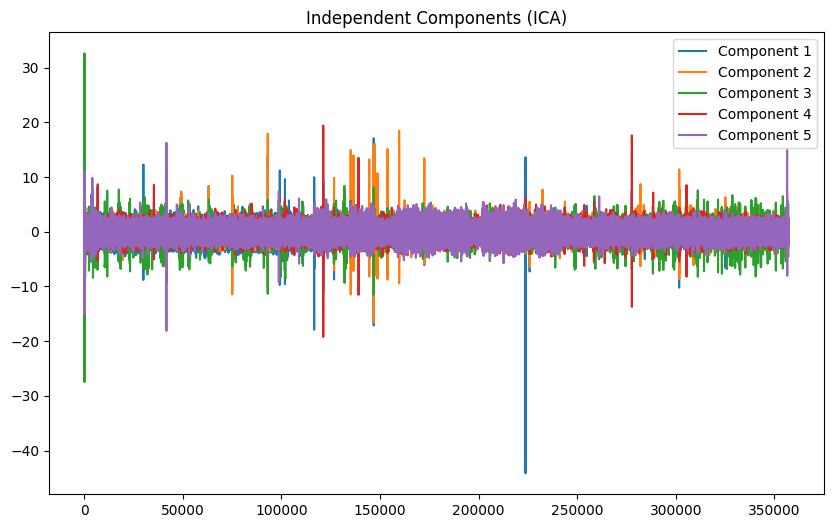

[[ 2.31124546e-03 -1.09538264e+00 -1.09420870e+00 ...  1.56613306e-03
   1.94257548e-03  3.67396153e-01]
 [-4.89938620e-03 -4.55888092e+00 -6.73068415e+00 ...  2.53179151e-03
   4.80689272e-03 -4.23742172e+00]
 [ 5.67642496e-03 -8.00069532e-01 -5.73324947e+00 ...  5.66726598e-03
   5.90817109e-03 -2.74239238e+00]
 ...
 [-2.51927716e-02  1.38429841e+01  1.33023068e+01 ... -1.90611810e-03
  -8.15459356e-03  4.54585883e+00]
 [-1.24719898e-02  5.24127454e+00  4.75158278e+00 ...  2.43149555e-04
  -2.12913816e-03  1.56573065e+00]
 [ 2.05697889e-03 -1.12607408e+00  2.16791205e-02 ...  2.89712984e-04
   7.35584554e-04  7.82175956e-01]]


In [ ]:
dat_reshaped = dat.values.reshape(dat.shape[0], -1)  # Flatten the last two dimensions

# Apply ICA
ica = FastICA(n_components=5, random_state=42)
components = ica.fit_transform(dat_reshaped)

# Plot the independent components
plt.figure(figsize=(10, 6))
for i in range(components.shape[1]):
    plt.plot(components[:, i], label=f"Component {i+1}")
plt.legend()
plt.title("Independent Components (ICA)")
plt.show()

# Reconstruct the signals without noise components (if needed)
X_cleaned = ica.inverse_transform(components)
print(X_cleaned)

Train Models after band pass filter and ICA

In [ ]:
X = subj
y = target

if y.ndim == 1:
    y = y.reshape(-1, 1)

X_reshaped = X.reshape(X.shape[0], -1)
ica = FastICA(n_components=5, random_state=42)
X_ica = ica.fit_transform(X_reshaped)
# Assuming X and y are already defined
# Ensure y is a 2D array for KBinsDiscretizer, even if it has a single column

# Convert continuous labels into categorical labels (dividing into 3 classes)
# If y contains continuous data, use KBinsDiscretizer to transform it into discrete classes
discretizer = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='uniform')
y_discrete = discretizer.fit_transform(y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_ica, y_discrete, test_size=0.4, random_state=42)

# Standardize the features
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# --- Train and evaluate Random Forest Classifier with MultiOutputClassifier ---
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model_multi = MultiOutputClassifier(rf_model)
rf_model_multi.fit(X_train_scaled, y_train)
y_pred_rf = rf_model_multi.predict(X_test_scaled)

# Evaluate Random Forest
rf_acc_list = []
rf_classification_reports = []
rf_confusion_matrices = []

for i in range(y_test.shape[1]):
    acc = accuracy_score(y_test[:, i], y_pred_rf[:, i])
    rf_acc_list.append(acc)
    print(f"\n--- Random Forest Metrics for Target {i + 1} ---")
    print("Classification Report:")
    print(classification_report(y_test[:, i], y_pred_rf[:, i]))
    print("Confusion Matrix:")
    print(confusion_matrix(y_test[:, i], y_pred_rf[:, i]))

rf_acc = np.mean(rf_acc_list)
print("\nRandom Forest Performance:")
print(f"Accuracy: {rf_acc:.2f}")

# --- Train and evaluate Support Vector Machine (SVC) using Linear Kernel with MultiOutputClassifier ---
svm_model = SVC(kernel='linear')
svm_model_multi = MultiOutputClassifier(svm_model)
svm_model_multi.fit(X_train_scaled, y_train)
y_pred_svm = svm_model_multi.predict(X_test_scaled)

# Evaluate SVM
svm_acc_list = []

for i in range(y_test.shape[1]):
    acc = accuracy_score(y_test[:, i], y_pred_svm[:, i])
    svm_acc_list.append(acc)
    print(f"\n--- SVM Metrics for Target {i + 1} ---")
    print("Classification Report:")
    print(classification_report(y_test[:, i], y_pred_svm[:, i]))
    print("Confusion Matrix:")
    print(confusion_matrix(y_test[:, i], y_pred_svm[:, i]))

svm_acc = np.mean(svm_acc_list)
print("\nSVM using Linear Performance:")
print(f"Accuracy: {svm_acc:.2f}")

# --- Train and evaluate Support Vector Machine (SVC) with MultiOutputClassifier ---
svm_model = SVC(kernel='rbf')
svm_model_multi = MultiOutputClassifier(svm_model)
svm_model_multi.fit(X_train_scaled, y_train)
y_pred_svm = svm_model_multi.predict(X_test_scaled)

# Evaluate SVM
svm_acc_list = []

for i in range(y_test.shape[1]):
    acc = accuracy_score(y_test[:, i], y_pred_svm[:, i])
    svm_acc_list.append(acc)
    print(f"\n--- SVM Metrics for Target {i + 1} ---")
    print("Classification Report:")
    print(classification_report(y_test[:, i], y_pred_svm[:, i]))
    print("Confusion Matrix:")
    print(confusion_matrix(y_test[:, i], y_pred_svm[:, i]))

svm_acc = np.mean(svm_acc_list)
print("\nSVM using RBF Performance:")
print(f"Accuracy: {svm_acc:.2f}")

# --- Train and evaluate Logistic Regression with MultiOutputClassifier ---
lr_model = LogisticRegression(max_iter=1000)
lr_model_multi = MultiOutputClassifier(lr_model)
lr_model_multi.fit(X_train_scaled, y_train)
y_pred_lr = lr_model_multi.predict(X_test_scaled)

# Evaluate Logistic Regression
lr_acc_list = []

for i in range(y_test.shape[1]):
    acc = accuracy_score(y_test[:, i], y_pred_lr[:, i])
    lr_acc_list.append(acc)
    print(f"\n--- Logistic Regression Metrics for Target {i + 1} ---")
    print("Classification Report:")
    print(classification_report(y_test[:, i], y_pred_lr[:, i]))
    print("Confusion Matrix:")
    print(confusion_matrix(y_test[:, i], y_pred_lr[:, i]))

lr_acc = np.mean(lr_acc_list)
print("\nLogistic Regression Performance:")
print(f"Accuracy: {lr_acc:.2f}")



--- Random Forest Metrics for Target 1 ---
Classification Report:
              precision    recall  f1-score   support

         0.0       0.87      0.91      0.89      5448
         1.0       0.84      0.85      0.85      5321
         2.0       0.94      0.90      0.92      5377

    accuracy                           0.89     16146
   macro avg       0.89      0.89      0.89     16146
weighted avg       0.89      0.89      0.89     16146

Confusion Matrix:
[[4970  429   49]
 [ 552 4514  255]
 [ 161  402 4814]]

Random Forest Performance:
Accuracy: 0.89

--- SVM Metrics for Target 1 ---
Classification Report:
              precision    recall  f1-score   support

         0.0       0.65      0.66      0.65      5448
         1.0       0.53      0.51      0.52      5321
         2.0       0.65      0.66      0.65      5377

    accuracy                           0.61     16146
   macro avg       0.61      0.61      0.61     16146
weighted avg       0.61      0.61      0.61     16146

Neural Network Models

In [ ]:
# --- Convert continuous labels into categorical labels ---
discretizer = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='uniform')
y_discrete = discretizer.fit_transform(y.reshape(-1, 1))  # Reshape y to 2D before discretizing
y_discrete = np.squeeze(y_discrete)  # Flatten to 1D
y_discrete_one_hot = to_categorical(y_discrete, num_classes=3)  # Convert to one-hot encoding

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_ica, y_discrete_one_hot, test_size=0.4, random_state=42)

# Standardize the features
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# --- Train and evaluate ANN (Artificial Neural Network) ---
ann_model = Sequential()
ann_model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
ann_model.add(Dense(32, activation='relu'))
ann_model.add(Dense(y_train.shape[1], activation='softmax'))  # For multi-class classification

ann_model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
ann_model.fit(X_train_scaled, y_train, epochs=30, batch_size=32, verbose=1)
y_pred_ann = ann_model.predict(X_test_scaled)

# Evaluate ANN
print("\n--- ANN Metrics ---")
print(f"Accuracy: {accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_pred_ann, axis=1)):.2f}")
print("Classification Report:")
print(classification_report(np.argmax(y_test, axis=1), np.argmax(y_pred_ann, axis=1)))
print("Confusion Matrix:")
print(confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred_ann, axis=1)))

# --- Train and evaluate DNN (Deep Neural Network) ---
dnn_model = Sequential()
dnn_model.add(Dense(128, input_dim=X_train.shape[1], activation='relu'))
dnn_model.add(Dense(64, activation='relu'))
dnn_model.add(Dense(32, activation='relu'))
dnn_model.add(Dense(y_train.shape[1], activation='softmax'))  # For multi-class classification

dnn_model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
dnn_model.fit(X_train_scaled, y_train, epochs=30, batch_size=32, verbose=1)
y_pred_dnn = dnn_model.predict(X_test_scaled)

# Evaluate DNN
print("\n--- DNN Metrics ---")
print(f"Accuracy: {accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_pred_dnn, axis=1)):.2f}")
print("Classification Report:")
print(classification_report(np.argmax(y_test, axis=1), np.argmax(y_pred_dnn, axis=1)))
print("Confusion Matrix:")
print(confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred_dnn, axis=1)))

# --- Train and evaluate RNN (Recurrent Neural Network) ---
rnn_model = Sequential()
rnn_model.add(SimpleRNN(64, input_shape=(X_train_scaled.shape[1], 1), activation='relu'))
rnn_model.add(Dense(y_train.shape[1], activation='softmax'))

rnn_model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
rnn_model.fit(X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1)), y_train, epochs=30, batch_size=32, verbose=1)
y_pred_rnn = rnn_model.predict(X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1)))

# Evaluate RNN
print("\n--- RNN Metrics ---")
print(f"Accuracy: {accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_pred_rnn, axis=1)):.2f}")
print("Classification Report:")
print(classification_report(np.argmax(y_test, axis=1), np.argmax(y_pred_rnn, axis=1)))
print("Confusion Matrix:")
print(confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred_rnn, axis=1)))

# --- Train and evaluate LSTM ---
lstm_model = Sequential()
lstm_model.add(LSTM(64, input_shape=(X_train_scaled.shape[1], 1), activation='relu'))
lstm_model.add(Dense(y_train.shape[1], activation='softmax'))

lstm_model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
lstm_model.fit(X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1)), y_train, epochs=30, batch_size=32, verbose=1)
y_pred_lstm = lstm_model.predict(X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1)))

# Evaluate LSTM
print("\n--- LSTM Metrics ---")
print(f"Accuracy: {accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_pred_lstm, axis=1)):.2f}")
print("Classification Report:")
print(classification_report(np.argmax(y_test, axis=1), np.argmax(y_pred_lstm, axis=1)))
print("Confusion Matrix:")
print(confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred_lstm, axis=1)))

# --- Train and evaluate MLP (Multilayer Perceptron) ---
mlp_model = Sequential()
mlp_model.add(Dense(128, input_dim=X_train.shape[1], activation='relu'))
mlp_model.add(Dense(64, activation='relu'))
mlp_model.add(Dense(32, activation='relu'))
mlp_model.add(Dense(y_train.shape[1], activation='softmax'))  # For multi-class classification

mlp_model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
mlp_model.fit(X_train_scaled, y_train, epochs=30, batch_size=32, verbose=1)
y_pred_mlp = mlp_model.predict(X_test_scaled)

# Evaluate MLP
print("\n--- MLP Metrics ---")
print(f"Accuracy: {accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_pred_mlp, axis=1)):.2f}")
print("Classification Report:")
print(classification_report(np.argmax(y_test, axis=1), np.argmax(y_pred_mlp, axis=1)))
print("Confusion Matrix:")
print(confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred_mlp, axis=1)))

Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.5896 - loss: 0.8656
Epoch 2/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.6845 - loss: 0.7249
Epoch 3/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7043 - loss: 0.6825
Epoch 4/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7241 - loss: 0.6507
Epoch 5/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7271 - loss: 0.6411
Epoch 6/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7284 - loss: 0.6297
Epoch 7/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7365 - loss: 0.6133
Epoch 8/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7338 - loss: 0.6101
Epoch 9/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7500 - loss: 0.5851
Epoch 10/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7445 - loss: 0.5925
Epoch 11/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7463 - loss: 0.5807
Epoch 12/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.6136 - loss: 0.8328
Epoch 2/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.7060 - loss: 0.6732
Epoch 3/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.7280 - loss: 0.6243
Epoch 4/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7449 - loss: 0.5889
Epoch 5/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7505 - loss: 0.5710
Epoch 6/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7583 - loss: 0.5535
Epoch 7/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.7627 - loss: 0.5496
Epoch 8/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7708 - loss: 0.5294
Epoch 9/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7704 - loss: 0.5240
Epoch 10/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7784 - loss: 0.5091
Epoch 11/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7792 - loss: 0.5101
Epoch 12/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.5925 - loss: 0.8553
Epoch 2/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.6829 - loss: 0.7091
Epoch 3/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7063 - loss: 0.6672
Epoch 4/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7259 - loss: 0.6396
Epoch 5/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7329 - loss: 0.6198
Epoch 6/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7376 - loss: 0.6013
Epoch 7/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7476 - loss: 0.5856
Epoch 8/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7523 - loss: 0.5776
Epoch 9/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7542 - loss: 0.5701
Epoch 10/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7639 - loss: 0.5585
Epoch 11/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7591 - loss: 0.5518
Epoch 12/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


757/757 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.4633 - loss: 1.0274
Epoch 2/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.6287 - loss: 0.8030
Epoch 3/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.6843 - loss: 0.7207
Epoch 4/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.7025 - loss: 0.6843
Epoch 5/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - accuracy: 0.7077 - loss: 0.6659
Epoch 6/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.7135 - loss: 0.6549
Epoch 7/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7190 - loss: 0.6383
Epoch 8/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.7234 - loss: 0.6319
Epoch 9/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.7350 - loss: 0.6095
Epoch 10/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.7384 - loss: 0.6032
Epoch 11/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.7445 - loss: 0.5905
Epoch 12/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.6281 - loss: 0.8130
Epoch 2/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7079 - loss: 0.6694
Epoch 3/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7283 - loss: 0.6247
Epoch 4/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.7349 - loss: 0.6014
Epoch 5/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.7485 - loss: 0.5770
Epoch 6/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7540 - loss: 0.5655
Epoch 7/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7663 - loss: 0.5424
Epoch 8/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7689 - loss: 0.5316
Epoch 9/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7730 - loss: 0.5221
Epoch 10/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.7743 - loss: 0.5168
Epoch 11/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7840 - loss: 0.5091
Epoch 12/30
757/757 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy

In [ ]:
# Convert y_train and y_test from one-hot encoding to single labels
y_train_labels = np.argmax(y_train, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_ica, y_discrete_one_hot, test_size=0.4, random_state=42)

# Standardize the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the KNN model with 5 neighbors
knn = KNeighborsClassifier(n_neighbors=5)

# Train the model
knn.fit(X_train_scaled, y_train_labels)

# Make predictions on the test set
y_pred_knn = knn.predict(X_test_scaled)

# Evaluate the KNN model
print("\nKNN Classifier Evaluation after ICA:")
print(f'Accuracy: {accuracy_score(y_test_labels, y_pred_knn)}')
print(f'Precision: {precision_score(y_test_labels, y_pred_knn, average="weighted")}')
print(f'Recall: {recall_score(y_test_labels, y_pred_knn, average="weighted")}')
print(f'F1 Score: {f1_score(y_test_labels, y_pred_knn, average="weighted")}')
print("Confusion Matrix for KNN:")
print(confusion_matrix(y_test_labels, y_pred_knn))
print("Classification Report for KNN:")
print(classification_report(y_test_labels, y_pred_knn))


KNN Classifier Evaluation after ICA:
Accuracy: 0.8779883562492258
Precision: 0.8796039287238878
Recall: 0.8779883562492258
F1 Score: 0.8784282753871072
Confusion Matrix for KNN:
[[4903  486   59]
 [ 528 4526  267]
 [ 161  469 4747]]
Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      5448
           1       0.83      0.85      0.84      5321
           2       0.94      0.88      0.91      5377

    accuracy                           0.88     16146
   macro avg       0.88      0.88      0.88     16146
weighted avg       0.88      0.88      0.88     16146



### ROC curves for model evaluation

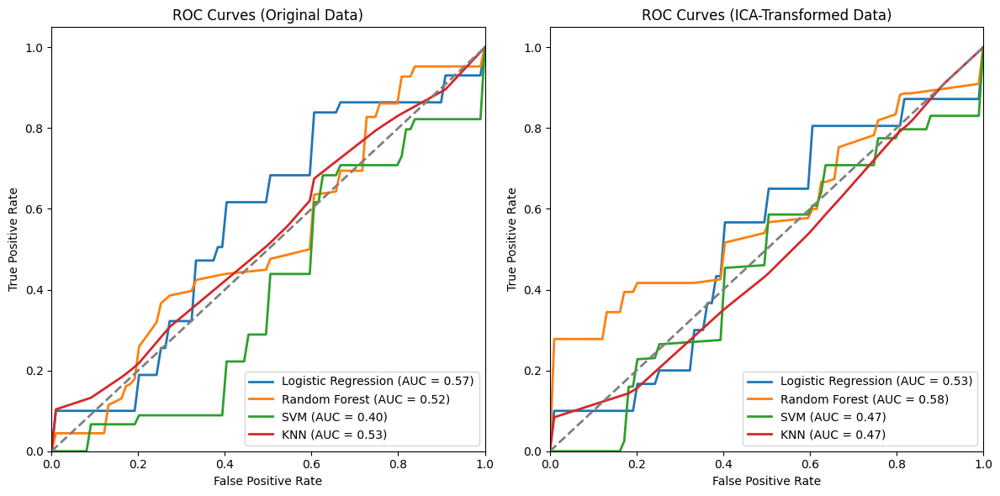

In [ ]:
# Generate some example data
np.random.seed(0)
X = np.random.rand(100, 10)
y = np.random.randint(0, 2, 100)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

# Define models
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(probability=True),
    'KNN': KNeighborsClassifier(n_neighbors=5)
}

# Apply ICA
ica = FastICA(n_components=10, random_state=0)
X_train_ica = ica.fit_transform(X_train)
X_test_ica = ica.transform(X_test)

# K-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=0)

# Function to compute ROC curve and AUC
def compute_roc_auc(model, X, y):
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)

    for train, test in kf.split(X, y):
        model.fit(X[train], y[train])
        y_pred = model.predict_proba(X[test])[:, 1]
        fpr, tpr, _ = roc_curve(y[test], y_pred)
        tprs.append(np.interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    return mean_fpr, mean_tpr, mean_auc

# Plot ROC curves for original data
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
for name, model in models.items():
    fpr, tpr, roc_auc = compute_roc_auc(model, X_train, y_train)
    plt.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves (Original Data)')
plt.legend(loc="lower right")

# Plot ROC curves for ICA-transformed data
plt.subplot(1, 2, 2)
for name, model in models.items():
    fpr, tpr, roc_auc = compute_roc_auc(model, X_train_ica, y_train)
    plt.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves (ICA-Transformed Data)')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()